## Preparción de datos

In [2]:
import pickle
import logging
import math

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, silhouette_score
from sklearn.metrics.pairwise import nan_euclidean_distances
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.cluster import MiniBatchKMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import umap

logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

ruta_guardado = r"C:\Users\mario\Desktop\MasterCienciadeDatos\TFM\TFM_MarioSoto\src\data_lake\PKL\dfs_final_maratones2.pkl" #se coge dfs_final del EDA general

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [4]:
with open(ruta_guardado, 'rb') as f:
    dfs_final_maratones2 = pickle.load(f)

In [5]:
dfs = dfs_final_maratones2

In [6]:
athletes_df = dfs['athletes_df'] 
athletes_events_df = dfs['athletes_events_df']
athletes_time_df = dfs['athletes_time_df']

issues_df = dfs['issues_df']
issues_events_df = dfs['issues_events_df']
issues_data_df = dfs['issues_data_df']
issues_times_df = dfs['issues_times_df']

In [7]:
athletes_time_df.columns

Index(['athlete_id', 'average', 'distance', 'event_id', 'incidence',
       'isBackup', 'netTime', 'offset', 'order', 'race_id', 'rawTime', 'split',
       'time', 'event_std', 'netTime_td', 'time_td'],
      dtype='object')

In [8]:
for race, grupo in athletes_time_df.groupby('race_id'):
    tabla_nan = (grupo
                 .drop(columns='race_id')
                 .isna()
                 .mean() * 100
                ).reset_index()
    
    tabla_nan.columns = ['columna', 'porcentaje_nan']
    
    print(f"\nRace ID: {race}")
    print(tabla_nan)


Race ID: 609139b1-d6bd-4553-ac89-2f648787a60d
       columna  porcentaje_nan
0   athlete_id         0.00000
1      average         0.00000
2     distance         0.00000
3     event_id         0.00000
4    incidence        99.72798
5     isBackup        99.76904
6      netTime         0.00000
7       offset        99.76904
8        order         0.00000
9      rawTime         0.00000
10       split         0.00000
11        time         0.00000
12   event_std         0.00000
13  netTime_td         0.00000
14     time_td         0.00000

Race ID: 72a81045-fb27-43e6-a201-b1d42be42fac
       columna  porcentaje_nan
0   athlete_id        0.000000
1      average        0.000000
2     distance        0.000000
3     event_id        0.000000
4    incidence       99.970578
5     isBackup       99.975324
6      netTime        0.000000
7       offset       99.975324
8        order        0.000000
9      rawTime        0.000000
10       split        0.000000
11        time        0.000000
12   ev

In [9]:
athletes_time_df.head(5)

,athlete_id,average,distance,event_id,incidence,isBackup,netTime,offset,order,race_id,rawTime,split,time,event_std,netTime_td,time_td
0,200,0.00000,0,Maratón,True,NaN,0,NaN,1,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 07:30:10.010,Salida,10,maraton,0 days 00:00:00,0 days 00:00:00.010000
1,200,0.17981,5000,Maratón,NaN,NaN,899020,NaN,2,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 07:45:09.030,5K,899030,maraton,0 days 00:14:59.020000,0 days 00:14:59.030000
2,200,0.17988,10000,Maratón,NaN,NaN,1798768,NaN,3,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 08:00:08.778,10K,1798778,maraton,0 days 00:29:58.768000,0 days 00:29:58.778000
3,200,0.17903,13000,Maratón,NaN,NaN,2327380,NaN,4,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 08:08:57.390,Asics,2327390,maraton,0 days 00:38:47.380000,0 days 00:38:47.390000
4,200,0.17905,15000,Maratón,NaN,NaN,2685770,NaN,5,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 08:14:55.780,15K,2685780,maraton,0 days 00:44:45.770000,0 days 00:44:45.780000


In [10]:
race_ids = [
    'af5c5746-04e8-42ab-9610-b12f0d9125b1', '609139b1-d6bd-4553-ac89-2f648787a60d', '72a81045-fb27-43e6-a201-b1d42be42fac']
splits_carreras = athletes_time_df[athletes_time_df['race_id'].isin(race_ids)]['split'].unique()
print(f"Splits de las carreras seleccionadas: {splits_carreras}")

Splits de las carreras seleccionadas: ['Salida' '5K' '10K' 'Asics' '15K' '20K' 'Media' '25K' '30K' 'Asics 2'
 '35K' '40K' 'Spotter' 'Meta' '10K v4Con' '10K v4Sin' 'Postsalida'
 'Premeta']


In [11]:
'''
import pandas as pd

# Filtro
athlete_id = '8Y2B2549'
race_id = "49603c2f-1b2b-457f-b82e-fed8bded1d3d"
event_id = 'Marato'
filtered = athletes_time_df.loc[
    (athletes_time_df["athlete_id"] == athlete_id) &
    (athletes_time_df["race_id"] == race_id) &
    (athletes_time_df["event_id"] == event_id)
]

filtered
'''

'\nimport pandas as pd\n\n# Filtro\nathlete_id = \'8Y2B2549\'\nrace_id = "49603c2f-1b2b-457f-b82e-fed8bded1d3d"\nevent_id = \'Marato\'\nfiltered = athletes_time_df.loc[\n    (athletes_time_df["athlete_id"] == athlete_id) &\n    (athletes_time_df["race_id"] == race_id) &\n    (athletes_time_df["event_id"] == event_id)\n]\n\nfiltered\n'

In [12]:
split_cols_maraton = ['5K','10K','15K','20K', 'Media', '25K', '30K', '35K', '40K', 'Meta']

Añadimos las variables que necesitamos para el cálculo de diferentes métricas, como el tiempo por split, el split previo y el orden de los splits

In [13]:
# Copiar el DataFrame original
df = athletes_time_df.copy()

# Filtrar solo splits definidos en split_cols
df = df[df['split'].isin(split_cols_maraton)].copy()

# Convertir netTime a segundos
df['netTime_sec'] = df['netTime_td'].dt.total_seconds() 

# Ordenar por atleta, carrera, evento y tiempo acumulado
df = df.sort_values(['athlete_id', 'race_id', 'event_id', 'netTime_sec'])

# Crear columnas de referencia al split anterior
df['prev_netTime'] = df.groupby(['athlete_id', 'race_id', 'event_id'])['netTime_sec'].shift(1) 
df['prev_split'] = df.groupby(['athlete_id', 'race_id', 'event_id'])['split'].shift(1)

# Identificar el primer split
df['first_split'] = df.groupby(['athlete_id', 'race_id', 'event_id']).cumcount() == 0
df['time_split_sec'] = 0.0
df.loc[df['split'] == 'Salida', 'time_split_sec'] = 0.0

# Calcular tiempo del primer split después de la salida
mask_first = df['first_split'] & (df['split'] != 'Salida')
df.loc[mask_first, 'time_split_sec'] = df.loc[mask_first, 'netTime_sec'] 

# Calcular tiempo de los splits restantes
mask_rest = ~df['first_split'] & (df['split'] != 'Salida')
df.loc[mask_rest, 'time_split_sec'] = df.loc[mask_rest, 'netTime_sec'] - df.loc[mask_rest, 'prev_netTime']

# Orden de splits
df['split_order'] = df.groupby(['athlete_id', 'race_id', 'event_id']).cumcount() 

# Actualizar DataFrame original
athletes_time_df['time_split_sec'] = df['time_split_sec']
athletes_time_df['prev_split'] = df['prev_split']
athletes_time_df['split_order'] = df['split_order']

# Detectar splits con tiempo negativo
negativos = df[df['time_split_sec'] < 0] 
display(negativos[['athlete_id','race_id','event_id','prev_split','split','netTime_td','time_split_sec','split_order']])

,athlete_id,race_id,event_id,prev_split,split,netTime_td,time_split_sec,split_order


In [14]:
df.head(5)

,athlete_id,average,distance,event_id,incidence,isBackup,netTime,offset,order,race_id,rawTime,split,time,event_std,netTime_td,time_td,netTime_sec,prev_netTime,prev_split,first_split,time_split_sec,split_order
155015,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,0.32100,5000,Maratón,NaN,NaN,1455899,NaN,2,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 07:56:55.008,5K,1605008,maraton,0 days 00:24:15.899000,0 days 00:26:45.008000,1455.899,NaN,NaN,True,1455.899,0
155016,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,0.30503,10000,Maratón,NaN,NaN,2901204,NaN,3,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 08:21:00.313,10K,3050313,maraton,0 days 00:48:21.204000,0 days 00:50:50.313000,2901.204,1455.899,5K,False,1445.305,1
155018,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,0.29566,15000,Maratón,NaN,NaN,4285758,NaN,5,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 08:44:04.867,15K,4434867,maraton,0 days 01:11:25.758000,0 days 01:13:54.867000,4285.758,2901.204,10K,False,1384.554,2
155019,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,0.29379,20000,Maratón,NaN,NaN,5726682,NaN,6,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 09:08:05.791,20K,5875791,maraton,0 days 01:35:26.682000,0 days 01:37:55.791000,5726.682,4285.758,15K,False,1440.924,3
155020,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,0.29362,21097,Maratón,NaN,NaN,6045471,NaN,7,af5c5746-04e8-42ab-9610-b12f0d9125b1,2025-02-23 09:13:24.580,Media,6194580,maraton,0 days 01:40:45.471000,0 days 01:43:14.580000,6045.471,5726.682,20K,False,318.789,4


In [15]:
import pandas as pd

# Supongamos que tu DataFrame se llama df
# Filtramos por los valores deseados
race_id_filter = 'af5c5746-04e8-42ab-9610-b12f0d9125b1'
event_id_filter = 'Maratón'
athlete_id_filter = '004918f9-3d4a-56e8-8ee2-c47e7e6b56bb'
split_filter = 'Meta'

df_filtered = df[
    (df['race_id'] == race_id_filter) &
    (df['event_id'] == event_id_filter) &
    (df['athlete_id'] == athlete_id_filter) &
    (df['split'] == split_filter)
]

# Mostrar netTime_td
print(df_filtered)

                                  athlete_id  average  distance event_id  \
155027  004918f9-3d4a-56e8-8ee2-c47e7e6b56bb  0.29744     42195  Maratón   

       incidence isBackup   netTime  offset  order  \
155027       NaN      NaN  12401489     NaN     14   

                                     race_id                 rawTime split  \
155027  af5c5746-04e8-42ab-9610-b12f0d9125b1 2025-02-23 10:59:20.598  Meta   

            time event_std             netTime_td                time_td  \
155027  12550598   maraton 0 days 03:26:41.489000 0 days 03:29:10.598000   

        netTime_sec  prev_netTime prev_split  first_split  time_split_sec  \
155027    12401.489     11710.731        40K        False         690.758   

        split_order  
155027            9  


In [16]:
for race, grupo in df.groupby('race_id'):
    tabla_nan = (grupo
                 .drop(columns='race_id')
                 .isna()
                 .mean() * 100
                ).reset_index()
    
    tabla_nan.columns = ['columna', 'porcentaje_nan']
    
    print(f"\nRace ID: {race}")
    print(tabla_nan)


Race ID: 609139b1-d6bd-4553-ac89-2f648787a60d
           columna  porcentaje_nan
0       athlete_id        0.000000
1          average        0.000000
2         distance        0.000000
3         event_id        0.000000
4        incidence       99.689046
5         isBackup       99.737280
6          netTime        0.000000
7           offset       99.737280
8            order        0.000000
9          rawTime        0.000000
10           split        0.000000
11            time        0.000000
12       event_std        0.000000
13      netTime_td        0.000000
14         time_td        0.000000
15     netTime_sec        0.000000
16    prev_netTime       10.624782
17      prev_split       10.624782
18     first_split        0.000000
19  time_split_sec        0.000000
20     split_order        0.000000

Race ID: 72a81045-fb27-43e6-a201-b1d42be42fac
           columna  porcentaje_nan
0       athlete_id        0.000000
1          average        0.000000
2         distance        0.000

In [17]:
def preparar_datos(
    athletes_events_df, athletes_time_df, athletes_df,
    race_id_filter=None, event_std_filter='media', split_cols=None
):
    """
    Función general que combina la preparación de datos para KNN, regresión y clustering.
    Retorna df_wide listo con:
      - tiempos por split (segundos)
      - rawTime por split
      - información de edad, género, total_time_sec, club y age_group
    Además:
      - Elimina filas con valores nulos en columnas clave
      - Elimina filas con valores negativos en columnas numéricas
      - Lanza warnings indicando cuántas filas se eliminaron
    """

    print("=== Filtrando eventos ===")
    filtered_events = athletes_events_df[
        (athletes_events_df['splitsMissing']==0) & 
        (athletes_events_df['maxConsecutiveSplitsMissing']==0) &
        (athletes_events_df['event_std']==event_std_filter)
    ][['athlete_id','event_id','event_std','race_id']]
    print(f"Eventos filtrados: {len(filtered_events)} filas")

    print("=== Haciendo merge con times ===")
    df_merged = athletes_time_df.merge(filtered_events, on=['athlete_id','event_id','race_id'], how='inner')
    print(f"Merge terminado: {len(df_merged)} filas")

    extra_cols = ['gender','birthdate','club','distance']
    df_merged = df_merged.merge(
        athletes_df[['athlete_id'] + [c for c in extra_cols if c in athletes_df.columns]],
        on='athlete_id', how='left'
    )
    print(f"Merge con atletas info: {len(df_merged)} filas")

    if race_id_filter is not None and 'race_id' in df_merged.columns:
        if isinstance(race_id_filter, (list, tuple, set)):
            df_merged = df_merged[df_merged['race_id'].isin(race_id_filter)]
        else:
            df_merged = df_merged[df_merged['race_id'] == race_id_filter]
        print(f"Filtrado por race_id_filter: {len(df_merged)} filas")

    base_cols = ['athlete_id','event_id','race_id','split','time_split_sec','rawTime','split_order']
    base_cols += [c for c in ['distance','club','gender','birthdate'] if c in df_merged.columns]
    df_subset = df_merged[[c for c in base_cols if c in df_merged.columns]].copy()
    df_subset = df_subset[df_subset['split']!='Salida']
    df_subset = df_subset[df_subset['split'].isin(split_cols)]
    print(f"df_subset con splits != 'Salida': {len(df_subset)} filas")

    key_cols = ['time_split_sec','rawTime','birthdate'] + ([c for c in ['distance','split_order'] if c in df_subset.columns])
    n_filas_nulas = df_subset[key_cols].isna().any(axis=1).sum()
    print(f"Filas con valores nulos en columnas clave: {n_filas_nulas}")
    df_subset = df_subset.dropna(subset=key_cols)

    num_cols = ['time_split_sec']
    if 'distance' in df_subset.columns:
        num_cols.append('distance')
    negativos = (df_subset[num_cols] < 0).any(axis=1)
    n_filas_neg = negativos.sum()
    print(f"Filas con valores negativos: {n_filas_neg}")
    df_subset = df_subset[~negativos]

    print("=== Revisando splits por atleta ===")
    split_counts = df_subset.groupby('athlete_id')['split'].nunique()
    expected_splits = len(split_cols)  # solo los splits que queremos analizar
    print(f"Expected splits: {expected_splits}")
    athletes_complete = split_counts[split_counts == len(split_cols)].index
    print(f"Atletas con todos los splits: {len(athletes_complete)}")
    df_subset = df_subset[df_subset['athlete_id'].isin(athletes_complete)]
    print(f"df_subset final después de filtrar atletas completos: {len(df_subset)} filas")

    index_cols = ['athlete_id','race_id','event_id']
    df_wide = df_subset.pivot_table(index=index_cols, columns='split', values='time_split_sec')
    df_wide.reset_index(inplace=True)
    print(f"df_wide columns: {df_wide.columns.tolist()}")

    df_rawTime = df_subset.pivot_table(index=index_cols, columns='split', values='rawTime')
    print("Pivot rawTime terminado. Columnas:", df_rawTime.columns.tolist())

    # Construcción de split_cols_existing
    if split_cols:
        split_cols_existing = [f'rawTime_{c}' if not str(c).startswith('rawTime_') else c for c in split_cols]
    else:
        split_cols_existing = df_rawTime.columns.tolist()
    df_rawTime = df_rawTime.rename(columns=lambda c: f'rawTime_{c}' if not str(c).startswith('rawTime_') else c)
    split_cols_existing = [c for c in split_cols_existing if c in df_rawTime.columns]
    print("split_cols_existing después de filtrar por columnas existentes:", split_cols_existing)

    if not split_cols_existing:
        print("WARNING: split_cols_existing está vacío. Revisar nombres de splits y filtrado de atletas.")

    df_rawTime = df_rawTime.reset_index()
    df_rawTime = df_rawTime[index_cols + split_cols_existing]

    print("Columnas df_wide antes del merge:", df_wide.columns.tolist())
    df_wide = df_wide.merge(df_rawTime, on=index_cols, how='left')
    print("Merge completado. Columnas df_wide ahora:", df_wide.columns.tolist())

    # Reordenar columnas
    if split_cols:
        time_cols_existing = [c for c in split_cols if c in df_wide.columns]
        raw_cols_existing = [f'rawTime_{c}' for c in split_cols if f'rawTime_{c}' in df_wide.columns]
        resto_cols = [c for c in df_wide.columns if c not in index_cols + time_cols_existing + raw_cols_existing]
        df_wide = df_wide[index_cols + time_cols_existing + raw_cols_existing + resto_cols]

    print("=== Calculando información de atletas ===")
    athletes_info = df_subset.groupby('athlete_id').first()[['gender','birthdate','club']].reset_index()
    athletes_info['birthdate'] = pd.to_datetime(athletes_info['birthdate'])

    if split_cols_existing:
        last_split = split_cols_existing[-1]
        df_last_rawTime = df_rawTime[['athlete_id', last_split]].rename(columns={last_split:'race_date'})
        athletes_info = athletes_info.merge(df_last_rawTime, on='athlete_id', how='left')
        athletes_info['race_date'] = pd.to_datetime(athletes_info['race_date'])
        athletes_info['age'] = (athletes_info['race_date'] - athletes_info['birthdate']).dt.days / 365.25
    else:
        print("No hay splits existentes para calcular race_date y age.")
        athletes_info['age'] = None

    athletes_info['gender'] = athletes_info['gender'].map({'male':0,'female':1})

    bins = [0, 20, 30, 40, 50, 100]
    labels = ['<20','20-29','30-39','40-49','50+']
    athletes_info['age_group'] = pd.cut(athletes_info['age'], bins=bins, labels=labels, right=False)

    time_cols = [c for c in split_cols_existing if not str(c).startswith('rawTime_')]
    if time_cols:
        total_time_df = df_wide[time_cols].sum(axis=1)
        athletes_info['total_time_sec'] = total_time_df
    else:
        athletes_info['total_time_sec'] = None

    df_wide = df_wide.merge(
        athletes_info[['athlete_id','gender','age','age_group','club','total_time_sec']],
        on='athlete_id', how='left'
    )

    print("df_wide final listo. Filas:", len(df_wide))
    return df_wide

In [18]:
df_wide_maraton = preparar_datos(athletes_events_df, athletes_time_df, athletes_df,
                                                             race_id_filter=['af5c5746-04e8-42ab-9610-b12f0d9125b1', '609139b1-d6bd-4553-ac89-2f648787a60d', '72a81045-fb27-43e6-a201-b1d42be42fac', '8bbfdd2e-da3d-4934-a1c5-8fbd303d4974'],
                                                             event_std_filter='maraton', split_cols=split_cols_maraton)

=== Filtrando eventos ===
Eventos filtrados: 25808 filas
=== Haciendo merge con times ===
Merge terminado: 246330 filas
Merge con atletas info: 860852 filas
Filtrado por race_id_filter: 860852 filas
df_subset con splits != 'Salida': 657987 filas
Filas con valores nulos en columnas clave: 45
Filas con valores negativos: 0
=== Revisando splits por atleta ===
Expected splits: 10
Atletas con todos los splits: 12632
df_subset final después de filtrar atletas completos: 650670 filas
df_wide columns: ['athlete_id', 'race_id', 'event_id', '10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta']
Pivot rawTime terminado. Columnas: ['10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta']
split_cols_existing después de filtrar por columnas existentes: ['rawTime_5K', 'rawTime_10K', 'rawTime_15K', 'rawTime_20K', 'rawTime_Media', 'rawTime_25K', 'rawTime_30K', 'rawTime_35K', 'rawTime_40K', 'rawTime_Meta']
Columnas df_wide antes del merge: ['athlete_id', 'race_id', 'event

In [19]:
df_wide_maraton.head(5)

,athlete_id,race_id,event_id,5K,10K,15K,20K,Media,25K,30K,35K,40K,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,age_group,club,total_time_sec
0,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,1455.899,1445.305,1384.554,1440.924,318.789,1118.106,1471.904,1486.052,1589.198,690.758,2025-02-23 07:56:55.008000000,2025-02-23 08:21:00.312999936,2025-02-23 08:44:04.867000064,2025-02-23 09:08:05.791000064,2025-02-23 09:13:24.580000000,2025-02-23 09:32:02.686000128,2025-02-23 09:56:34.590000128,2025-02-23 10:21:20.641999872,2025-02-23 10:47:49.840000000,2025-02-23 10:59:20.598000128,0,39.660507,30-39,TIGERS RUNNING CLUB,None
1,0093e521-ebbb-52d8-b83d-21b09bb0fadc,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,921.653,928.791,920.270,970.405,210.511,773.024,999.416,1048.305,1104.195,461.720,2025-02-23 07:45:34.343000064,2025-02-23 08:01:03.134000128,2025-02-23 08:16:23.404000000,2025-02-23 08:32:33.808999936,2025-02-23 08:36:04.320000000,2025-02-23 08:48:57.344000000,2025-02-23 09:05:36.760000000,2025-02-23 09:23:05.064999936,2025-02-23 09:41:29.260000000,2025-02-23 09:49:10.980000000,0,28.429843,20-29,nan,None
2,029265fe-fe78-555c-a9b4-c08420f93fc5,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,896.830,900.888,898.087,929.871,196.584,699.864,902.086,924.390,944.070,410.494,2025-02-23 07:45:08.180000000,2025-02-23 08:00:09.068000000,2025-02-23 08:15:07.155000064,2025-02-23 08:30:37.025999872,2025-02-23 08:33:53.609999872,2025-02-23 08:45:33.473999872,2025-02-23 09:00:35.560000000,2025-02-23 09:15:59.950000128,2025-02-23 09:31:44.020000000,2025-02-23 09:38:34.513999872,0,38.554415,30-39,nan,None
3,041ffa9b-2854-5a21-94c2-712bf69c6758,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,922.544,921.955,915.271,946.367,193.595,711.239,908.141,964.455,1067.005,495.860,2025-02-23 07:45:33.561999872,2025-02-23 08:00:55.516999936,2025-02-23 08:16:10.788000000,2025-02-23 08:31:57.155000064,2025-02-23 08:35:10.750000128,2025-02-23 08:47:01.988999936,2025-02-23 09:02:10.129999872,2025-02-23 09:18:14.584999936,2025-02-23 09:36:01.590000128,2025-02-23 09:44:17.449999872,0,32.353183,30-39,nan,None
4,05d241c6-1058-528b-a79b-ee383e46706f,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,899.312,898.471,887.357,913.023,194.607,698.426,904.564,917.838,905.912,398.829,2025-02-23 07:45:09.312000000,2025-02-23 08:00:07.783000064,2025-02-23 08:14:55.140000000,2025-02-23 08:30:08.163000064,2025-02-23 08:33:22.769999872,2025-02-23 08:45:01.196000000,2025-02-23 09:00:05.760000000,2025-02-23 09:15:23.598000128,2025-02-23 09:30:29.510000128,2025-02-23 09:37:08.339000064,0,30.130048,30-39,nan,None


In [20]:
for race, grupo in df_wide_maraton.groupby('race_id'):
    tabla_nan = (grupo
                 .drop(columns='race_id')
                 .isna()
                 .mean() * 100
                ).reset_index()
    
    tabla_nan.columns = ['columna', 'porcentaje_nan']
    
    print(f"\nRace ID: {race}")
    print(tabla_nan)


Race ID: 609139b1-d6bd-4553-ac89-2f648787a60d
           columna  porcentaje_nan
0       athlete_id        0.000000
1         event_id        0.000000
2               5K        0.000000
3              10K       44.186047
4              15K       51.162791
5              20K       51.162791
6            Media       51.162791
7              25K       51.162791
8              30K       51.162791
9              35K       51.162791
10             40K       51.162791
11            Meta       51.162791
12      rawTime_5K        0.000000
13     rawTime_10K       44.186047
14     rawTime_15K       51.162791
15     rawTime_20K       51.162791
16   rawTime_Media       51.162791
17     rawTime_25K       51.162791
18     rawTime_30K       51.162791
19     rawTime_35K       51.162791
20     rawTime_40K       51.162791
21    rawTime_Meta       51.162791
22          gender        0.000000
23             age       23.255814
24       age_group       23.255814
25            club        0.000000
26  tota

In [21]:
df_wide_maraton.shape

(31205, 28)

In [22]:
for race, grupo in df_wide_maraton.groupby('race_id'):
    tabla_nan = (grupo
                 .drop(columns='race_id')
                 .isna()
                 .mean() * 100
                ).reset_index()
    
    tabla_nan.columns = ['columna', 'porcentaje_nan']
    
    print(f"\nRace ID: {race}")
    print(tabla_nan)


Race ID: 609139b1-d6bd-4553-ac89-2f648787a60d
           columna  porcentaje_nan
0       athlete_id        0.000000
1         event_id        0.000000
2               5K        0.000000
3              10K       44.186047
4              15K       51.162791
5              20K       51.162791
6            Media       51.162791
7              25K       51.162791
8              30K       51.162791
9              35K       51.162791
10             40K       51.162791
11            Meta       51.162791
12      rawTime_5K        0.000000
13     rawTime_10K       44.186047
14     rawTime_15K       51.162791
15     rawTime_20K       51.162791
16   rawTime_Media       51.162791
17     rawTime_25K       51.162791
18     rawTime_30K       51.162791
19     rawTime_35K       51.162791
20     rawTime_40K       51.162791
21    rawTime_Meta       51.162791
22          gender        0.000000
23             age       23.255814
24       age_group       23.255814
25            club        0.000000
26  tota

In [23]:
def crear_features_carrera(df, split_cols, pace_cols, debug=False):
    """
    Crea variables derivadas para predicción de splits en maratón:
        - Incrementos entre splits (Δ tiempos y Δ paces)
        - Distancia y tiempo acumulados
        - Ritmos agregados (medio, std, cv)
        - Fatiga / decaimiento
        - Proporción del tiempo total

    Args:
        df: pd.DataFrame con los splits y paces
        split_cols: lista de columnas de splits ['5K','10K',...,'Meta']
        pace_cols: lista de columnas de paces ['pace_5K', ... 'pace_Meta']
        debug: bool, si True imprime logs de depuración

    Returns:
        df_feat: pd.DataFrame con nuevas variables añadidas
    """
    df_feat = df.copy()

    if 'total_time_sec' not in df_feat.columns:
        df_feat['total_time_sec'] = df_feat[split_cols].sum(axis=1)

    else:
        total_time = df_feat['total_time_sec']
        needs_recompute = (
            total_time.isna().all() or
            (total_time == 0).all()
        )
        if needs_recompute:
            df_feat['total_time_sec'] = df_feat[split_cols].sum(axis=1)


    for a, b in zip(split_cols[:-1], split_cols[1:]):
        df_feat[f'inc_{a}_{b}'] = df_feat[b] - df_feat[a]
        
    for a, b in zip(pace_cols[:-1], pace_cols[1:]):
        df_feat[f'delta_{a}_{b}'] = df_feat[b] - df_feat[a]

    dist_split = df_feat[split_cols].values * df_feat[pace_cols].values

    dist_acum = np.cumsum(dist_split, axis=1)
    for i, split in enumerate(split_cols):
        df_feat[f'dist_acum_{split}'] = dist_acum[:, i]

    time_acum = np.cumsum(df_feat[split_cols].values, axis=1)
    for i, split in enumerate(split_cols):
        df_feat[f'time_acum_{split}'] = time_acum[:, i]

    for i, split in enumerate(split_cols):
        pace_so_far = df_feat[pace_cols[:i+1]].values
        df_feat[f'pace_mean_{split}'] = np.mean(pace_so_far, axis=1)
        df_feat[f'pace_std_{split}'] = np.std(pace_so_far, axis=1)
        df_feat[f'pace_cv_{split}'] = df_feat[f'pace_std_{split}'] / df_feat[f'pace_mean_{split}']

    for i, split in enumerate(split_cols):
        df_feat[f'fatigue_{split}'] = df_feat[pace_cols[i]] / df_feat[f'pace_mean_{split}']

    for i, split in enumerate(split_cols):
        df_feat[f'ratio_time_total_{split}'] = df_feat[split] / df_feat['total_time_sec']

    if debug:
        print("Distancia por split (primeras filas):\n", dist_split[:5])
        print("Distancia acumulada (primeras filas):\n", dist_acum[:5])
        print("Tiempo acumulado (primeras filas):\n", time_acum[:5])
        print("Pace medio (primeras filas):\n", df_feat[[f'pace_mean_{s}' for s in split_cols]].head())

    return df_feat


pace_cols = ['pace_5K','pace_10K','pace_15K','pace_20K','pace_Media',
             'pace_25K','pace_30K','pace_35K','pace_40K','pace_Meta']

In [24]:
split_dist_maraton = [5000, 5000, 5000, 5000, 1000, 4000, 5000, 5000, 5000, 2195]

for col, dist in zip(split_cols_maraton, split_dist_maraton):
    df_wide_maraton[f'pace_{col}'] = 1 / (df_wide_maraton[col] / dist)

pace_cols_maraton = [f'pace_{col}' for col in split_cols_maraton]

df_feat_maraton = crear_features_carrera(df_wide_maraton, split_cols_maraton, pace_cols_maraton)

In [25]:
df_feat_maraton.head(5)

,athlete_id,race_id,event_id,5K,10K,15K,20K,Media,25K,30K,35K,40K,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,age_group,club,total_time_sec,pace_5K,pace_10K,pace_15K,pace_20K,pace_Media,pace_25K,pace_30K,pace_35K,pace_40K,pace_Meta,inc_5K_10K,inc_10K_15K,inc_15K_20K,inc_20K_Media,inc_Media_25K,inc_25K_30K,inc_30K_35K,inc_35K_40K,inc_40K_Meta,delta_pace_5K_pace_10K,delta_pace_10K_pace_15K,delta_pace_15K_pace_20K,delta_pace_20K_pace_Media,delta_pace_Media_pace_25K,delta_pace_25K_pace_30K,delta_pace_30K_pace_35K,delta_pace_35K_pace_40K,delta_pace_40K_pace_Meta,dist_acum_5K,dist_acum_10K,dist_acum_15K,dist_acum_20K,dist_acum_Media,dist_acum_25K,dist_acum_30K,dist_acum_35K,dist_acum_40K,dist_acum_Meta,time_acum_5K,time_acum_10K,time_acum_15K,time_acum_20K,time_acum_Media,time_acum_25K,time_acum_30K,time_acum_35K,time_acum_40K,time_acum_Meta,pace_mean_5K,pace_std_5K,pace_cv_5K,pace_mean_10K,pace_std_10K,pace_cv_10K,pace_mean_15K,pace_std_15K,pace_cv_15K,pace_mean_20K,pace_std_20K,pace_cv_20K,pace_mean_Media,pace_std_Media,pace_cv_Media,pace_mean_25K,pace_std_25K,pace_cv_25K,pace_mean_30K,pace_std_30K,pace_cv_30K,pace_mean_35K,pace_std_35K,pace_cv_35K,pace_mean_40K,pace_std_40K,pace_cv_40K,pace_mean_Meta,pace_std_Meta,pace_cv_Meta,fatigue_5K,fatigue_10K,fatigue_15K,fatigue_20K,fatigue_Media,fatigue_25K,fatigue_30K,fatigue_35K,fatigue_40K,fatigue_Meta,ratio_time_total_5K,ratio_time_total_10K,ratio_time_total_15K,ratio_time_total_20K,ratio_time_total_Media,ratio_time_total_25K,ratio_time_total_30K,ratio_time_total_35K,ratio_time_total_40K,ratio_time_total_Meta
0,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,1455.899,1445.305,1384.554,1440.924,318.789,1118.106,1471.904,1486.052,1589.198,690.758,2025-02-23 07:56:55.008000000,2025-02-23 08:21:00.312999936,2025-02-23 08:44:04.867000064,2025-02-23 09:08:05.791000064,2025-02-23 09:13:24.580000000,2025-02-23 09:32:02.686000128,2025-02-23 09:56:34.590000128,2025-02-23 10:21:20.641999872,2025-02-23 10:47:49.840000000,2025-02-23 10:59:20.598000128,0,39.660507,30-39,TIGERS RUNNING CLUB,12401.489,3.434304,3.459477,3.611271,3.469996,3.136871,3.577478,3.396961,3.364620,3.146241,3.177669,-10.594,-60.751,56.370,-1122.135,799.317,353.798,14.148,103.146,-898.440,0.025173,0.151794,-0.141276,-0.333125,0.440607,-0.180518,-0.032341,-0.218379,0.031428,5000.0,10000.0,15000.0,20000.0,21000.0,25000.0,30000.0,35000.0,40000.0,42195.0,1455.899,2901.204,4285.758,5726.682,6045.471,7163.577,8635.481,10121.533,11710.731,12401.489,3.434304,0.0,0.0,3.446891,0.012587,0.003652,3.501684,0.078168,0.022323,3.493762,0.069072,0.019770,3.422384,0.155551,0.045451,3.448233,0.153311,0.044461,3.440908,0.143068,0.041579,3.431372,0.136185,0.039688,3.399691,0.156574,0.046055,3.377489,0.162789,0.048198,1.0,1.003652,1.031295,0.993197,0.916575,1.037482,0.987228,0.980546,0.925449,0.940838,0.117397,0.116543,0.111644,0.116190,0.025706,0.090159,0.118688,0.119829,0.128146,0.055700
1,0093e521-ebbb-52d8-b83d-21b09bb0fadc,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,921.653,928.791,920.270,970.405,210.511,773.024,999.416,1048.305,1104.195,461.720,2025-02-23 07:45:34.343000064,2025-02-23 08:01:03.134000128,2025-02-23 08:16:23.404000000,2025-02-23 08:32:33.808999936,2025-02-23 08:36:04.320000000,2025-02-23 08:48:57.344000000,2025-02-23 09:05:36.760000000,2025-02-23 09:23:05.064999936,2025-02-23 09:41:29.260000000,2025-02-23 09:49:10.980000000,0,28.429843,20-29,nan,8338.290,5.425035,5.383342,5.433188,5.152488,4.750346,5.174484,5.002922,4.769604,4.528186,4.753963,7.138,-8.521,50.135,-759.894,562.513,226.392,48.889,55.890,-642.475,-0.041693,0.049846,-0.280700,-0.402142,0.424138,-0.171562,-0.233317,-0.241419,0.225778,5000.0,10000.0,15000.0,20000.0,21000.0,25000.0,30000.0,35000.0,40000.0,42195.0,921.653,1850.444,2770.714,3741.119,3951.630,4724.654,5724.070,6772.375,7876.570,8338.290,5.425035,0.0,0.0,5.404189,0.020846,0.00385

In [36]:
df_wide_maraton.head(5)

,athlete_id,race_id,event_id,5K,10K,15K,20K,Media,25K,30K,35K,40K,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,age_group,club,total_time_sec,pace_5K,pace_10K,pace_15K,pace_20K,pace_Media,pace_25K,pace_30K,pace_35K,pace_40K,pace_Meta
0,004918f9-3d4a-56e8-8ee2-c47e7e6b56bb,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,1455.899,1445.305,1384.554,1440.924,318.789,1118.106,1471.904,1486.052,1589.198,690.758,2025-02-23 07:56:55.008000000,2025-02-23 08:21:00.312999936,2025-02-23 08:44:04.867000064,2025-02-23 09:08:05.791000064,2025-02-23 09:13:24.580000000,2025-02-23 09:32:02.686000128,2025-02-23 09:56:34.590000128,2025-02-23 10:21:20.641999872,2025-02-23 10:47:49.840000000,2025-02-23 10:59:20.598000128,0,39.660507,30-39,TIGERS RUNNING CLUB,None,3.434304,3.459477,3.611271,3.469996,3.136871,3.577478,3.396961,3.364620,3.146241,3.177669
1,0093e521-ebbb-52d8-b83d-21b09bb0fadc,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,921.653,928.791,920.270,970.405,210.511,773.024,999.416,1048.305,1104.195,461.720,2025-02-23 07:45:34.343000064,2025-02-23 08:01:03.134000128,2025-02-23 08:16:23.404000000,2025-02-23 08:32:33.808999936,2025-02-23 08:36:04.320000000,2025-02-23 08:48:57.344000000,2025-02-23 09:05:36.760000000,2025-02-23 09:23:05.064999936,2025-02-23 09:41:29.260000000,2025-02-23 09:49:10.980000000,0,28.429843,20-29,nan,None,5.425035,5.383342,5.433188,5.152488,4.750346,5.174484,5.002922,4.769604,4.528186,4.753963
2,029265fe-fe78-555c-a9b4-c08420f93fc5,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,896.830,900.888,898.087,929.871,196.584,699.864,902.086,924.390,944.070,410.494,2025-02-23 07:45:08.180000000,2025-02-23 08:00:09.068000000,2025-02-23 08:15:07.155000064,2025-02-23 08:30:37.025999872,2025-02-23 08:33:53.609999872,2025-02-23 08:45:33.473999872,2025-02-23 09:00:35.560000000,2025-02-23 09:15:59.950000128,2025-02-23 09:31:44.020000000,2025-02-23 09:38:34.513999872,0,38.554415,30-39,nan,None,5.575193,5.550079,5.567389,5.377090,5.086884,5.715396,5.542709,5.408972,5.296217,5.347216
3,041ffa9b-2854-5a21-94c2-712bf69c6758,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,922.544,921.955,915.271,946.367,193.595,711.239,908.141,964.455,1067.005,495.860,2025-02-23 07:45:33.561999872,2025-02-23 08:00:55.516999936,2025-02-23 08:16:10.788000000,2025-02-23 08:31:57.155000064,2025-02-23 08:35:10.750000128,2025-02-23 08:47:01.988999936,2025-02-23 09:02:10.129999872,2025-02-23 09:18:14.584999936,2025-02-23 09:36:01.590000128,2025-02-23 09:44:17.449999872,0,32.353183,30-39,nan,None,5.419796,5.423258,5.462863,5.283363,5.165423,5.623989,5.505753,5.184275,4.686014,4.426653
4,05d241c6-1058-528b-a79b-ee383e46706f,af5c5746-04e8-42ab-9610-b12f0d9125b1,Maratón,899.312,898.471,887.357,913.023,194.607,698.426,904.564,917.838,905.912,398.829,2025-02-23 07:45:09.312000000,2025-02-23 08:00:07.783000064,2025-02-23 08:14:55.140000000,2025-02-23 08:30:08.163000064,2025-02-23 08:33:22.769999872,2025-02-23 08:45:01.196000000,2025-02-23 09:00:05.760000000,2025-02-23 09:15:23.598000128,2025-02-23 09:30:29.510000128,2025-02-23 09:37:08.339000064,0,30.130048,30-39,nan,None,5.559806,5.565010,5.634711,5.476313,5.138561,5.727164,5.527525,5.447584,5.519300,5.503612


## Online + Offline

### Online creación de df (por split)

In [ ]:
import pandas as pd
import numpy as np

race_id_actual = "af5c5746-04e8-42ab-9610-b12f0d9125b1"

split_cols = ['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']
pace_cols = ['pace_5K','pace_10K','pace_15K','pace_20K','pace_Media',
             'pace_25K','pace_30K','pace_35K','pace_40K','pace_Meta']

df_race = df_wide_maraton[df_wide_maraton['race_id'] == race_id_actual].copy()

def crear_features_carrera(df, split_cols, pace_cols):
    df_feat = df.copy()
    
    if 'total_time_sec' not in df_feat.columns or df_feat['total_time_sec'].isna().all():
        df_feat['total_time_sec'] = df_feat[split_cols].sum(axis=1)

    for a, b in zip(split_cols[:-1], split_cols[1:]):
        df_feat[f'inc_{a}_{b}'] = df_feat[b] - df_feat[a]
    for a, b in zip(pace_cols[:-1], pace_cols[1:]):
        df_feat[f'delta_{a}_{b}'] = df_feat[b] - df_feat[a]

    for i, split in enumerate(split_cols):
        pace_so_far = df_feat[pace_cols[:i+1]].values
        df_feat[f'pace_mean_{split}'] = np.mean(pace_so_far, axis=1)
        df_feat[f'pace_std_{split}'] = np.std(pace_so_far, axis=1)
        df_feat[f'pace_cv_{split}'] = df_feat[f'pace_std_{split}'] / df_feat[f'pace_mean_{split}']
        df_feat[f'fatigue_{split}'] = df_feat[pace_cols[i]] / df_feat[f'pace_mean_{split}']
        df_feat[f'ratio_time_total_{split}'] = df_feat[split] / df_feat['total_time_sec']

    return df_feat

df_features = crear_features_carrera(df_race, split_cols, pace_cols)
df_features = pd.concat(
    [df_race[['athlete_id','age','gender']].reset_index(drop=True),
     df_features.reset_index(drop=True)],
    axis=1
)

df_features[split_cols] = df_features[split_cols].cumsum(axis=1)

dfs_por_split = {}
for i, split in enumerate(split_cols):
    df_split = df_features.copy()
    
    splits_futuros = split_cols[i+1:]
    paces_futuros = ['pace_' + s for s in splits_futuros]
    
    df_split[splits_futuros] = np.nan
    df_split[paces_futuros] = np.nan
    
    dfs_por_split[split] = df_split

for split, df_split in dfs_por_split.items():
    print(f"\nDF para {split}")
    print(df_split[split_cols].head())


DF para 5K
         5K  10K  15K  20K  Media  25K  30K  35K  40K  Meta
0  1455.899  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
1   921.653  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
2   896.830  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
3   922.544  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
4   899.312  NaN  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN

DF para 10K
         5K       10K  15K  20K  Media  25K  30K  35K  40K  Meta
0  1455.899  2901.204  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
1   921.653  1850.444  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
2   896.830  1797.718  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
3   922.544  1844.499  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN
4   899.312  1797.783  NaN  NaN    NaN  NaN  NaN  NaN  NaN   NaN

DF para 15K
         5K       10K       15K  20K  Media  25K  30K  35K  40K  Meta
0  1455.899  2901.204  4285.758  NaN    NaN  NaN  NaN  NaN  NaN   NaN
1   921.653  1850.444  2770.714  NaN    NaN  NaN  NaN  NaN  NaN   NaN
2 

### Online creacion de df (por momento)

In [ ]:
'''
import pandas as pd
import numpy as np

race_id_actual = "af5c5746-04e8-42ab-9610-b12f0d9125b1"
t_now = pd.Timestamp("2025-02-23 08:40:00")

split_cols = ['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']
rawTime_cols = [
    'rawTime_5K','rawTime_10K','rawTime_15K','rawTime_20K',
    'rawTime_Media','rawTime_25K','rawTime_30K','rawTime_35K',
    'rawTime_40K','rawTime_Meta'
]
pace_cols = [
    'pace_5K','pace_10K','pace_15K','pace_20K','pace_Media',
    'pace_25K','pace_30K','pace_35K','pace_40K','pace_Meta'
]


df_race = df_wide_maraton[df_wide_maraton['race_id'] == race_id_actual].copy()


def get_completed_splits(row, t_now):
    features = {}
    for s, r in zip(split_cols, rawTime_cols):
        if row[r] <= t_now:
            features[s] = row[s]
            features[f'pace_{s}'] = row[f'pace_{s}']
        else:
            features[s] = np.nan
            features[f'pace_{s}'] = np.nan
    return pd.Series(features)

df_online = df_race.apply(
    lambda row: get_completed_splits(row, t_now),
    axis=1
)

def crear_features_carrera(df, split_cols, pace_cols, debug=False):
    df_feat = df.copy()

    if 'total_time_sec' not in df_feat.columns or df_feat['total_time_sec'].isna().all():
        df_feat['total_time_sec'] = df_feat[split_cols].sum(axis=1)

    for a, b in zip(split_cols[:-1], split_cols[1:]):
        df_feat[f'inc_{a}_{b}'] = df_feat[b] - df_feat[a]

    for a, b in zip(pace_cols[:-1], pace_cols[1:]):
        df_feat[f'delta_{a}_{b}'] = df_feat[b] - df_feat[a]

    dist_split = df_feat[split_cols].values * df_feat[pace_cols].values
    dist_acum = np.cumsum(dist_split, axis=1)
    for i, split in enumerate(split_cols):
        df_feat[f'dist_acum_{split}'] = dist_acum[:, i]

    time_acum = np.cumsum(df_feat[split_cols].values, axis=1)
    for i, split in enumerate(split_cols):
        df_feat[f'time_acum_{split}'] = time_acum[:, i]

    for i, split in enumerate(split_cols):
        pace_so_far = df_feat[pace_cols[:i+1]].values
        df_feat[f'pace_mean_{split}'] = np.mean(pace_so_far, axis=1)
        df_feat[f'pace_std_{split}'] = np.std(pace_so_far, axis=1)
        df_feat[f'pace_cv_{split}'] = (
            df_feat[f'pace_std_{split}'] / df_feat[f'pace_mean_{split}']
        )

    for i, split in enumerate(split_cols):
        df_feat[f'fatigue_{split}'] = (
            df_feat[pace_cols[i]] / df_feat[f'pace_mean_{split}']
        )

    for i, split in enumerate(split_cols):
        df_feat[f'ratio_time_total_{split}'] = (
            df_feat[split] / df_feat['total_time_sec']
        )

    if debug:
        print("Distancia por split (primeras filas):\n", dist_split[:5])
        print("Distancia acumulada (primeras filas):\n", dist_acum[:5])
        print("Tiempo acumulado (primeras filas):\n", time_acum[:5])
        print(
            "Pace medio (primeras filas):\n",
            df_feat[[f'pace_mean_{s}' for s in split_cols]].head()
        )

    return df_feat

df_online_features = crear_features_carrera(
    df_online,
    split_cols,
    pace_cols,
    debug=False
)

df_online_features = pd.concat(
    [
        df_race[['athlete_id','age','gender']].reset_index(drop=True),
        df_online_features.reset_index(drop=True)
    ],
    axis=1
)

print(df_online_features.head())
'''


### Offline creacion de df + entrenamiento modelo

In [ ]:
splits = ['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']
pace_cols = ['pace_5K','pace_10K','pace_15K','pace_20K','pace_Media',
             'pace_25K','pace_30K','pace_35K','pace_40K','pace_Meta']

df_train = df_wide_maraton[df_wide_maraton['race_id'] != race_id_actual].copy()
df_train_features = crear_features_carrera(df_train, splits, pace_cols)

df_train_features[splits] = df_train_features[splits].cumsum(axis=1)

In [28]:
df_train_features.head(5)

,athlete_id,race_id,event_id,5K,10K,15K,20K,Media,25K,30K,35K,40K,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,age_group,club,total_time_sec,pace_5K,pace_10K,pace_15K,pace_20K,pace_Media,pace_25K,pace_30K,pace_35K,pace_40K,pace_Meta,inc_5K_10K,inc_10K_15K,inc_15K_20K,inc_20K_Media,inc_Media_25K,inc_25K_30K,inc_30K_35K,inc_35K_40K,inc_40K_Meta,delta_pace_5K_pace_10K,delta_pace_10K_pace_15K,delta_pace_15K_pace_20K,delta_pace_20K_pace_Media,delta_pace_Media_pace_25K,delta_pace_25K_pace_30K,delta_pace_30K_pace_35K,delta_pace_35K_pace_40K,delta_pace_40K_pace_Meta,pace_mean_5K,pace_std_5K,pace_cv_5K,fatigue_5K,ratio_time_total_5K,pace_mean_10K,pace_std_10K,pace_cv_10K,fatigue_10K,ratio_time_total_10K,pace_mean_15K,pace_std_15K,pace_cv_15K,fatigue_15K,ratio_time_total_15K,pace_mean_20K,pace_std_20K,pace_cv_20K,fatigue_20K,ratio_time_total_20K,pace_mean_Media,pace_std_Media,pace_cv_Media,fatigue_Media,ratio_time_total_Media,pace_mean_25K,pace_std_25K,pace_cv_25K,fatigue_25K,ratio_time_total_25K,pace_mean_30K,pace_std_30K,pace_cv_30K,fatigue_30K,ratio_time_total_30K,pace_mean_35K,pace_std_35K,pace_cv_35K,fatigue_35K,ratio_time_total_35K,pace_mean_40K,pace_std_40K,pace_cv_40K,fatigue_40K,ratio_time_total_40K,pace_mean_Meta,pace_std_Meta,pace_cv_Meta,fatigue_Meta,ratio_time_total_Meta
6,0c5bb49d-7262-5452-a894-5682c7f6ced8,72a81045-fb27-43e6-a201-b1d42be42fac,Maratón,1843.980,3738.110,5712.210,7915.740,8473.400,10499.960,13351.240,16354.820,19535.470,20930.690,2023-02-19 08:05:31.129999872,2023-02-19 08:37:05.260000000,2023-02-19 09:09:59.360000000,2023-02-19 09:46:42.889999872,2023-02-19 09:56:00.550000128,2023-02-19 10:29:47.110000128,2023-02-19 11:17:18.390000128,2023-02-19 12:07:21.969999872,2023-02-19 13:00:22.620000000,2023-02-19 13:23:37.840000000,0,48.898015,40-49,nan,20930.690,2.711526,2.639734,2.532800,2.269086,1.793207,1.973788,1.753598,1.664680,1.572006,1.573229,50.150,79.97,229.43,-1645.87,1468.90,824.72,152.30,177.07,-1785.430,-0.071792,-0.106935,-0.263713,-0.475879,0.180581,-0.220190,-0.088918,-0.092674,0.001223,2.711526,0.0,0.0,1.0,0.088099,2.675630,0.035896,0.013416,0.986584,0.090495,2.628020,0.073433,0.027942,0.963767,0.094316,2.538287,0.167930,0.066159,0.893944,0.105277,2.389271,0.333742,0.139683,0.750525,0.026643,2.320024,0.341753,0.147306,0.850762,0.096822,2.239106,0.373358,0.166744,0.783169,0.136225,2.167303,0.397570,0.183440,0.768088,0.143501,2.101158,0.418927,0.199379,0.748161,0.151961,2.048365,0.427824,0.208861,0.768041,0.066659
9,10,72a81045-fb27-43e6-a201-b1d42be42fac,Maratón,908.082,1815.402,2738.172,3657.852,3855.062,4562.222,5455.802,6361.912,7265.832,7660.702,2023-02-19 07:45:14.070000384,2023-02-19 08:00:21.390000128,2023-02-19 08:15:44.160000000,2023-02-19 08:31:03.840000000,2023-02-19 08:34:21.050000128,2023-02-19 08:46:08.209999872,2023-02-19 09:01:01.790000128,2023-02-19 09:16:07.900000000,2023-02-19 09:31:11.820000000,2023-02-19 09:37:46.689999872,0,27.266256,20-29,nan,7660.702,5.506111,5.510735,5.418468,5.436674,5.070737,5.656429,5.595470,5.518094,5.531463,5.558792,-0.762,15.45,-3.09,-722.47,509.95,186.42,12.53,-2.19,-509.050,0.004624,-0.092267,0.018205,-0.365937,0.585692,-0.060959,-0.077376,0.013369,0.027329,5.506111,0.0,0.0,1.0,0.118538,5.508423,0.002312,0.000420,1.000420,0.118438,5.478438,0.042447,0.007748,0.989054,0.120455,5.467997,0.040968,0.007492,0.994272,0.120052,5.388545,0.163074,0.030263,0.941022,0.025743,5.433192,0.179243,0.032990,1.041088,0.092310,5.456375,0.175393,0.032145,1.025492,0.116645,5.464090,0.165330,0.030258,1.009883,0.118280,5.471576,0.157306,0.028750,1.010945,0.117994,5.480297,0.151510,0.027646,1.014323,0.051545
10,100,72a81045-fb27-43e6-a201-b1d42be42fac,Maratón,2058.130,4100.670,6157.050,8208.460,8669.960,10244.240,12285.070,14363.470,16368.460,17225.220,2023-02-19 08:10:44.209999872,2023-02-19 08:44:46.750000128,2023-02-19 09:19:03.130000128,2023-02-19 09:53:14.540000000,2023-02-19 

In [29]:
df_train_features = df_train_features.dropna()

In [ ]:
splits = ['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']
pace_cols = ['pace_5K','pace_10K','pace_15K','pace_20K','pace_Media',
             'pace_25K','pace_30K','pace_35K','pace_40K','pace_Meta']

df_train = df_wide_maraton[df_wide_maraton['race_id'] != race_id_actual].copy()
df_train_features = crear_features_carrera(df_train, splits, pace_cols)

df_train_features[splits] = df_train_features[splits].cumsum(axis=1)

5K - MAE: 186.21 seg
10K - MAE: 19.95 seg
15K - MAE: 14.70 seg
20K - MAE: 15.37 seg
Media - MAE: 8.04 seg
25K - MAE: 15.88 seg
30K - MAE: 22.83 seg
35K - MAE: 27.82 seg
40K - MAE: 29.81 seg
Meta - MAE: 22.67 seg


In [ ]:
'''
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error

percentage = 0.1  # 10% de atletas
np.random.seed(42)  # reproducibilidad

athlete_ids = df_online_features['athlete_id'].unique()
selected_ids = np.random.choice(athlete_ids, size=int(len(athlete_ids)*percentage), replace=False)
print("Atletas seleccionados:", selected_ids)

errors = {s: [] for s in splits}

for athlete_id in selected_ids:
    athlete_row = df_online_features[df_online_features['athlete_id'] == athlete_id].iloc[0].copy()
    completed_splits = [s for s in splits if not np.isnan(athlete_row[s])]
    last_index = len(completed_splits) - 1
    
    predictions = {}
    for s_i in splits[last_index+1:]:
        # Crear features según splits previos
        if last_index == -1:
            X_online = pd.DataFrame([[athlete_row['age'], athlete_row['gender']]], columns=['age','gender'])
        else:
            prev_splits = splits[:last_index+1]
            prev_paces = ['pace_' + ps for ps in prev_splits]
            prev_increments = [f'inc_{a}_{b}' for a, b in zip(prev_splits[:-1], prev_splits[1:])]
            prev_deltas = [f'delta_{a}_{b}' for a, b in zip(prev_paces[:-1], prev_paces[1:])]
            prev_fatigue = [f'fatigue_{s}' for s in prev_splits]
            prev_ratio = [f'ratio_time_total_{s}' for s in prev_splits]
            feature_cols = ['age','gender'] + prev_splits + prev_paces + prev_increments + prev_deltas + prev_fatigue + prev_ratio
            
            missing_cols = [c for c in feature_cols if c not in athlete_row.index]
            if missing_cols:
                print(f"Atleta {athlete_id}: faltan columnas {missing_cols}")
                break

            X_online = pd.DataFrame([athlete_row[feature_cols]], columns=feature_cols)

        pred = models[s_i].predict(X_online)[0]
        predictions[s_i] = pred
        
        athlete_row[s_i] = pred
        idx = splits.index(s_i)
        prev_distance = distances[idx-1] if idx > 0 else 0
        athlete_row['pace_' + s_i] = pred / (distances[idx] - prev_distance)
        last_index += 1

    df_test = df_wide_maraton[df_wide_maraton['athlete_id'] == athlete_id].iloc[0]
    for s_i in predictions:
        y_true = df_test[s_i]
        y_pred = predictions[s_i]
        if not np.isnan(y_true):
            errors[s_i].append(abs(y_true - y_pred))

mae_per_split = {s: np.mean(errors[s]) if errors[s] else np.nan for s in splits}
print("MAE por split:", mae_per_split)
'''

'\nimport numpy as np\nimport pandas as pd\nfrom sklearn.metrics import mean_absolute_error\n\n# -------------------------------\n# Parámetros\n# -------------------------------\npercentage = 0.1  # 10% de atletas\nnp.random.seed(42)  # reproducibilidad\n\n# Selección aleatoria de atletas\nathlete_ids = df_online_features[\'athlete_id\'].unique()\nselected_ids = np.random.choice(athlete_ids, size=int(len(athlete_ids)*percentage), replace=False)\nprint("Atletas seleccionados:", selected_ids)\n\n# Inicializar dataframe para errores por split\nerrors = {s: [] for s in splits}\n\n# Iterar sobre cada atleta seleccionado\nfor athlete_id in selected_ids:\n    athlete_row = df_online_features[df_online_features[\'athlete_id\'] == athlete_id].iloc[0].copy()\n    completed_splits = [s for s in splits if not np.isnan(athlete_row[s])]\n    last_index = len(completed_splits) - 1\n\n    predictions = {}\n    for s_i in splits[last_index+1:]:\n        # Crear features según splits previos\n        if

In [31]:
df_features.shape

(16581, 109)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error

percentage = 0.1
np.random.seed(42)

splits = ['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']
distances = [5,10,15,20,21.0975,25,30,35,40,42.195]

if 'athlete_id' in df_features.columns:
    all_athletes = df_features['athlete_id'].to_numpy().flatten()
else:
    raise ValueError("df_features no contiene la columna 'athlete_id'")

n_sample = max(1, int(len(all_athletes) * percentage))
selected_ids = np.random.choice(all_athletes, n_sample, replace=False)
print(f"Atletas seleccionados: {len(selected_ids)}")

mae_por_split_base = {}

for i, split_base in enumerate(splits):
    print(f"\n==============================")
    print(f"Evaluando desde split base: {split_base}")
    print(f"==============================")

    df_base = dfs_por_split[split_base].copy()
    df_base = df_base.loc[:, ~df_base.columns.duplicated()]

    valid_athletes = df_base.loc[
        (df_base['athlete_id'].isin(selected_ids)) & 
        (df_base[split_base].notna()),
        'athlete_id'
    ].to_numpy()
    print(f"Atletas válidos con datos en {split_base}: {len(valid_athletes)}")

    future_splits = splits[i+1:]
    errors = {s: [] for s in future_splits}

    for athlete_id in valid_athletes:
        athlete_row = df_base.loc[df_base['athlete_id'] == athlete_id].iloc[0].copy()
        last_index = i

        for s_i in future_splits:
            prev_splits = splits[:last_index+1]
            prev_paces = ['pace_' + s for s in prev_splits]
            prev_inc = [f'inc_{a}_{b}' for a,b in zip(prev_splits[:-1], prev_splits[1:])]
            prev_delta = [f'delta_{a}_{b}' for a,b in zip(prev_paces[:-1], prev_paces[1:])]
            prev_fatigue = [f'fatigue_{s}' for s in prev_splits]
            prev_ratio = [f'ratio_time_total_{s}' for s in prev_splits]

            feature_cols = (
                ['age', 'gender'] +
                prev_splits +
                prev_paces +
                prev_inc +
                prev_delta +
                prev_fatigue +
                prev_ratio
            )

            X_online = pd.DataFrame([athlete_row[feature_cols]], columns=feature_cols)

            y_pred = models[s_i].predict(X_online)[0]

            y_true = df_wide_maraton.loc[
                df_wide_maraton['athlete_id'] == athlete_id, s_i
            ].values[0]

            if not np.isnan(y_true):
                errors[s_i].append(abs(y_true - y_pred))

            athlete_row[s_i] = y_pred
            idx = splits.index(s_i)
            prev_distance = distances[idx-1] if idx > 0 else 0
            athlete_row['pace_' + s_i] = y_pred / (distances[idx] - prev_distance)
            last_index += 1

    mae_por_split_base[split_base] = {
        s: np.mean(errors[s]) if errors[s] else np.nan
        for s in future_splits
    }

print("\nMAE estratificado por split base (acumulado):")
for split_base, maes in mae_por_split_base.items():
    print(split_base, maes)


Atletas seleccionados: 3316

Evaluando desde split base: 5K
Atletas válidos con datos en 5K: 5064


KeyboardInterrupt: 

In [36]:
def resumen_columnas(df, bins=20, base_figsize=(6,4)):
    """
    Muestra histogramas y gráficos de barras como subplots grandes en una sola figura por tipo.
    
    base_figsize: tamaño de cada subplot individual (ancho, alto)
    """
    columnas_filtradas = [col for col in df.columns if not col.endswith("_id")]

    continuas = df[columnas_filtradas].select_dtypes(include=['float64', 'float32']).columns
    discretas = df[columnas_filtradas].select_dtypes(include=['int64', 'int32', 'object', 'category']).columns

    print(f"Número de muestras: {len(df)}\n")

    if len(continuas) > 0:
        n_cols = 2
        n_rows = math.ceil(len(continuas) / n_cols)
        figsize = (base_figsize[0]*n_cols, base_figsize[1]*n_rows)
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        axes = axes.flatten()
        for i, col in enumerate(continuas):
            axes[i].hist(df[col], bins=bins, edgecolor='k', alpha=0.7)
            axes[i].set_title(f"{col}", fontsize=12)
            axes[i].set_xlabel("Valor", fontsize=10)
            axes[i].set_ylabel("Frecuencia", fontsize=10)
            axes[i].grid(True)
        for j in range(i+1, len(axes)):
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()

    if len(discretas) > 0:
        n_cols = 2
        n_rows = math.ceil(len(discretas) / n_cols)
        figsize = (base_figsize[0]*n_cols, base_figsize[1]*n_rows)
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        axes = axes.flatten()
        for i, col in enumerate(discretas):
            df[col].value_counts().plot(kind='bar', edgecolor='k', alpha=0.7, ax=axes[i])
            axes[i].set_title(f"{col}", fontsize=12)
            axes[i].set_xlabel("Categoría", fontsize=10)
            axes[i].set_ylabel("Frecuencia", fontsize=10)
            axes[i].grid(True, axis='y')
        for j in range(i+1, len(axes)):
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()

In [37]:
#resumen_columnas(df_feat_maraton)

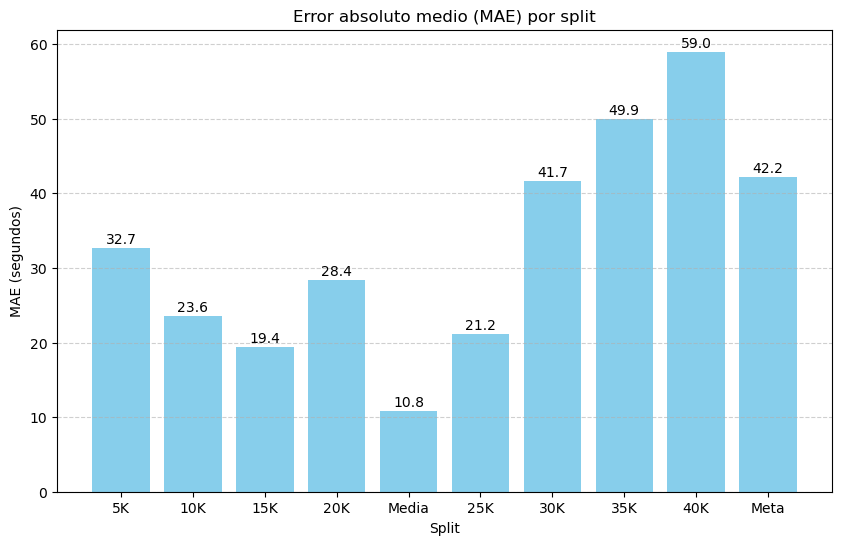

In [38]:
splits_ordered = [s for s in split_cols_maraton if s in mae_per_split_mar]
mae_values_ordered = [mae_per_split_mar[s] for s in splits_ordered]

plt.figure(figsize=(10,6))
plt.bar(splits_ordered, mae_values_ordered, color='skyblue')
plt.xlabel('Split')
plt.ylabel('MAE (segundos)')
plt.title('Error absoluto medio (MAE) por split')
plt.grid(axis='y', linestyle='--', alpha=0.6)

for i, v in enumerate(mae_values_ordered):
    plt.text(i, v + 0.2, f"{v:.1f}", ha='center', va='bottom')

plt.show()

In [39]:
def analisis_mal_imputado(df_wide, comparison):
    """
    Analiza splits imputados y genera:
    - df_mal: splits con error >10%
    - df_bien: splits imputados con error ≤10%
    - df_comparacion: información completa de splits, z-score, vecinos, edad/género
    """
    df = comparison.copy()
    
    umbrales = [0.1, 0.25, 0.5, 1.0] 
    for u in umbrales:
        col_name = f'error_mayor_{int(u*100)}%'
        df[col_name] = df['abs_error'] > (u * df['valor_real'])
    
    df_splits = df.pivot_table(index='athlete_id', columns='split', values='valor_real')
    
    atletas_info = df.groupby('athlete_id')[['age','gender']].first()
    df_features = pd.concat([df_splits, atletas_info], axis=1)
    
    df_comparacion = []
    for split in df_splits.columns:
        mean_split = df_splits[split].mean()
        std_split = df_splits[split].std()
        temp = pd.DataFrame({
            'athlete_id': df_splits.index,
            'split': split,
            'valor_real': df_splits[split],
            'mean_split_otros': mean_split,
            'std_split_otros': std_split,
        })
        df_comparacion.append(temp)
    
    df_comparacion = pd.concat(df_comparacion, ignore_index=True)
    
    dist_matrix = nan_euclidean_distances(df_features)
    dist_df = pd.DataFrame(dist_matrix, index=df_features.index, columns=df_features.index)
    threshold = 0.5
    vecinos_cercanos = (dist_df < threshold).sum(axis=1) - 1
    df_comparacion = df_comparacion.merge(vecinos_cercanos.rename('num_vecinos_cercanos'), on='athlete_id', how='left')
    
    df_comparacion = df_comparacion.merge(atletas_info, left_on='athlete_id', right_index=True, how='left')
    df_mal = df[df['error_mayor_10%']].copy()
    df_bien = df[(~df['error_mayor_10%']) & (df['abs_error'] > 0)].copy()
    
    return df_mal, df_bien, df_comparacion, df_splits, df_features

In [40]:
df_mal_mar, df_bien_mar, df_comparacion_mar, df_splits_mar, df_features_mar = analisis_mal_imputado(df_wide_mar, comparison_knn_mar)

C:\Users\mario\AppData\Local\Temp\ipykernel_10172\337520045.py:15: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_splits = df.pivot_table(index='athlete_id', columns='split', values='valor_real')


In [41]:
print(df_mal_mar.head(5))
print(df_bien_mar.head(5))
print(df_comparacion_mar.head(5))
print(df_splits_mar.head(5))
print(df_features_mar.head(5))

    athlete_id split  valor_real  valor_imputado   abs_error  gender  \
10    176246F3    5K    1709.962     1497.248735  212.713265     0.0   
54    3B1CA412    5K    1642.079     1884.153974  242.074974     1.0   
272   B3YADCBC    5K    1404.393     1549.045759  144.652759     0.0   
356   FB5543A6    5K    1420.000     1722.335004  302.335004     0.0   
484   36517DYF   10K    1952.365     1728.266350  224.098650     0.0   

           age age_group  error_mayor_10%  error_mayor_25%  error_mayor_50%  \
10   29.127995     20-29             True            False            False   
54   42.313484     40-49             True            False            False   
272  37.842574     30-39             True            False            False   
356  39.863107     30-39             True            False            False   
484  26.088980     20-29             True            False            False   

     error_mayor_100%  
10              False  
54              False  
272             Fals

In [42]:
df_imputados_mar = pd.concat([df_mal_mar, df_bien_mar], ignore_index=True)

In [43]:
df_imputados_mar['MAE_relativo'] = np.abs(df_imputados_mar['valor_real'] - df_imputados_mar['valor_imputado']) / df_imputados_mar['valor_real']

In [44]:
mae_por_split_mar = df_imputados_mar.groupby('split')['MAE_relativo'].mean().reset_index()

C:\Users\mario\AppData\Local\Temp\ipykernel_10172\3111457367.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mae_por_split_mar = df_imputados_mar.groupby('split')['MAE_relativo'].mean().reset_index()


In [45]:
def graficos_variabilidad_split(mae_por_split, df_wide, split_cols=['5K','10K','15K','20K','Meta']):
    """
    Genera gráficos por split: MAE relativo, desviación estándar y coeficiente de variación (CV).
    
    Parámetros:
    - mae_por_split: dataframe con columnas ['split', 'MAE_relativo']
    - df_wide: dataframe con tiempos absolutos por split
    - split_cols: lista con el orden de los splits
    """
    std_por_split = df_wide[split_cols].std().reset_index()
    std_por_split.columns = ['split', 'std_split']

    cv_por_split = (df_wide[split_cols].std() / df_wide[split_cols].mean()).reset_index()
    cv_por_split.columns = ['split', 'CV_split']

    fig, axes = plt.subplots(3, 1, figsize=(10, 15))

    axes[0].bar(mae_por_split['split'], mae_por_split['MAE_relativo'], color='skyblue')
    axes[0].set_ylabel('MAE relativo promedio')
    axes[0].set_title('MAE relativo por split')
    axes[0].grid(axis='y', linestyle='--', alpha=0.6)

    axes[1].bar(std_por_split['split'], std_por_split['std_split'], color='orange')
    axes[1].set_ylabel('Desviación estándar (segundos)')
    axes[1].set_title('Variabilidad de tiempo por split')
    axes[1].grid(axis='y', linestyle='--', alpha=0.6)

    axes[2].bar(cv_por_split['split'], cv_por_split['CV_split'], color='green')
    axes[2].set_ylabel('CV de tiempo por split')
    axes[2].set_xlabel('Split')
    axes[2].set_title('Variabilidad relativa (CV) por split')
    axes[2].grid(axis='y', linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()

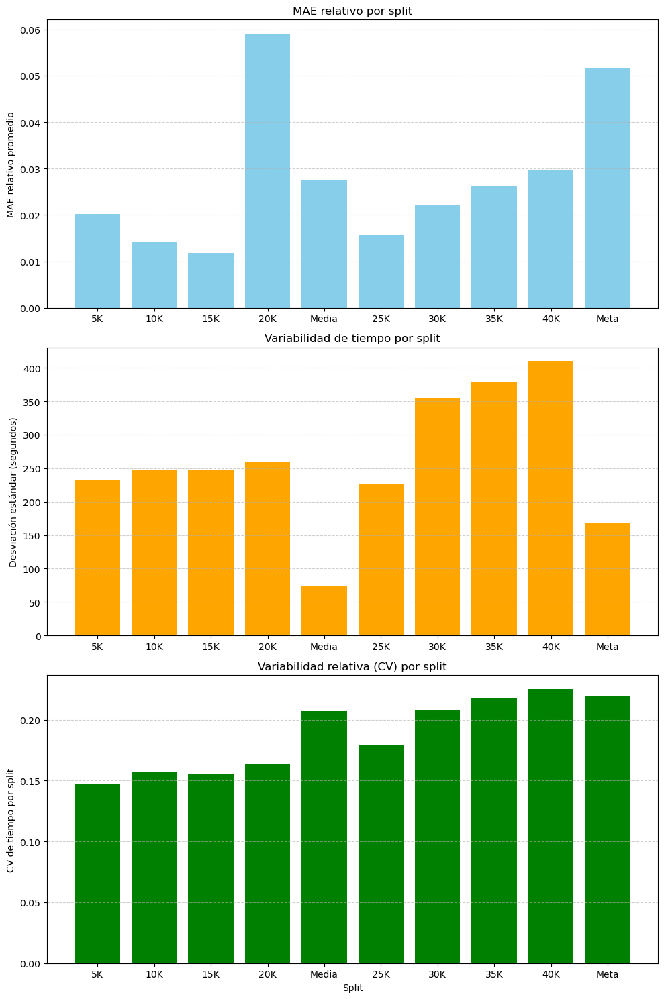

In [46]:
graficos_variabilidad_split(mae_por_split_mar, df_wide_mar, split_cols_maraton)

In [47]:
def plot_error_histograms_by_split(df, split_col='split', error_col='abs_error', bins=20, base_figsize=(6,4)):
    """
    Dibuja histogramas de los errores absolutos por cada split, ajustando automáticamente
    el tamaño de la figura para que los subplots no queden aplastados.

    Parámetros:
    - df: DataFrame con las columnas de split y error absoluto
    - split_col: nombre de la columna con los splits
    - error_col: nombre de la columna con los errores absolutos
    - bins: número de bins en los histogramas
    - base_figsize: tamaño base de cada subplot individual (ancho, alto)
    """
    splits = df[split_col].unique()
    n_splits = len(splits)
    
    n_cols = 2
    n_rows = math.ceil(n_splits / n_cols)
    
    figsize = (base_figsize[0]*n_cols, base_figsize[1]*n_rows)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()
    
    for i, split in enumerate(splits):
        data_split = df[df[split_col] == split][error_col]
        sns.histplot(data_split, bins=bins, kde=False, color='skyblue', ax=axes[i])
        axes[i].set_title(f'Split: {split}', fontsize=12)
        axes[i].set_xlabel('Error absoluto', fontsize=10)
        axes[i].set_ylabel('Frecuencia', fontsize=10)
        axes[i].grid(axis='y', linestyle='--', alpha=0.5)
    
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()

In [48]:
#plot_error_histograms_by_split(df_imputados_mar, split_col='split', error_col='abs_error', bins=25)

Contamos el número de atletas en cada grupo

In [49]:
def resumen_grupos_error(df_mal):
    """
    Calcula y muestra el número de atletas en diferentes grupos de error.
    
    Grupos considerados:
    - ≥10%
    - ≥25%
    - ≥50%
    - ≥100%
    
    Parámetros:
    - df_mal: dataframe que contiene las columnas:
        'error_mayor_10%', 'error_mayor_25%', 'error_mayor_50%', 'error_mayor_100%'
        y 'athlete_id'
    """
    grupos_mal = {
        '≥10%': df_mal[df_mal['error_mayor_10%']]['athlete_id'].unique(),
        '≥25%': df_mal[df_mal['error_mayor_25%']]['athlete_id'].unique(),
        '≥50%': df_mal[df_mal['error_mayor_50%']]['athlete_id'].unique(),
        '≥100%': df_mal[df_mal['error_mayor_100%']]['athlete_id'].unique()
    }

    for grupo, atletas in grupos_mal.items():
        n_atletas = len(atletas)
        print(f'Grupo {grupo}: {n_atletas} atletas')

In [50]:
resumen_grupos_error(df_mal_mar)

Grupo ≥10%: 134 atletas
Grupo ≥25%: 13 atletas
Grupo ≥50%: 1 atletas
Grupo ≥100%: 1 atletas


In [51]:
comparison_knn_mar['fue_imputado'] = comparison_knn_mar['abs_error'] > 0

atletas_bien_imputados_mar = comparison_knn_mar[(comparison_knn_mar['fue_imputado']) & 
                                    (comparison_knn_mar['abs_error'] <= 0.1 * comparison_knn_mar['valor_real'])]['athlete_id'].unique()

print("Número de atletas imputados con error ≤10%:", len(atletas_bien_imputados_mar))

Número de atletas imputados con error ≤10%: 3993


In [52]:
todos_atletas_mar = df_wide_mar['athlete_id'].unique()
atletas_imputados_mar = np.union1d(atletas_bien_imputados_mar, df_mal_mar['athlete_id'].unique())
atletas_no_imputados_mar = np.setdiff1d(todos_atletas_mar, atletas_imputados_mar)

print("Número de atletas no imputados:", len(atletas_no_imputados_mar))

Número de atletas no imputados: 16526


In [55]:
def graficar_curvas_error_imputacion(df_wide, df_mal, atletas_bien_imputados, atletas_no_imputados,
                                     figsize=(12,6), colores=None, random_state=42):
    """
    Grafica las curvas promedio de tiempos reales por grupo de error de imputación,
    incluyendo también una muestra de atletas no imputados.

    Parámetros:
    - df_wide: DataFrame con los tiempos reales por split (columnas de splits)
    - df_mal: DataFrame con los atletas mal imputados y sus errores
    - atletas_bien_imputados: lista o array con athlete_id de los bien imputados (<10%)
    - atletas_no_imputados: lista o array con athlete_id de atletas sin imputaciones
    - figsize: tupla con tamaño de la figura (default: (12,6))
    - colores: lista de colores para cada grupo (default: ['green','orange','red','purple','brown','blue'])
    - random_state: semilla para reproducibilidad
    """
    
    if colores is None:
        colores = ['green','orange','red','purple','brown','blue']
    
    splits_validos = ['5k', '10K', '15K', '20K', 'Media', '25K', '30K', '35K', '40K', 'Meta']
    splits_cols = [c for c in df_wide.columns if c in splits_validos]

    grupos = {
        '<10%': atletas_bien_imputados,
        '≥10%': df_mal[df_mal['error_mayor_10%']]['athlete_id'].unique(),
        '≥25%': df_mal[df_mal['error_mayor_25%']]['athlete_id'].unique(),
        '≥50%': df_mal[df_mal['error_mayor_50%']]['athlete_id'].unique(),
        '≥100%': df_mal[df_mal['error_mayor_100%']]['athlete_id'].unique(),
        'No imputados': atletas_no_imputados
    }

    print('\n📌 ATLETAS CON ≥50% DE ERROR DE IMPUTACIÓN')
    print(df_wide[df_wide['athlete_id'].isin(grupos['≥50%'])])

    print('\n🚨 ATLETAS CON ≥100% DE ERROR DE IMPUTACIÓN')
    print(df_wide[df_wide['athlete_id'].isin(grupos['≥100%'])])
    
    n_muestra_ref = len(grupos['≥10%'])
    
    plt.figure(figsize=figsize)
    
    for i, (grupo, atletas) in enumerate(grupos.items()):
        if len(atletas) == 0:
            continue
        
        if grupo in ['<10%', 'No imputados']:
            n_muestra = min(n_muestra_ref, len(atletas))
            np.random.seed(random_state)
            atletas = np.random.choice(atletas, size=n_muestra, replace=False)
        
        curvas = df_wide[df_wide['athlete_id'].isin(atletas)][splits_cols]
        
        if curvas.empty:
            continue
        
        curva_promedio = curvas.mean(axis=0)
        n_atletas = len(curvas)
        
        plt.plot(splits_cols, curva_promedio.values, color=colores[i], linewidth=2,
                 label=f'{grupo} (n={n_atletas})')
    
    plt.xlabel('Splits')
    plt.ylabel('Tiempo promedio (segundos)')
    plt.title('Curvas promedio de tiempos reales según error de imputación')
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.show()


📌 ATLETAS CON ≥50% DE ERROR DE IMPUTACIÓN
     athlete_id                               race_id event_id       5K  \
7109   6A981YDZ  49603c2f-1b2b-457f-b82e-fed8bded1d3d   Marato  1344.41   

           10K       15K    20K     Media      25K       30K      35K  \
7109  1384.208  1493.289  70.09  1604.543  1065.23  1465.406  1466.75   

           40K     Meta                    rawTime_5K  \
7109  1495.167  633.526 2025-03-16 07:54:54.273999872   

                       rawTime_10K                   rawTime_15K  \
7109 2025-03-16 08:17:58.481999872 2025-03-16 08:42:51.771000064   

                       rawTime_20K           rawTime_Media  \
7109 2025-03-16 08:44:01.860999936 2025-03-16 09:10:46.404   

                       rawTime_25K             rawTime_30K  \
7109 2025-03-16 09:28:31.633999872 2025-03-16 09:52:57.040   

                       rawTime_35K                   rawTime_40K  \
7109 2025-03-16 10:17:23.790000128 2025-03-16 10:42:18.956999936   

                    

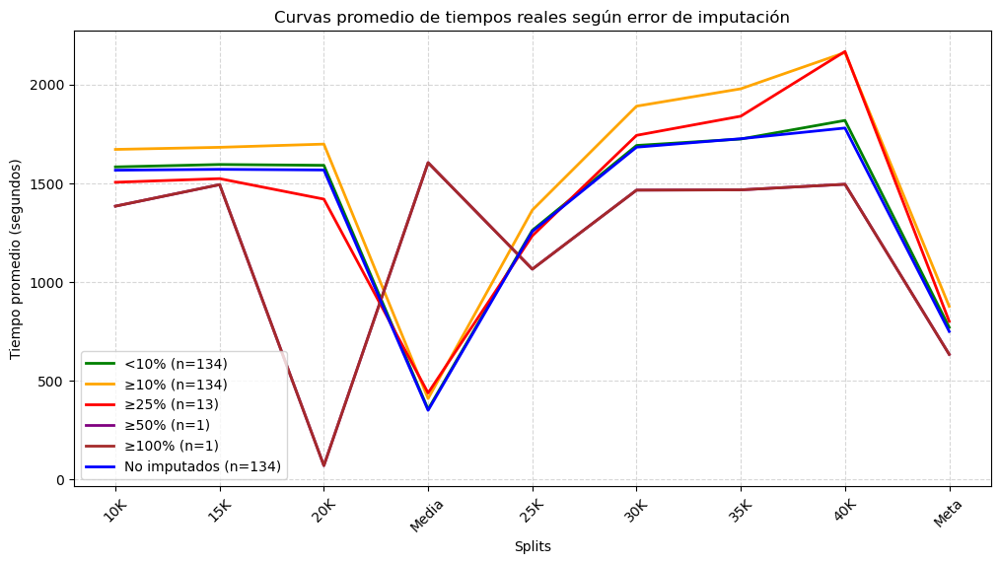

In [56]:
graficar_curvas_error_imputacion(df_wide_mar, df_mal_mar, atletas_bien_imputados_mar, atletas_no_imputados_mar)

In [57]:
df_wide_mar[df_wide_mar['athlete_id'] == '6A981YDZ']

,athlete_id,race_id,event_id,5K,10K,15K,20K,Media,25K,30K,35K,40K,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,age_group,club,total_time_sec
7109,6A981YDZ,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,1344.41,1384.208,1493.289,70.09,1604.543,1065.23,1465.406,1466.75,1495.167,633.526,2025-03-16 07:54:54.273999872,2025-03-16 08:17:58.481999872,2025-03-16 08:42:51.771000064,2025-03-16 08:44:01.860999936,2025-03-16 09:10:46.404,2025-03-16 09:28:31.633999872,2025-03-16 09:52:57.040,2025-03-16 10:17:23.790000128,2025-03-16 10:42:18.956999936,2025-03-16 10:52:52.483000064,0.0,35.383984,30-39,,0.0


In [33]:
def analizar_mejores_atletas(df_wide, df_mal, atletas_bien_imputados):
    """
    Analiza a los 10 mejores atletas imputados según tiempo total de splits y su relación con los errores de imputación.
    
    Args:
    - df_wide: DataFrame con tiempos de splits por atleta (cada split en columna)
    - df_mal: DataFrame con errores de imputación por split
    - atletas_bien_imputados: lista o array de IDs de atletas bien imputados
    
    Retorna:
    - conteo_mejores: diccionario con número de mejores atletas por grupo de error
    - top_10_ids: lista de IDs de los 10 atletas imputados más rápidos
    - top_10_tiempos: lista de tiempos totales de los 10 atletas
    - errores_top_10: DataFrame con errores de imputación de los 10 atletas
    """
    
    split_cols = [c for c in df_wide.columns 
                if c not in ['athlete_id','race_id','event_id','gender','age'] 
                and not c.startswith('raw')]    
    
    promedio_real = df_wide.set_index('athlete_id')[split_cols].mean(axis=1)
    mejores_200 = promedio_real.nsmallest(200)
    mejores_ids = mejores_200.index
    
    grupos_error = {
        '<10%': set(atletas_bien_imputados),
        '≥10%': set(df_mal[df_mal['error_mayor_10%']]['athlete_id'].unique()),
        '≥25%': set(df_mal[df_mal['error_mayor_25%']]['athlete_id'].unique()),
        '≥50%': set(df_mal[df_mal['error_mayor_50%']]['athlete_id'].unique()),
        '≥100%': set(df_mal[df_mal['error_mayor_100%']]['athlete_id'].unique())
    }
    
    conteo_mejores = {}
    for grupo, atletas in grupos_error.items():
        conteo_mejores[grupo] = len(atletas.intersection(mejores_ids))
    
    tiempo_total = df_wide.set_index('athlete_id')[split_cols].sum(axis=1)
    
    atletas_imputados = df_mal['athlete_id'].unique()
    tiempo_total_imputados = tiempo_total.loc[tiempo_total.index.isin(atletas_imputados)]
    
    top_10 = tiempo_total_imputados.nsmallest(10)
    top_10_ids = top_10.index.tolist()
    top_10_tiempos = top_10.values.tolist()
    
    errores_top_10 = df_mal[df_mal['athlete_id'].isin(top_10_ids)][
        ['athlete_id','split','valor_real','valor_imputado','abs_error']
    ].sort_values(['athlete_id','split'])
    
    print("Top 10 atletas imputados más rápidos:")
    for i, aid in enumerate(top_10_ids):
        print(f"{i+1}. Atleta ID: {aid}, Tiempo total: {top_10_tiempos[i]:.2f} segundos")
    
    return conteo_mejores, top_10_ids, top_10_tiempos, errores_top_10


In [34]:
conteo_mar, atleta_id_mar, tiempo_mar, errores_mar = analizar_mejores_atletas(df_wide_mar, df_mal_mar, atletas_bien_imputados_mar)

Top 10 atletas imputados más rápidos:
1. Atleta ID: 1A369F78, Tiempo total: 9982.88 segundos
2. Atleta ID: L1662668, Tiempo total: 10573.11 segundos
3. Atleta ID: B6CZY7CA, Tiempo total: 10926.97 segundos
4. Atleta ID: 3BFCDDBZ, Tiempo total: 11065.27 segundos
5. Atleta ID: 921C37C4, Tiempo total: 11540.31 segundos
6. Atleta ID: ACY78A14, Tiempo total: 11909.91 segundos
7. Atleta ID: 6A981YDZ, Tiempo total: 12022.62 segundos
8. Atleta ID: 3FD943F8, Tiempo total: 12108.12 segundos
9. Atleta ID: 142Y4ZCB, Tiempo total: 12200.30 segundos
10. Atleta ID: 6AA7Z54B, Tiempo total: 12348.11 segundos


In [35]:
print(conteo_mar)
print(errores_mar)

{'<10%': 48, '≥10%': 0, '≥25%': 0, '≥50%': 0, '≥100%': 0}
     athlete_id  split  valor_real  valor_imputado    abs_error
1680   142Y4ZCB  Media     382.054      308.655851    73.398149
1687   1A369F78  Media     194.525      254.956772    60.431772
3774   3BFCDDBZ   Meta     577.122      635.504314    58.382314
3355   3FD943F8    40K    2080.225     1768.945385   311.279615
1403   6A981YDZ    20K      70.090     1402.172225  1332.082225
3844   6AA7Z54B   Meta     530.001      626.537349    96.536349
3097   921C37C4    35K    1597.370     1403.983463   193.386537
3965   ACY78A14   Meta     606.580      672.302930    65.722930
3154   B6CZY7CA    35K    1241.700     1399.897224   158.197224
4067   L1662668   Meta     484.441      536.953352    52.512352


Vemos que el atleta más rápido de la carrera ha tenido un error de imputación en media de unos 60 segundos, cuyo valor medio visto antes es de unos 10 segundos (6 veces mayor) por lo que podríamos tener errores de imputación altos en atletas con un tiempo sublime únicamente poir este mismo hecho. 

### Regresion

In [188]:
df_wide_mar_regr = preparar_datos(athletes_events_df, athletes_time_df, athletes_df,
                                                             race_id_filter='49603c2f-1b2b-457f-b82e-fed8bded1d3d',
                                                             event_std_filter='maraton', split_cols=split_cols_maraton)

Pivot terminado. Columnas: ['10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta']
Columnas df_wide antes del merge: ['athlete_id', 'race_id', 'event_id', '10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta']
Merge completado. Columnas df_wide ahora: ['athlete_id', 'race_id', 'event_id', '10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta', 'rawTime_5K', 'rawTime_10K', 'rawTime_15K', 'rawTime_20K', 'rawTime_Media', 'rawTime_25K', 'rawTime_30K', 'rawTime_35K', 'rawTime_40K', 'rawTime_Meta']


In [189]:
df_wide_mar_regr.dropna(inplace=True)

In [ ]:
def crear_features_carrera(df, split_cols, pace_cols, debug=False):
    """
    Crea variables derivadas para predicción de splits en maratón:
        - Incrementos entre splits (Δ tiempos y Δ paces)
        - Distancia y tiempo acumulados
        - Ritmos agregados (medio, std, cv)
        - Fatiga / decaimiento
        - Proporción del tiempo total

    Args:
        df: pd.DataFrame con los splits y paces
        split_cols: lista de columnas de splits ['5K','10K',...,'Meta']
        pace_cols: lista de columnas de paces ['pace_5K', ... 'pace_Meta']
        debug: bool, si True imprime logs de depuración

    Returns:
        df_feat: pd.DataFrame con nuevas variables añadidas
    """
    df_feat = df.copy()

    for a, b in zip(split_cols[:-1], split_cols[1:]):
        df_feat[f'inc_{a}_{b}'] = df_feat[b] - df_feat[a]
        
    for a, b in zip(pace_cols[:-1], pace_cols[1:]):
        df_feat[f'delta_{a}_{b}'] = df_feat[b] - df_feat[a]

    dist_split = df_feat[split_cols].values * df_feat[pace_cols].values

    dist_acum = np.cumsum(dist_split, axis=1)
    for i, split in enumerate(split_cols):
        df_feat[f'dist_acum_{split}'] = dist_acum[:, i]

    time_acum = np.cumsum(df_feat[split_cols].values, axis=1)
    for i, split in enumerate(split_cols):
        df_feat[f'time_acum_{split}'] = time_acum[:, i]

    for i, split in enumerate(split_cols):
        pace_so_far = df_feat[pace_cols[:i+1]].values
        df_feat[f'pace_mean_{split}'] = np.mean(pace_so_far, axis=1)
        df_feat[f'pace_std_{split}'] = np.std(pace_so_far, axis=1)
        df_feat[f'pace_cv_{split}'] = df_feat[f'pace_std_{split}'] / df_feat[f'pace_mean_{split}']

    for i, split in enumerate(split_cols):
        df_feat[f'fatigue_{split}'] = df_feat[pace_cols[i]] / df_feat[f'pace_mean_{split}']

    for i, split in enumerate(split_cols):
        df_feat[f'ratio_time_total_{split}'] = df_feat[split] / df_feat['total_time_sec']

    if debug:
        print("Distancia por split (primeras filas):\n", dist_split[:5])
        print("Distancia acumulada (primeras filas):\n", dist_acum[:5])
        print("Tiempo acumulado (primeras filas):\n", time_acum[:5])
        print("Pace medio (primeras filas):\n", df_feat[[f'pace_mean_{s}' for s in split_cols]].head())

    return df_feat


pace_cols = ['pace_5K','pace_10K','pace_15K','pace_20K','pace_Media',
             'pace_25K','pace_30K','pace_35K','pace_40K','pace_Meta']

In [191]:
split_dist_maraton = [5000, 5000, 5000, 5000, 1000, 4000, 5000, 5000, 5000, 2195]

for col, dist in zip(split_cols_maraton, split_dist_maraton):
    df_wide_mar_regr[f'pace_{col}'] = 1 / (df_wide_mar_regr[col] / dist)

pace_cols_maraton = [f'pace_{col}' for col in split_cols_maraton]

df_feat_mar_regr = crear_features_carrera(df_wide_mar_regr, split_cols_maraton, pace_cols_maraton)

In [192]:
df_feat_mar_regr.head(5)

,athlete_id,race_id,event_id,10K,15K,20K,25K,30K,35K,40K,5K,Media,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,total_time_sec,pace_5K,pace_10K,pace_15K,pace_20K,pace_Media,pace_25K,pace_30K,pace_35K,pace_40K,pace_Meta,inc_5K_10K,inc_10K_15K,inc_15K_20K,inc_20K_Media,inc_Media_25K,inc_25K_30K,inc_30K_35K,inc_35K_40K,inc_40K_Meta,delta_pace_5K_pace_10K,delta_pace_10K_pace_15K,delta_pace_15K_pace_20K,delta_pace_20K_pace_Media,delta_pace_Media_pace_25K,delta_pace_25K_pace_30K,delta_pace_30K_pace_35K,delta_pace_35K_pace_40K,delta_pace_40K_pace_Meta,dist_acum_5K,dist_acum_10K,dist_acum_15K,dist_acum_20K,dist_acum_Media,dist_acum_25K,dist_acum_30K,dist_acum_35K,dist_acum_40K,dist_acum_Meta,time_acum_5K,time_acum_10K,time_acum_15K,time_acum_20K,time_acum_Media,time_acum_25K,time_acum_30K,time_acum_35K,time_acum_40K,time_acum_Meta,pace_mean_5K,pace_std_5K,pace_cv_5K,pace_mean_10K,pace_std_10K,pace_cv_10K,pace_mean_15K,pace_std_15K,pace_cv_15K,pace_mean_20K,pace_std_20K,pace_cv_20K,pace_mean_Media,pace_std_Media,pace_cv_Media,pace_mean_25K,pace_std_25K,pace_cv_25K,pace_mean_30K,pace_std_30K,pace_cv_30K,pace_mean_35K,pace_std_35K,pace_cv_35K,pace_mean_40K,pace_std_40K,pace_cv_40K,pace_mean_Meta,pace_std_Meta,pace_cv_Meta,fatigue_5K,fatigue_10K,fatigue_15K,fatigue_20K,fatigue_Media,fatigue_25K,fatigue_30K,fatigue_35K,fatigue_40K,fatigue_Meta,ratio_time_total_5K,ratio_time_total_10K,ratio_time_total_15K,ratio_time_total_20K,ratio_time_total_Media,ratio_time_total_25K,ratio_time_total_30K,ratio_time_total_35K,ratio_time_total_40K,ratio_time_total_Meta
0,01eca658-9206-509d-b977-10aa8c33dcb9,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,2157.272,2184.206,2001.858,1798.400,2398.527,3347.550,3573.921,1946.076,594.604,960.082,2025-03-16 09:00:52.812999936,2025-03-16 09:36:50.084999936,2025-03-16 10:13:14.291000064,2025-03-16 10:46:36.148999936,2025-03-16 10:56:30.752999936,2025-03-16 11:26:29.152999936,2025-03-16 12:06:27.680000000,2025-03-16 13:02:15.230000128,2025-03-16 14:01:49.151000064,2025-03-16 14:17:49.232999936,1.0,32.917180,0.0,2.569273,2.317742,2.289161,2.497680,1.681792,2.224199,2.084613,1.493630,1.399024,2.286263,211.196,26.934,-182.348,-1407.254,1203.796,600.127,949.023,226.371,-2613.839,-0.251531,-0.028581,0.208518,-0.815888,0.542408,-0.139587,-0.590983,-0.094606,0.887239,5000.0,10000.0,15000.0,20000.0,21000.0,25000.0,30000.0,35000.0,40000.0,42195.0,1946.076,4103.348,6287.554,8289.412,8884.016,10682.416,13080.943,16428.493,20002.414,20962.496,2.569273,0.0,0.0,2.443507,0.125765,0.051469,2.392059,0.125851,0.052612,2.418464,0.118197,0.048873,2.271129,0.313060,0.137843,2.263308,0.286318,0.126504,2.237780,0.272354,0.121707,2.144761,0.354220,0.165156,2.061901,0.407991,0.197871,2.084338,0.392863,0.188483,1.0,0.948531,0.956984,1.032755,0.740509,0.982721,0.931554,0.696408,0.678511,1.096878,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf
1,042a4b4e-6e1c-5896-9173-b0fc7963d82c,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,1580.306,1565.930,1555.900,1241.632,1636.204,1653.280,1749.712,1552.853,349.867,796.298,2025-03-16 08:11:53.760999936,2025-03-16 08:38:14.067000064,2025-03-16 09:04:19.996999936,2025-03-16 09:30:15.896999936,2025-03-16 09:36:05.764000000,2025-03-16 09:56:47.396000000,2025-03-16 10:24:03.600000000,2025-03-16 10:51:36.880000000,2025-03-16 11:20:46.592000000,2025-03-16 11:34:02.889999872,0.0,26.913073,0.0,3.219880,3.163944,3.192991,3.213574,2.858229,3.221566,3.055854,3.024291,2.857613,2.756506,27.453,-14.376,-10.030,-1206.033,891.765,394.572,17.076,96.432,-953.414,-0.055936,0.029047,0.020583,-0.355345,0.363337,-0.165713,-0.031563,-0.166678,-0.101107,5000.0,10000.0,15000.0,20000.0,21000.0,25000.0,30000.0,35000.0,40000.0,42195.0,1552.853,3133.159,4699.089,6254.989,6604.856,7846.488,9482.692,11135.972,12885.684,13681.982,3.219880,0.0,0.0,3.191912,0.027968,0.008762,3.192272,0.022841,0.007155,3.197597,0.021826,0.006826,3.129724,0.137144,0.043820,3.1450

In [ ]:
def eda_marathon(df, splits=['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']):
    """
    Realiza un EDA básico para un dataset de maratón.
    
    Parámetros:
    df : pd.DataFrame
        DataFrame con los datos de maratón.
    splits : list
        Lista de columnas de splits a analizar.
    """
    
    print("=== INFORMACIÓN GENERAL ===")
    print(df.info(), "\n")
    print("=== ESTADÍSTICAS DESCRIPTIVAS ===")
    print(df.describe(), "\n")
    
    if 'gender' in df.columns:
        print("=== GÉNERO ===")
        print(df['gender'].value_counts())
        print(df['gender'].value_counts(normalize=True), "\n")
    
    print("=== NÚMERO DE ATLETAS Y EVENTOS ===")
    print(f"Atletas únicos: {df['athlete_id'].nunique()}")
    print(f"Carreras únicas: {df['race_id'].nunique()}")
    print(f"Eventos únicos: {df['event_id'].nunique()}\n")
    
    plt.figure(figsize=(15,5))
    for i, col in enumerate(splits):
        plt.subplot(2,5,i+1)
        sns.histplot(df[col], bins=20, kde=True)
        plt.title(col)
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(15,5))
    sns.boxplot(data=df[splits])
    plt.title("Boxplot de tiempos por splits")
    plt.show()
    
    pace_cols = [c for c in df.columns if 'pace_' in c]
    if pace_cols:
        plt.figure(figsize=(15,5))
        sns.boxplot(data=df[pace_cols])
        plt.title("Boxplot de pace por split")
        plt.show()
    
    plt.figure(figsize=(10,8))
    corr = df[splits].corr()
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
    plt.title("Correlación entre tiempos de splits")
    plt.show()
    
    print("=== EDA COMPLETO FINALIZADO ===")

=== INFORMACIÓN GENERAL ===
<class 'pandas.core.frame.DataFrame'>
Index: 20613 entries, 0 to 20652
Columns: 124 entries, athlete_id to ratio_time_total_Meta
dtypes: datetime64[ns](10), float64(111), object(3)
memory usage: 19.7+ MB
None 

=== ESTADÍSTICAS DESCRIPTIVAS ===


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib

               10K           15K           20K           25K           30K  \
count  20613.00000  20613.000000  20613.000000  20613.000000  20613.000000   
mean    1579.86842   1590.118687   1589.381410   1263.662003   1704.411908   
min      176.97900    890.850000     70.090000    610.149000    882.872000   
25%     1412.65600   1423.143000   1412.392000   1111.846000   1464.102000   
50%     1574.65900   1587.617000   1580.131000   1244.683000   1655.880000   
75%     1726.15700   1734.956000   1735.763000   1382.788000   1888.360000   
max     3522.35000   4695.583000   3009.039000   2545.028000   6497.670000   
std      247.72739    246.405907    259.611576    226.074893    355.097103   

                35K           40K            5K         Media          Meta  \
count  20613.000000  20613.000000  20613.000000  20613.000000  20613.000000   
mean    1739.496294   1819.797155   1580.352578    359.894106    766.989542   
min      477.780000     58.041000    710.970000     73.15900

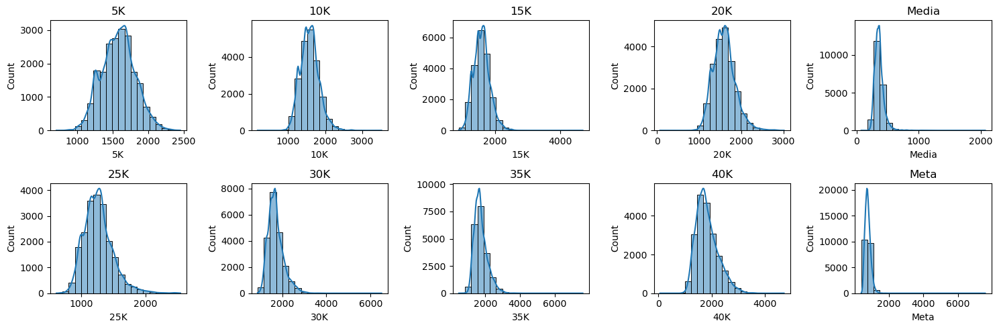

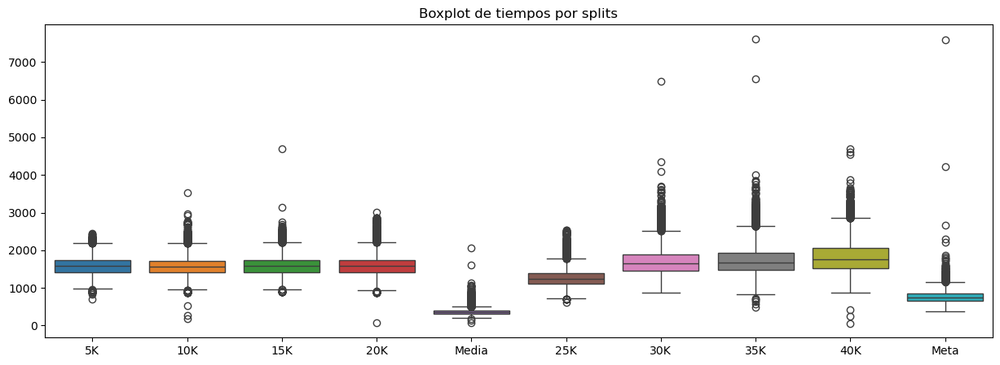

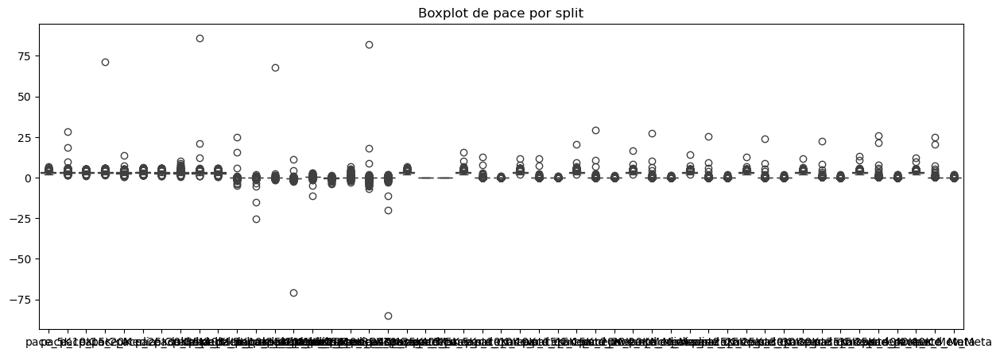

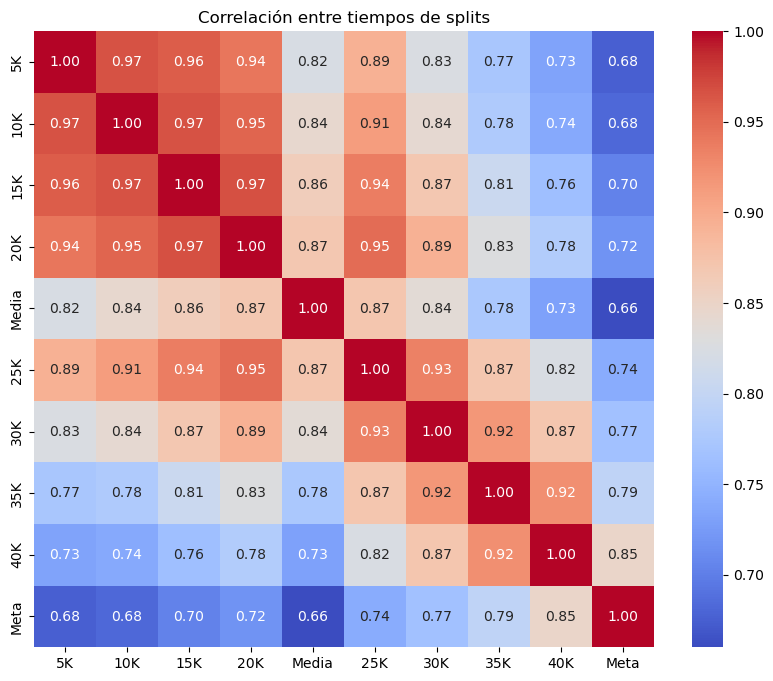

=== EDA COMPLETO FINALIZADO ===


In [194]:
eda_marathon(df_feat_mar_regr, split_cols_maraton)

In [ ]:
#### (FUNCION ANTIGUA)
### COMPROBAR SI EN REGRESION LOS ATLETAS CON MAS TIEMPO TAMBIEN SE IMPUTAN PEOR 

def imputar_split(df, split_a_imputar, split_cols, modelo, test_size=0.2, random_state=42,
                  param_grid=None, search_type='grid', cv=5, scoring='neg_mean_absolute_error', **model_params):
    
    np.random.seed(random_state)
    df = df.copy()
    
    X = df[split_cols].drop(columns=[split_a_imputar]).copy()
    X[['age','gender']] = df[['age','gender']]
    y = df[split_a_imputar].copy()
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    
    n_iter_search = model_params.pop('n_iter', 10)
    base_model = modelo(**model_params)
    
    if param_grid is not None:
        if search_type == 'grid':
            search = GridSearchCV(base_model, param_grid, scoring=scoring, cv=cv, n_jobs=-1)
        elif search_type == 'random':
            search = RandomizedSearchCV(base_model, param_grid, n_iter=n_iter_search, scoring=scoring, cv=cv, n_jobs=-1)
        else:
            raise ValueError("search_type debe ser 'grid' o 'random'")
        search.fit(X_train, y_train)
        model = search.best_estimator_

        resultados_iteraciones = pd.DataFrame(search.cv_results_)
        if scoring.startswith('neg_'):  
            metric_name = scoring.replace('neg_', '').upper()
            resultados_iteraciones[metric_name] = -resultados_iteraciones['mean_test_score']
        else:
            metric_name = scoring.upper()
            resultados_iteraciones[metric_name] = resultados_iteraciones['mean_test_score']

    else:
        model = base_model
        model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    metrics = {
        'MAE': mean_absolute_error(y_test, y_pred),
        'MSE': mean_squared_error(y_test, y_pred),
        'R2': r2_score(y_test, y_pred)
    }

    if param_grid is not None:
        return metrics, resultados_iteraciones, y_test, y_pred
    else:
        return metrics, y_test, y_pred

In [ ]:
def imputar_todos_splits(df_wide, split_cols, modelo, param_grid=None, search_type='random', n_iter=20, cv=3,
                          scoring='neg_mean_absolute_error', **model_params):
    """
    Ejecuta imputación para todos los splits, con fine-tuning si se proporciona param_grid,
    y devuelve DataFrames con métricas y predicciones.
    
    Retorna:
    - df_metrics_xgb: métricas MAE, MSE, R2 por split
    - df_todos_splits: predicciones, valores reales, error absoluto, edad y género
    """
    df_metrics_xgb = []
    df_todos_splits = []

    df_info = df_wide[['athlete_id','gender','age']].copy()
    df_info['athlete_id'] = df_info['athlete_id'].astype(str)  

    for split in split_cols:
        print(f"Fine-tuning e imputando split: {split}")

        if param_grid is not None:
            metrics, cv_results, y_test, y_pred = imputar_split(
                df_wide,
                split_a_imputar=split,
                split_cols=split_cols,
                modelo=modelo,
                param_grid=param_grid,
                search_type=search_type,
                n_iter=n_iter,
                cv=cv,
                random_state=42,
                scoring=scoring,
                **model_params
            )
        else:
            metrics, y_test, y_pred = imputar_split(
                df_wide,
                split_a_imputar=split,
                split_cols=split_cols,
                modelo=modelo,
                random_state=42,
                **model_params
            )

        df_metrics = pd.DataFrame([metrics])
        df_metrics['Split'] = split
        df_metrics_xgb.append(df_metrics)

        athlete_ids = df_wide.loc[y_test.index, 'athlete_id'].astype(str).values

        df_split = pd.DataFrame({
            'athlete_id': athlete_ids,
            'split': split,
            'valor_real': y_test.values,
            'valor_imputado': y_pred
        })
        df_split['abs_error'] = (df_split['valor_real'] - df_split['valor_imputado']).abs()

        df_split = df_split.merge(df_info, on='athlete_id', how='left')

        df_todos_splits.append(df_split)

    df_metrics_xgb = pd.concat(df_metrics_xgb, ignore_index=True)
    df_todos_splits = pd.concat(df_todos_splits, ignore_index=True)

    return df_metrics_xgb, df_todos_splits

In [ ]:
def graficar_imputacion(df_todos_splits):
    """
    Genera automáticamente gráficos de imputación:
    - Boxplot por género
    - Boxplot por grupo de edad
    - Boxplot por split
    - Scatter plot: valor real vs imputado (color por split, ejes limitados a 5000)
    """
    plt.figure(figsize=(8,6))
    sns.boxplot(x='gender', y='abs_error', data=df_todos_splits, palette='pastel')
    plt.title('Distribución del error absoluto por género')
    plt.xlabel('Género')
    plt.ylabel('Error absoluto (segundos)')
    plt.show()
    
    labels = ['<20','20-29','30-39','40-49','50+']
    bins = [0,20,30,40,50,100]
    df_todos_splits['edad_grupo'] = pd.cut(df_todos_splits['age'], bins=bins, labels=labels)
    
    plt.figure(figsize=(10,6))
    sns.boxplot(x='edad_grupo', y='abs_error', data=df_todos_splits, palette='pastel')
    plt.title('Distribución del error absoluto por grupo de edad')
    plt.xlabel('Grupo de edad')
    plt.ylabel('Error absoluto (segundos)')
    plt.show()
    
    plt.figure(figsize=(12,6))
    sns.boxplot(x='split', y='abs_error', data=df_todos_splits, palette='pastel')
    plt.title('Distribución del error absoluto por split')
    plt.xlabel('Split')
    plt.ylabel('Error absoluto (segundos)')
    plt.xticks(rotation=45)
    plt.show()
    
    plt.figure(figsize=(8,8))
    sns.scatterplot(x='valor_real', y='valor_imputado', hue='split', data=df_todos_splits, alpha=0.7)
    
    plt.title('Valor real vs valor imputado por split')
    plt.xlabel('Valor real (segundos)')
    plt.ylabel('Valor imputado (segundos)')
    plt.legend(title='Split', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

Fine-tuning e imputando split: 5K
Fine-tuning e imputando split: 10K
Fine-tuning e imputando split: 15K
Fine-tuning e imputando split: 20K
Fine-tuning e imputando split: Media
Fine-tuning e imputando split: 25K
Fine-tuning e imputando split: 30K
Fine-tuning e imputando split: 35K
Fine-tuning e imputando split: 40K
Fine-tuning e imputando split: Meta


INFO: Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2273876244.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='gender', y='abs_error', data=df_todos_splits, palette='pastel')
INFO: Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


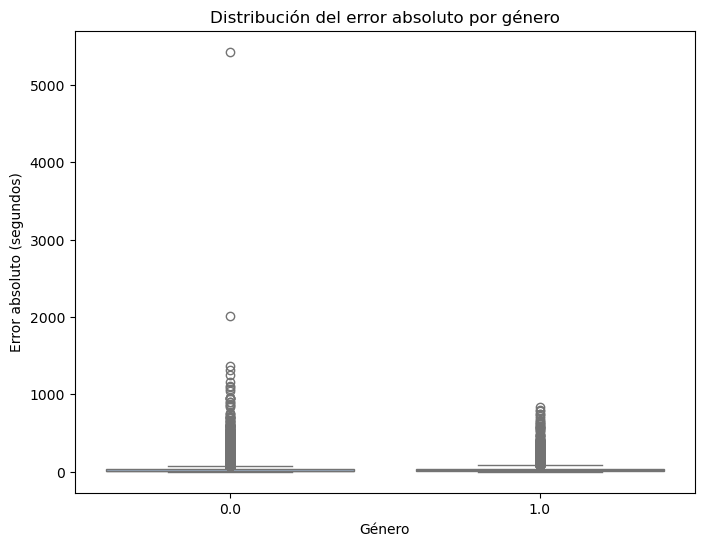

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2273876244.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='edad_grupo', y='abs_error', data=df_todos_splits, palette='pastel')


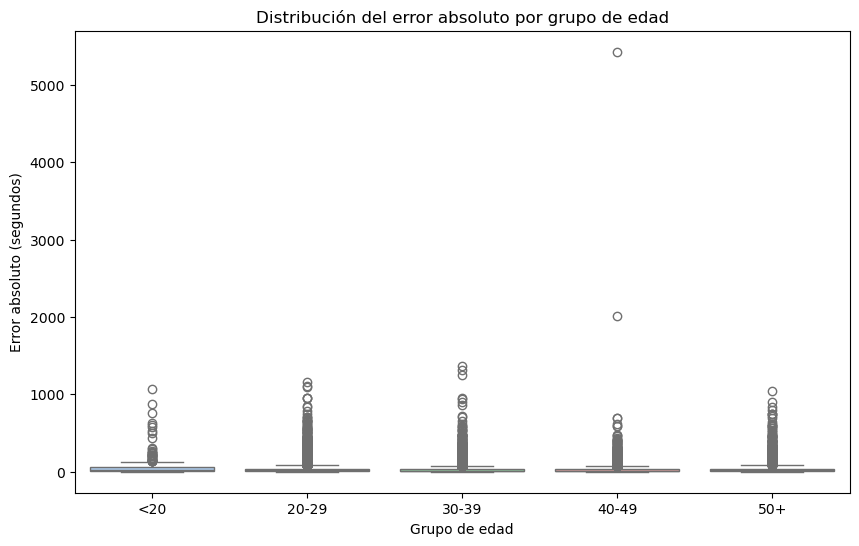

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2273876244.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='split', y='abs_error', data=df_todos_splits, palette='pastel')


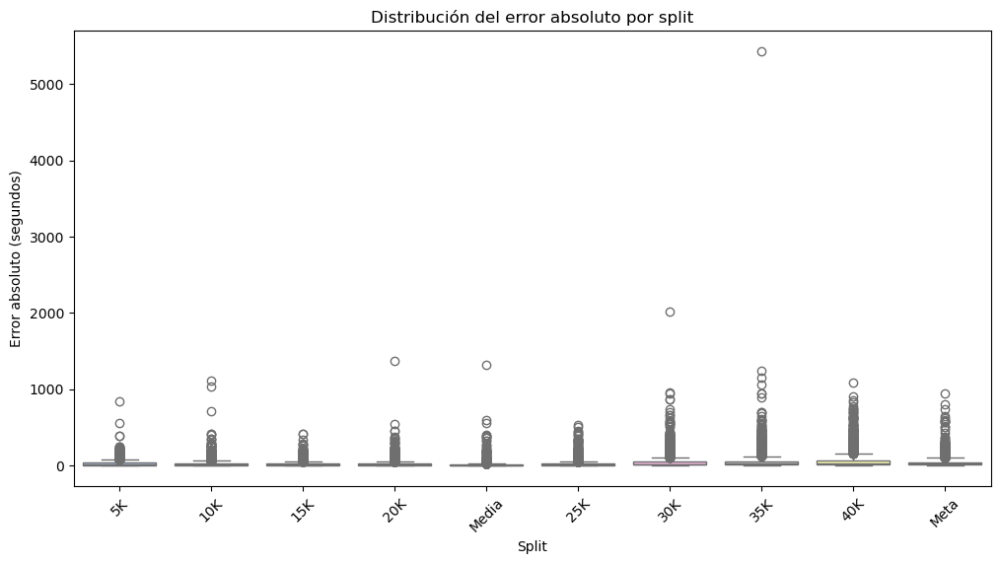

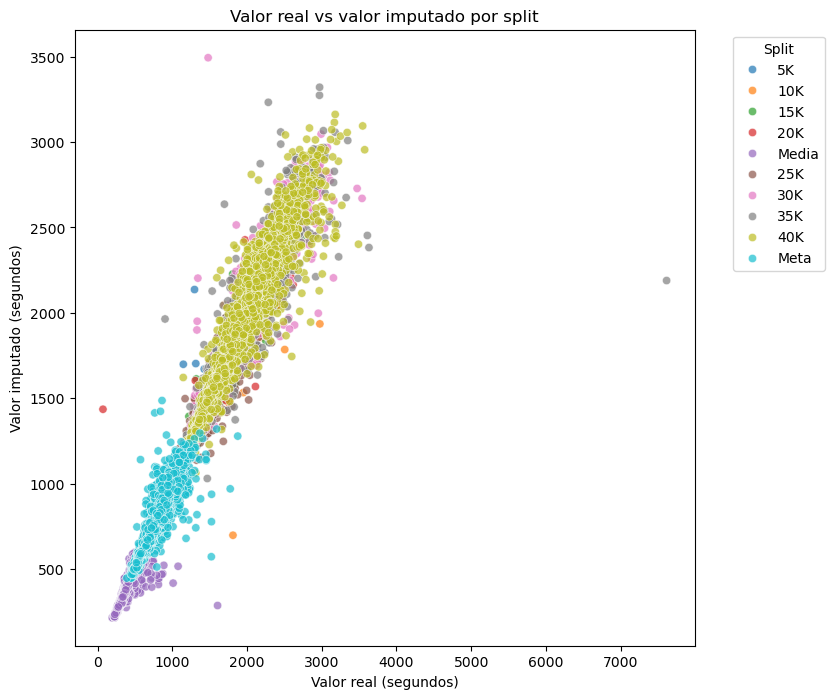

In [197]:
from xgboost import XGBRegressor

param_grid_xgb = {
    'n_estimators': [100, 200, 300],       # Número de árboles
    'max_depth': [3, 4, 5],                # Profundidad máxima de cada árbol
    'learning_rate': [0.05, 0.1],          # Tasa de aprendizaje
    'subsample': [0.8, 1.0],               # Porcentaje de datos usados por árbol
    'colsample_bytree': [0.8, 1.0],        # Porcentaje de features por árbol
    'gamma': [0, 0.1]                      # Reducción mínima de pérdida para dividir
}

df_metrics_xgb_mar, comparison_regr_mar = imputar_todos_splits(df_feat_mar_regr, split_cols_maraton, XGBRegressor, param_grid=param_grid_xgb)
graficar_imputacion(comparison_regr_mar)

In [198]:
df_mal_mar_regr, df_bien_mar_regr, df_comparacion_mar_regr, df_splits_mar_regr, df_features_mar_regr = analisis_mal_imputado(df_feat_mar_regr, comparison_regr_mar)

In [199]:
df_imputados_mar_regr = pd.concat([df_mal_mar_regr, df_bien_mar_regr], ignore_index=True)
df_imputados_mar_regr['MAE_relativo'] = np.abs(df_imputados_mar_regr['valor_real'] - df_imputados_mar_regr['valor_imputado']) / df_imputados_mar_regr['valor_real']
mae_por_split_mar_regr = df_imputados_mar_regr.groupby('split')['MAE_relativo'].mean().reset_index()

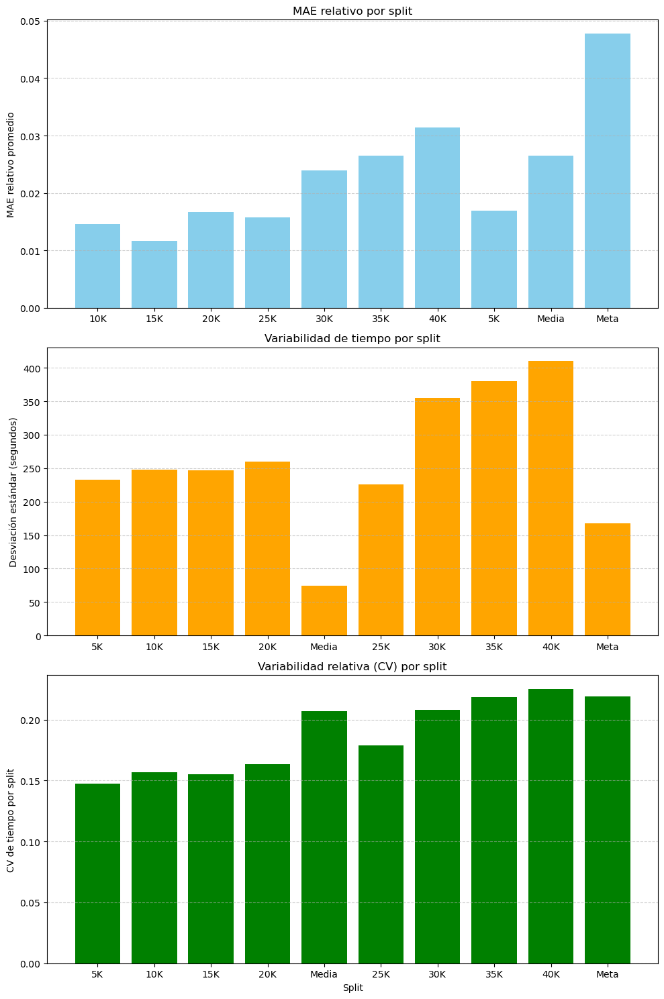

In [200]:
graficos_variabilidad_split(mae_por_split_mar_regr, df_feat_mar_regr, split_cols_maraton)

In [201]:
resumen_grupos_error(df_mal_mar_regr)

Grupo ≥10%: 826 atletas
Grupo ≥25%: 109 atletas
Grupo ≥50%: 15 atletas
Grupo ≥100%: 3 atletas


In [202]:
comparison_regr_mar.head(5)

,athlete_id,split,valor_real,valor_imputado,abs_error,gender,age,edad_grupo
0,89C9B6AF,5K,1191.965,1178.849731,13.115269,0.0,33.010267,30-39
1,84485F52,5K,1482.528,1460.748657,21.779343,0.0,41.245722,40-49
2,5YAZ1445,5K,1638.074,1656.073486,17.999486,1.0,56.317591,50+
3,B24C1135,5K,1208.287,1195.427124,12.859876,0.0,32.566735,30-39
4,Y13BBDZB,5K,1560.190,1581.118164,20.928164,1.0,22.031485,20-29


In [203]:
comparison_regr_mar['fue_imputado'] = comparison_regr_mar['abs_error'] > 0

atletas_bien_imputados_mar_regr = comparison_regr_mar[(comparison_regr_mar['fue_imputado']) & 
                                    (comparison_regr_mar['abs_error'] <= 0.1 * comparison_regr_mar['valor_real'])]['athlete_id'].unique()

print("Número de atletas imputados con error ≤10%:", len(atletas_bien_imputados_mar_regr))

Número de atletas imputados con error ≤10%: 4123


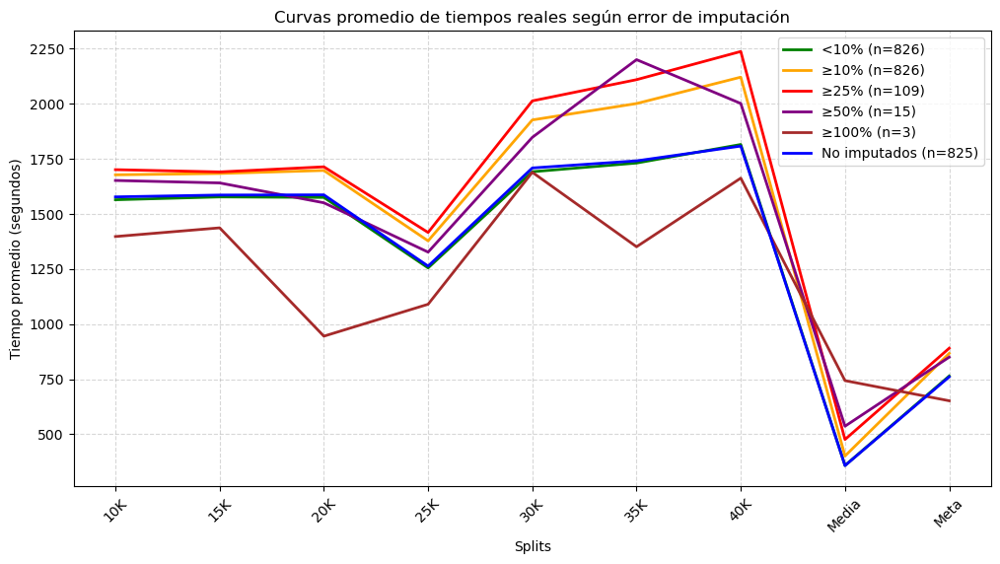

In [204]:
graficar_curvas_error_imputacion(df_feat_mar_regr, df_mal_mar_regr, atletas_bien_imputados_mar_regr, atletas_no_imputados_mar)

In [205]:
conteo_mar_regr, atleta_id_mar_regr, tiempo_mar_regr, errores_mar_regr = analizar_mejores_atletas(df_feat_mar_regr, df_mal_mar_regr, atletas_bien_imputados_mar_regr)

print(conteo_mar_regr)
print(errores_mar_regr)

Top 10 atletas imputados más rápidos:
1. Atleta ID: 01eca658-9206-509d-b977-10aa8c33dcb9, Tiempo total: inf segundos
2. Atleta ID: 11A41D26, Tiempo total: inf segundos
3. Atleta ID: 11B3A733, Tiempo total: inf segundos
4. Atleta ID: 129FAF13, Tiempo total: inf segundos
5. Atleta ID: 13F92F3Y, Tiempo total: inf segundos
6. Atleta ID: 14975D5C, Tiempo total: inf segundos
7. Atleta ID: 14B15Z64, Tiempo total: inf segundos
8. Atleta ID: 14BD8223, Tiempo total: inf segundos
9. Atleta ID: 15713ZF4, Tiempo total: inf segundos
10. Atleta ID: 15C295Y3, Tiempo total: inf segundos
{'<10%': 35, '≥10%': 4, '≥25%': 1, '≥50%': 0, '≥100%': 0}
                                 athlete_id  split  valor_real  \
28835  01eca658-9206-509d-b977-10aa8c33dcb9    30K    2398.527   
32958  01eca658-9206-509d-b977-10aa8c33dcb9    35K    3347.550   
37081  01eca658-9206-509d-b977-10aa8c33dcb9    40K    3573.921   
41204  01eca658-9206-509d-b977-10aa8c33dcb9   Meta     960.082   
32146                              

In [206]:
def plot_metric_bars(values, splits, metric_name):
    """
    Dibuja un gráfico de barras para una métrica dada por split.

    Parámetros:
        values: lista de valores de la métrica (ej. MAE)
        splits: lista de nombres de los splits (ej. '5K', '10K', etc.)
        metric_name: nombre de la métrica (ej. 'MAE', 'MSE', 'R2')
    """
    df = pd.DataFrame({metric_name: values, 'Split': splits})
    
    plt.figure(figsize=(12,6))
    sns.barplot(x='Split', y=metric_name, data=df, palette='viridis')
    
    plt.title(f'{metric_name} por Split')
    plt.xlabel('Split')
    plt.ylabel(metric_name)
    
    for i, v in enumerate(values):
        plt.text(i, v + 0.5, f"{v:.2f}", ha='center', va='bottom')
    
    plt.show()

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\3410432367.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Split', y=metric_name, data=df, palette='viridis')


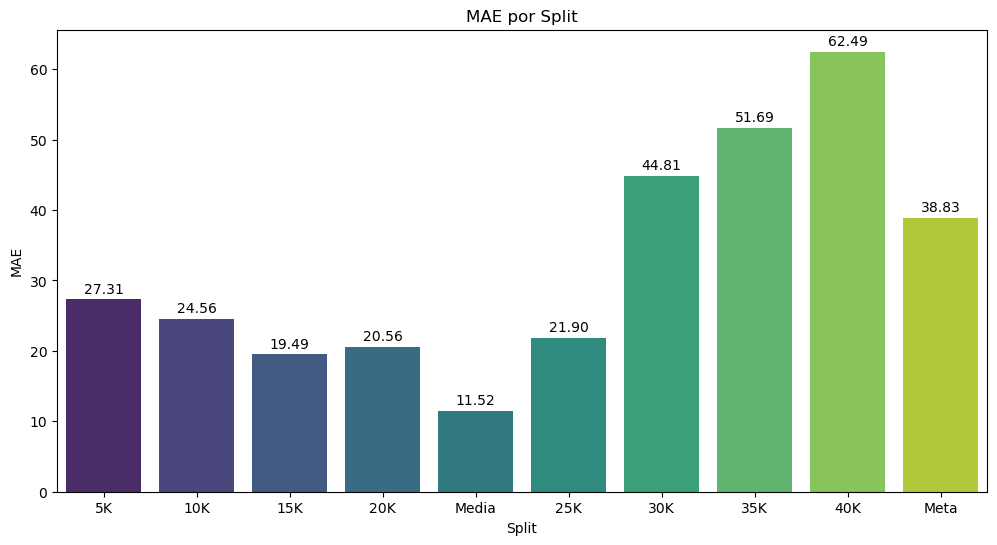

In [207]:
plot_metric_bars(df_metrics_xgb_mar['MAE'], split_cols_maraton, metric_name='MAE')

Vemos como el resultado con un modelod e rgresión no mejora al de KNN imputer con estos datos. 

##### LightGBM

LightGBM aproxima la función mediante un ensamble de árboles de decisión, pero usando un crecimiento **leaf-wise** que permite reducir el error de forma más rápida y eficiente:

$$
\hat{y} = \sum_{m=1}^{M} \eta \cdot T_m(X)
$$

donde $T_m$ representa cada árbol, $M$ el número de árboles y $\eta$ la tasa de aprendizaje. Cada árbol corrige los errores del anterior según el gradiente del loss:

$$
T_m(X) \approx -\frac{\partial L(y,\hat{y})}{\partial \hat{y}}, \quad
L(y,\hat{y}) = (y - \hat{y})^2
$$

LightGBM es especialmente adecuado por razones similares a XGB. Además, soporta la imputación directa de valores faltantes y permite imponer restricciones monotónicas si se desea garantizar un comportamiento coherente entre splits.

En resumen, LightGBM permite aproximar la función compleja:

$$
15K = f(\text{otros splits},\,\text{edad},\,\text{género})
$$

de manera eficiente y precisa, siendo ideal para reconstruir splits faltantes en maratones.


Fine-tuning e imputando split: 5K
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2552
[LightGBM] [Info] Number of data points in the train set: 16490, number of used features: 11
[LightGBM] [Info] Start training from score 1582.004774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

INFO: Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2273876244.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='gender', y='abs_error', data=df_todos_splits, palette='pastel')
INFO: Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


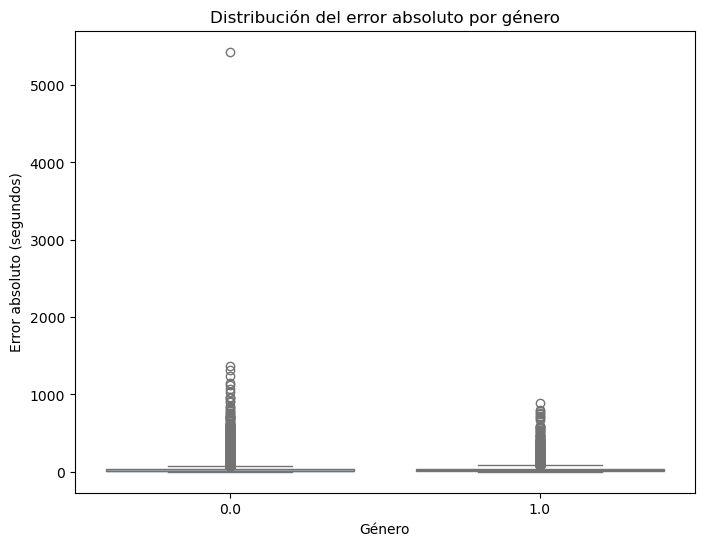

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2273876244.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='edad_grupo', y='abs_error', data=df_todos_splits, palette='pastel')


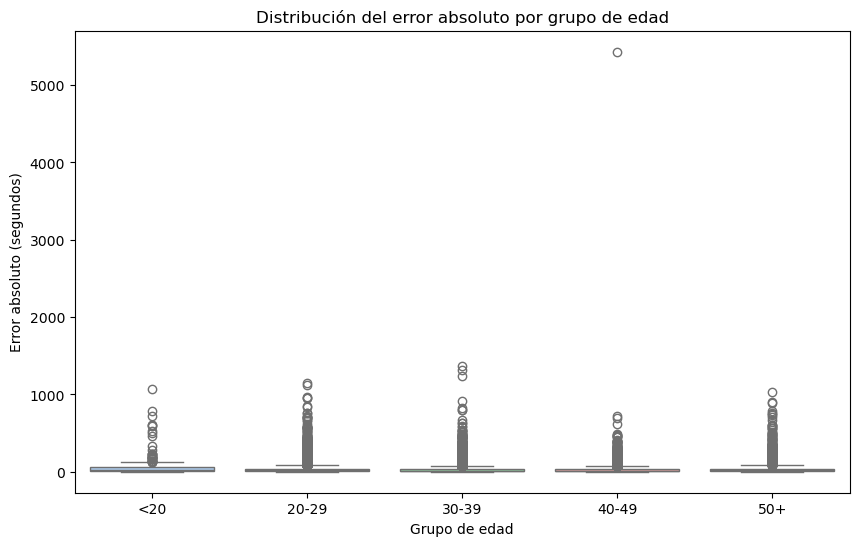

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2273876244.py:96: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='split', y='abs_error', data=df_todos_splits, palette='pastel')


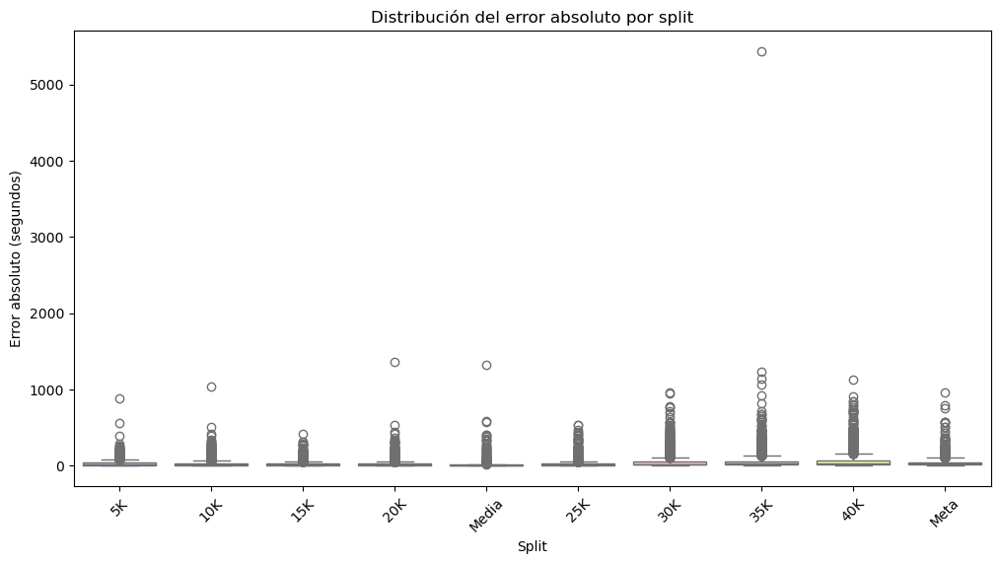

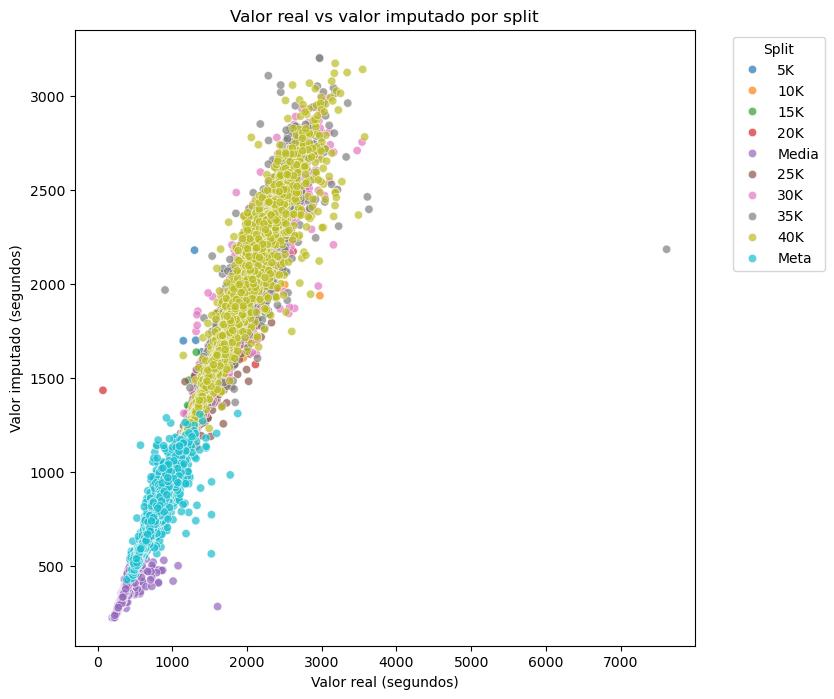

In [ ]:
import pandas as pd
from lightgbm import LGBMRegressor

param_grid_lgbm = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],  
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0], 
}

df_metrics_lgbm, comparison_mar_lgbm = imputar_todos_splits(df_feat_mar_regr, split_cols_maraton, LGBMRegressor, param_grid=param_grid_lgbm)
graficar_imputacion(comparison_mar_lgbm)

In [209]:
df_mal_mar_lgbm, df_bien_mar_lgbm, df_comparacion_mar_lgbm, df_splits_mar_lgbm, df_features_mar_lgbm = analisis_mal_imputado(df_feat_mar_regr, comparison_mar_lgbm)

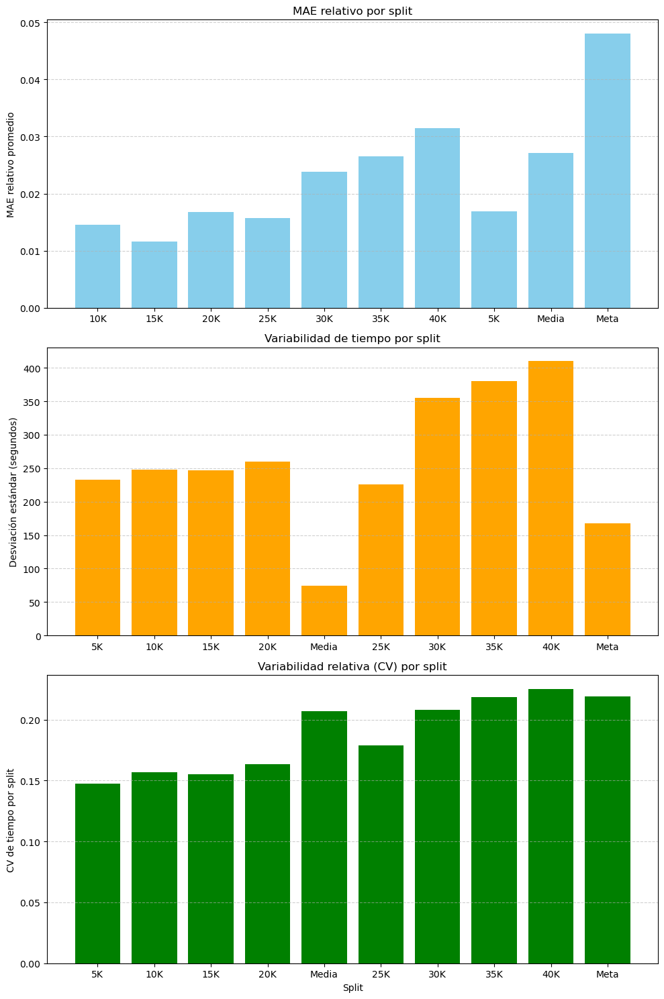

In [ ]:
df_imputados_mar_lgbm = pd.concat([df_mal_mar_lgbm, df_bien_mar_lgbm], ignore_index=True)

df_imputados_mar_lgbm['MAE_relativo'] = np.abs(df_imputados_mar_lgbm['valor_real'] - df_imputados_mar_lgbm['valor_imputado']) / df_imputados_mar_lgbm['valor_real']

mae_por_split_mar_lgbm = df_imputados_mar_lgbm.groupby('split')['MAE_relativo'].mean().reset_index()

graficos_variabilidad_split(mae_por_split_mar_lgbm, df_feat_mar_regr, split_cols_maraton)

In [ ]:
resumen_grupos_error(df_mal_mar_lgbm)

Grupo ≥10%: 837 atletas
Grupo ≥25%: 104 atletas
Grupo ≥50%: 8 atletas
Grupo ≥100%: 2 atletas


Número de atletas imputados con error ≤10%: 4123


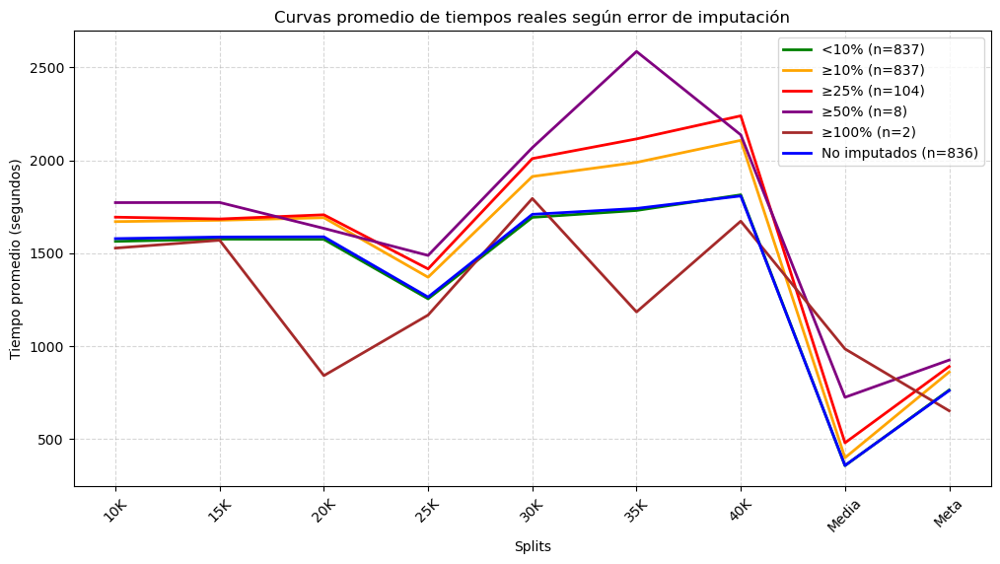

In [ ]:
comparison_mar_lgbm['fue_imputado'] = comparison_mar_lgbm['abs_error'] > 0

atletas_bien_imputados_mar_lgbm = comparison_mar_lgbm[(comparison_mar_lgbm['fue_imputado']) & 
                                    (comparison_mar_lgbm['abs_error'] <= 0.1 * comparison_mar_lgbm['valor_real'])]['athlete_id'].unique()

print("Número de atletas imputados con error ≤10%:", len(atletas_bien_imputados_mar_lgbm))

graficar_curvas_error_imputacion(df_feat_mar_regr, df_mal_mar_lgbm, atletas_bien_imputados_mar_lgbm, atletas_no_imputados_mar)

In [ ]:
conteo_mar_lgbm, atleta_id_mar_lgbm, tiempo_mar_lgbm, errores_mar_lgbm = analizar_mejores_atletas(df_feat_mar_regr, df_mal_mar_lgbm, atletas_bien_imputados_mar_lgbm)

print(conteo_mar_lgbm)
print(errores_mar_lgbm)

Top 10 atletas imputados más rápidos:
1. Atleta ID: 01eca658-9206-509d-b977-10aa8c33dcb9, Tiempo total: inf segundos
2. Atleta ID: 11A41D26, Tiempo total: inf segundos
3. Atleta ID: 11B3A733, Tiempo total: inf segundos
4. Atleta ID: 129FAF13, Tiempo total: inf segundos
5. Atleta ID: 13F92F3Y, Tiempo total: inf segundos
6. Atleta ID: 14975D5C, Tiempo total: inf segundos
7. Atleta ID: 14B15Z64, Tiempo total: inf segundos
8. Atleta ID: 14BD8223, Tiempo total: inf segundos
9. Atleta ID: 15713ZF4, Tiempo total: inf segundos
10. Atleta ID: 15C295Y3, Tiempo total: inf segundos
{'<10%': 35, '≥10%': 4, '≥25%': 1, '≥50%': 0, '≥100%': 0}
                                 athlete_id  split  valor_real  \
16466  01eca658-9206-509d-b977-10aa8c33dcb9    20K    2001.858   
28835  01eca658-9206-509d-b977-10aa8c33dcb9    30K    2398.527   
32958  01eca658-9206-509d-b977-10aa8c33dcb9    35K    3347.550   
37081  01eca658-9206-509d-b977-10aa8c33dcb9    40K    3573.921   
20589  01eca658-9206-509d-b977-10aa

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\3410432367.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Split', y=metric_name, data=df, palette='viridis')


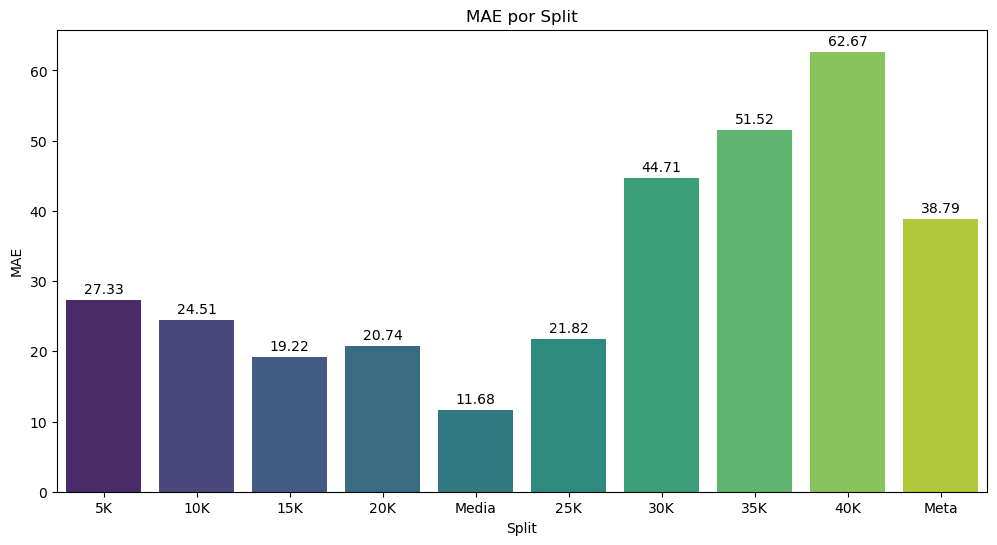

In [214]:
plot_metric_bars(df_metrics_lgbm['MAE'], split_cols_maraton, metric_name='MAE')

## Ajuste temporal

In [230]:
df_wide_maraton = preparar_datos(athletes_events_df, athletes_time_df, athletes_df,
    race_id_filter='49603c2f-1b2b-457f-b82e-fed8bded1d3d', event_std_filter='maraton', split_cols=split_cols_maraton)

Pivot terminado. Columnas: ['10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta']
Columnas df_wide antes del merge: ['athlete_id', 'race_id', 'event_id', '10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta']
Merge completado. Columnas df_wide ahora: ['athlete_id', 'race_id', 'event_id', '10K', '15K', '20K', '25K', '30K', '35K', '40K', '5K', 'Media', 'Meta', 'rawTime_5K', 'rawTime_10K', 'rawTime_15K', 'rawTime_20K', 'rawTime_Media', 'rawTime_25K', 'rawTime_30K', 'rawTime_35K', 'rawTime_40K', 'rawTime_Meta']


In [217]:
df_wide_maraton.head(5)

,athlete_id,race_id,event_id,10K,15K,20K,25K,30K,35K,40K,5K,Media,Meta,rawTime_5K,rawTime_10K,rawTime_15K,rawTime_20K,rawTime_Media,rawTime_25K,rawTime_30K,rawTime_35K,rawTime_40K,rawTime_Meta,gender,age,total_time_sec
0,01eca658-9206-509d-b977-10aa8c33dcb9,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,2157.272,2184.206,2001.858,1798.400,2398.527,3347.550,3573.921,1946.076,594.604,960.082,2025-03-16 09:00:52.812999936,2025-03-16 09:36:50.084999936,2025-03-16 10:13:14.291000064,2025-03-16 10:46:36.148999936,2025-03-16 10:56:30.752999936,2025-03-16 11:26:29.152999936,2025-03-16 12:06:27.680000000,2025-03-16 13:02:15.230000128,2025-03-16 14:01:49.151000064,2025-03-16 14:17:49.232999936,1.0,32.917180,0.0
1,042a4b4e-6e1c-5896-9173-b0fc7963d82c,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,1580.306,1565.930,1555.900,1241.632,1636.204,1653.280,1749.712,1552.853,349.867,796.298,2025-03-16 08:11:53.760999936,2025-03-16 08:38:14.067000064,2025-03-16 09:04:19.996999936,2025-03-16 09:30:15.896999936,2025-03-16 09:36:05.764000000,2025-03-16 09:56:47.396000000,2025-03-16 10:24:03.600000000,2025-03-16 10:51:36.880000000,2025-03-16 11:20:46.592000000,2025-03-16 11:34:02.889999872,0.0,26.913073,0.0
2,04a810fd-4cd3-5521-9ebb-bb50c3897b6e,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,1472.570,1523.032,1567.877,1372.686,2224.020,2171.176,2343.507,1443.249,377.513,985.099,2025-03-16 08:09:44.352000000,2025-03-16 08:34:16.921999872,2025-03-16 08:59:39.953999872,2025-03-16 09:25:47.831000064,2025-03-16 09:32:05.344000000,2025-03-16 09:54:58.030000128,2025-03-16 10:32:02.049999872,2025-03-16 11:08:13.225999872,2025-03-16 11:47:16.732999936,2025-03-16 12:03:41.832000000,0.0,46.190281,0.0
3,05b1654f-a583-5e81-a92b-78fa6637f114,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,1015.678,1019.456,1011.072,791.899,1017.761,1011.987,993.659,1020.527,224.714,425.156,2025-03-16 07:48:15.832000000,2025-03-16 08:05:11.510000128,2025-03-16 08:22:10.966000128,2025-03-16 08:39:02.038000128,2025-03-16 08:42:46.752000000,2025-03-16 08:55:58.651000064,2025-03-16 09:12:56.412000000,2025-03-16 09:29:48.399000064,2025-03-16 09:46:22.057999872,2025-03-16 09:53:27.214000128,1.0,21.149897,0.0
4,10c487b4-1cd7-519c-8521-602bd48ed08d,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,1274.451,1292.676,1276.789,998.969,1258.380,1264.870,1246.995,1304.114,278.957,522.230,2025-03-16 07:54:09.697999872,2025-03-16 08:15:24.148999936,2025-03-16 08:36:56.824999936,2025-03-16 08:58:13.614000128,2025-03-16 09:02:52.571000064,2025-03-16 09:19:31.540000000,2025-03-16 09:40:29.920000000,2025-03-16 10:01:34.790000128,2025-03-16 10:22:21.784999936,2025-03-16 10:31:04.015000064,1.0,37.500342,0.0


In [218]:
df_wide_maraton['gender_label'] = df_wide_maraton['gender'].map({0: 'Hombre', 1: 'Mujer'})

In [219]:
split_cols_maraton = ['5K','10K','15K','20K','Media','25K', '30K', '35K', '40K', 'Meta']

split_dist_maraton = [5000, 5000, 5000, 5000, 1000, 4000, 5000, 5000, 5000, 2195]

df_wide_maraton['total_time_sec'] = df_wide_maraton[split_cols_maraton].sum(axis=1)

def preparar_df_carrera(df_wide, split_cols, split_dist):

    df = df_wide.copy()

    df['total_time_sec'] = df[split_cols].sum(axis=1)

    for col, dist in zip(split_cols, split_dist):
        df[f'pace_{col}'] = 1 / (df[col] / dist)

    pace_cols = [f'pace_{col}' for col in split_cols]

    df_feat = crear_features_carrera(df, split_cols, pace_cols)

    return df_feat, pace_cols

In [220]:
df_feat_maraton, pace_cols_maraton = preparar_df_carrera(
    df_wide_maraton,
    split_cols_maraton,
    split_dist_maraton
)

### KMeans

In [221]:
def cluster_splits_KNN(df_wide, ordered_splits, k_values=[2,3,4,5,6,7,8,9,10,12,15], iqr_multiplier=3, random_state=42):
    """
    Limpia outliers, transforma datos, aplica MiniBatchKMeans para varios k y devuelve resultados y gráficos.
    
    Parámetros:
    - df_wide: DataFrame con los splits como columnas.
    - ordered_splits: lista de nombres de columnas de splits.
    - k_values: lista de valores de k a evaluar.
    - iqr_multiplier: multiplicador para definir outliers (default=3).
    - random_state: semilla para reproducibilidad.
    
    Retorna:
    - df_wide_clean: DataFrame con la columna 'cluster' asignada.
    - centroid_df: DataFrame con centroides de cada cluster en segundos.
    - best_k: valor óptimo de k según Silhouette Score.
    - inertia_values: lista de inertia por cada k evaluado.
    """
    df_wide_clean = df_wide.copy()
    for col in ordered_splits:
        q1 = df_wide_clean[col].quantile(0.25)
        q3 = df_wide_clean[col].quantile(0.75)
        iqr = q3 - q1
        upper_limit = q3 + iqr_multiplier * iqr
        df_wide_clean = df_wide_clean[df_wide_clean[col] <= upper_limit]

    print(f"Filas después de eliminar outliers: {len(df_wide_clean)}")
    
    df_wide_clean[ordered_splits] = df_wide_clean[ordered_splits].apply(np.log1p)

    X = df_wide_clean[ordered_splits].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    best_score = -1
    best_k = None
    best_labels = None
    best_model = None
    inertia_values = []

    for k in k_values:
        kmeans = MiniBatchKMeans(n_clusters=k, random_state=random_state, batch_size=1000)
        labels = kmeans.fit_predict(X_scaled)
        score = silhouette_score(X_scaled, labels)
        inertia_values.append(kmeans.inertia_)
        print(f"k={k}, silhouette_score={score:.4f}")

        if score > best_score:
            best_score = score
            best_k = k
            best_labels = labels
            best_model = kmeans

    print(f"\nMejor k según Silhouette: {best_k} (score={best_score:.4f})")

    df_wide_clean['cluster'] = best_labels

    centroids_scaled = best_model.cluster_centers_
    centroids_real = np.expm1(scaler.inverse_transform(centroids_scaled))
    centroid_df = pd.DataFrame(centroids_real, columns=ordered_splits)
    print("\nCentroides por cluster (tiempos en segundos):")
    print(centroid_df)

    plt.figure(figsize=(10,6))
    for i, centroide in enumerate(centroids_real):
        plt.plot(ordered_splits, centroide, marker='o', label=f'Cluster {i}')
    plt.xlabel("Split")
    plt.ylabel("Tiempo en split (segundos)")
    plt.title(f"Centroides de clusters - k={best_k}")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(8,5))
    plt.plot(k_values, inertia_values, marker='o')
    plt.xlabel('Número de clusters k')
    plt.ylabel('Inertia (Suma de errores cuadráticos)')
    plt.title('Elbow Method para determinar k óptimo')
    plt.grid(True)
    plt.show()

    return df_wide_clean, centroid_df, best_k, inertia_values

In [222]:
df_mar_clean, centroid_mar, best_k_mar, inertia_mar = cluster_splits_KNN(
    df_wide_maraton,
    split_cols_maraton,
    k_values=[2,3,4,5,6,7,8,9,10,12,15],
    iqr_multiplier=3,
    random_state=42
)

Filas después de eliminar outliers: 20358


c:\Users\mario\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1955: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 1536 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


k=2, silhouette_score=0.4726


c:\Users\mario\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1955: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 1536 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


KeyboardInterrupt: 

### PCA y TSNE y UMAP

#### PCA

In [232]:
def construir_grupo_error_por_atleta(comparison):
    """
    Devuelve un DataFrame con athlete_id y su grupo de error máximo
    """
    df = comparison.copy()

    # Calcular error relativo
    df['error_relativo'] = df['abs_error'] / df['valor_real']

    def asignar_grupo(err):
        if err >= 1.0:
            return '≥100%'
        elif err >= 0.5:
            return '≥50%'
        elif err >= 0.25:
            return '≥25%'
        elif err >= 0.10:
            return '≥10%'
        else:
            return '<10%'

    # Error máximo por atleta
    df_atleta = (
        df.groupby('athlete_id')['error_relativo']
          .max()
          .reset_index()
    )

    df_atleta['grupo_error'] = df_atleta['error_relativo'].apply(asignar_grupo)

    return df_atleta[['athlete_id', 'grupo_error']]

In [ ]:
def plot_pca_analysis(df_wide, split_cols, comparison_knn= comparison_knn_mar):
    """
    Realiza PCA sobre los splits y genera gráficos por:
    - Género
    - Grupo de edad
    - Club
    - Grupo de tiempo total (cuantiles)
    - Ritmo (variable continua)
    Para combinaciones:
    - PCA1 vs PCA2
    - PCA2 vs PCA3
    - PCA1 vs PCA3
    """

    X = df_wide[split_cols].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X_scaled)

    explained_variance = pca.explained_variance_ratio_
    print("=== Variancia explicada por componente ===")
    for i, var in enumerate(explained_variance, 1):
        print(f"PCA{i}: {var*100:.2f}%")

    print("\n=== Estadísticas de los scores PCA ===")
    for i in range(3):
        comp_scores = X_pca[:, i]
        print(f"PCA{i+1}: mean={np.mean(comp_scores):.3f}, std={np.std(comp_scores):.3f}, "
              f"min={np.min(comp_scores):.3f}, max={np.max(comp_scores):.3f}")

    print("\n=== Importancia de cada variable en cada componente (loadings) ===")
    for i in range(3):
        print(f"\nPCA{i+1}:")
        for var, loading in zip(split_cols, pca.components_[i]):
            print(f"  {var}: {loading:.4f}")

    df_plot = df_wide.copy()
    df_plot["PCA1"] = X_pca[:, 0]
    df_plot["PCA2"] = X_pca[:, 1]
    df_plot["PCA3"] = X_pca[:, 2]

    df_grupo_error = construir_grupo_error_por_atleta(comparison_knn)
    df_plot = df_plot.merge(df_grupo_error, on='athlete_id', how='left')
    df_plot['grupo_error'] = df_plot['grupo_error'].fillna('No imputados')

    def scatter_by_variable(x_col, y_col, variable, title, labels=None, cmap=None, df_subset=None):
        df_to_plot = df_subset if df_subset is not None else df_plot

        plt.figure(figsize=(8,6))

        if cmap:
            sc = plt.scatter(
                df_to_plot[x_col],
                df_to_plot[y_col],
                c=df_to_plot[variable],
                s=30,
                alpha=0.5,
                cmap=cmap
            )
            plt.colorbar(sc, label=variable)

        else:
            group_sizes = df_to_plot[variable].value_counts()
            ordered_groups = group_sizes.index.tolist()

            if labels is not None:
                ordered_groups = sorted(
                    labels,
                    key=lambda x: group_sizes.get(x, 0),
                    reverse=True
                )

            for val in ordered_groups:
                subset = df_to_plot[df_to_plot[variable] == val]
                if not subset.empty:
                    plt.scatter(
                        subset[x_col],
                        subset[y_col],
                        s=30,
                        alpha=0.5,
                        label=val
                    )

            plt.legend(title=variable)

        plt.xlabel(x_col)
        plt.ylabel(y_col)
        plt.title(title)
        plt.grid(True)
        plt.show()


    scatter_by_variable("PCA1", "PCA2", "gender", "PCA1 vs PCA2 por Género")

    bins_edad = [0, 20, 30, 40, 50, 60, 100]
    labels_edad = ["<20", "20-29", "30-39", "40-49", "50-59", "60+"]
    df_plot["edad_grupo"] = pd.cut(df_plot["age"], bins=bins_edad, labels=labels_edad)
    scatter_by_variable("PCA1", "PCA2", "edad_grupo", "PCA1 vs PCA2 por grupo de edad", labels=labels_edad)

    orden_grupos = ['<10%', '≥10%', '≥25%', '≥50%', '≥100%']

    scatter_by_variable("PCA1", "PCA2", variable="grupo_error", title="PCA1 vs PCA2 por grupo de error de imputación", labels=orden_grupos, df_subset=df_plot[df_plot['grupo_error'] != 'No imputados'])

    top_clubs = df_plot["club"].value_counts().head(6).index
    df_plot["club_reducido"] = df_plot["club"].apply(lambda x: x if x in top_clubs else "Otros")
    scatter_by_variable("PCA1", "PCA2", "club_reducido", "PCA1 vs PCA2 por Club")

    df_plot["tiempo_total"] = df_plot[split_cols].sum(axis=1)
    percentiles = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
    bin_values = df_plot["tiempo_total"].quantile(percentiles).values
    bin_labels = ["Top 20%", "20-40%", "40-60%", "60-80%", "Bottom 20%"]
    df_plot["grupo_tiempo"] = pd.cut(df_plot["tiempo_total"], bins=bin_values,
                                     labels=bin_labels, include_lowest=True)
    scatter_by_variable("PCA1", "PCA2", "grupo_tiempo", "PCA1 vs PCA2 por grupo de tiempo", labels=bin_labels)

    df_plot["pace"] = 21097.5 / df_plot["tiempo_total"]
    scatter_by_variable("PCA1", "PCA2", "pace", "PCA1 vs PCA2 coloreado por ritmo", cmap="viridis")

    scatter_by_variable("PCA2", "PCA3", "gender", "PCA2 vs PCA3 por Género")
    scatter_by_variable("PCA2", "PCA3", "edad_grupo", "PCA2 vs PCA3 por grupo de edad", labels=labels_edad)
    scatter_by_variable("PCA2", "PCA3", "club_reducido", "PCA2 vs PCA3 por Club")
    scatter_by_variable("PCA2", "PCA3", "grupo_tiempo", "PCA2 vs PCA3 por grupo de tiempo", labels=bin_labels)
    scatter_by_variable("PCA2", "PCA3", "pace", "PCA2 vs PCA3 coloreado por ritmo", cmap="viridis")
    scatter_by_variable("PCA2", "PCA3", "grupo_error", "PCA2 vs PCA3 por grupo de error", labels=orden_grupos, df_subset=df_plot[df_plot['grupo_error'] != 'No imputados'] )

    scatter_by_variable("PCA1", "PCA3", "gender", "PCA1 vs PCA3 por Género")
    scatter_by_variable("PCA1", "PCA3", "edad_grupo", "PCA1 vs PCA3 por grupo de edad", labels=labels_edad)
    scatter_by_variable("PCA1", "PCA3", "club_reducido", "PCA1 vs PCA3 por Club")
    scatter_by_variable("PCA1", "PCA3", "grupo_tiempo", "PCA1 vs PCA3 por grupo de tiempo", labels=bin_labels)
    scatter_by_variable("PCA1", "PCA3", "pace", "PCA1 vs PCA3 coloreado por ritmo", cmap="viridis")
    scatter_by_variable("PCA1", "PCA3", "grupo_error", "PCA1 vs PCA3 por grupo de error", labels=orden_grupos, df_subset=df_plot[df_plot['grupo_error'] != 'No imputados'] )

    return df_plot, X_scaled, X_pca, pca

In [234]:
split_cols = ['5K','10K','15K','20K','Media','25K','30K','35K','40K','Meta']
split_dist = [5000, 5000, 5000, 5000, 1000, 4000, 5000, 5000, 5000, 2195]

for col, dist in zip(split_cols, split_dist):
    df_wide_maraton[f'pace_{col}'] = 1 / (df_wide_maraton[col] / dist)

pace_cols = [f'pace_{col}' for col in split_cols]

df_feat_maraton = crear_features_carrera(df_wide_maraton, split_cols, pace_cols)

=== Variancia explicada por componente ===
PCA1: 85.41%
PCA2: 6.83%
PCA3: 2.62%

=== Estadísticas de los scores PCA ===
PCA1: mean=0.000, std=2.923, min=-7.990, max=12.384
PCA2: mean=0.000, std=0.826, min=-3.773, max=20.558
PCA3: mean=-0.000, std=0.512, min=-9.912, max=26.422

=== Importancia de cada variable en cada componente (loadings) ===

PCA1:
  5K: 0.3192
  10K: 0.3226
  15K: 0.3281
  20K: 0.3306
  Media: 0.3067
  25K: 0.3314
  30K: 0.3244
  35K: 0.3131
  40K: 0.3032
  Meta: 0.2793

PCA2:
  5K: -0.3210
  10K: -0.3197
  15K: -0.2715
  20K: -0.2182
  Media: -0.1676
  25K: -0.0760
  30K: 0.1376
  35K: 0.3445
  40K: 0.4766
  Meta: 0.5241

PCA3:
  5K: 0.2915
  10K: 0.2300
  15K: 0.1499
  20K: 0.0607
  Media: -0.4032
  25K: -0.1592
  30K: -0.3593
  35K: -0.3209
  40K: -0.0724
  Meta: 0.6409


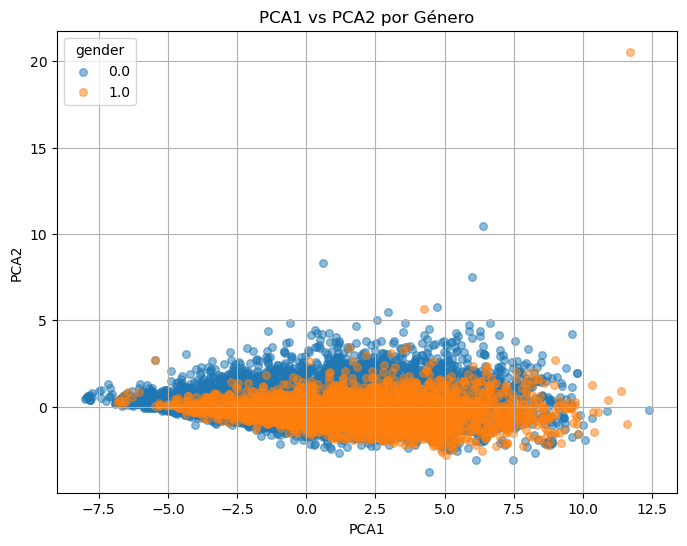

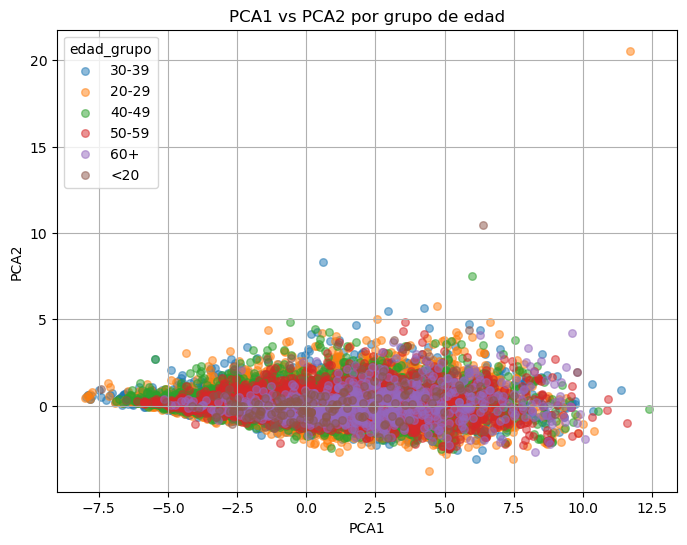

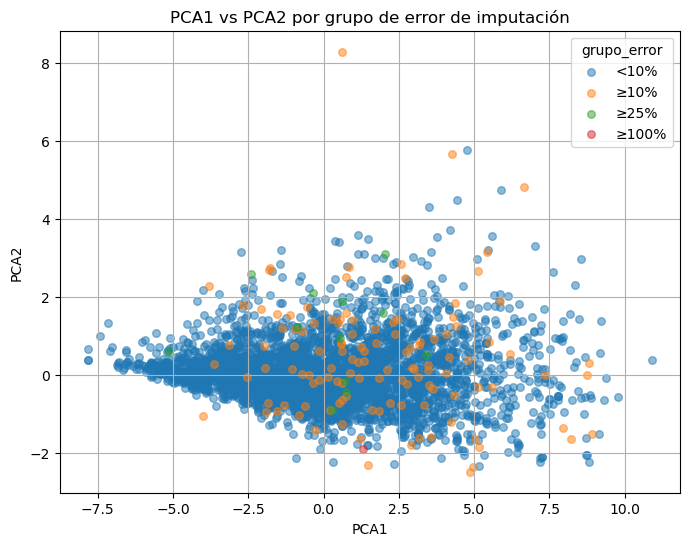

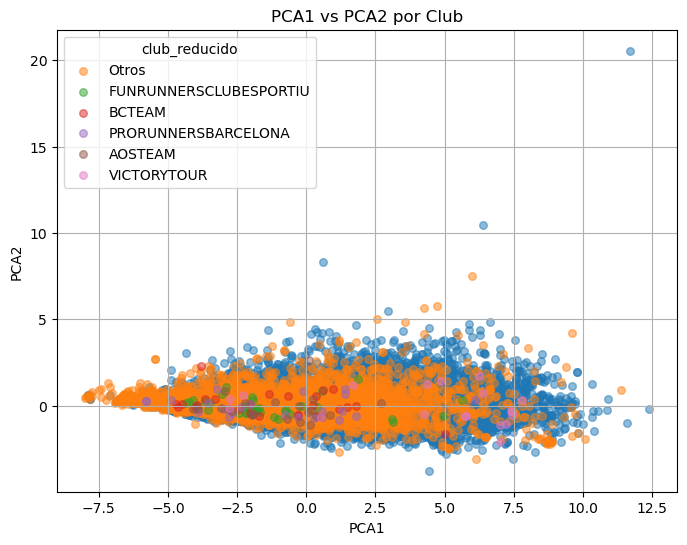

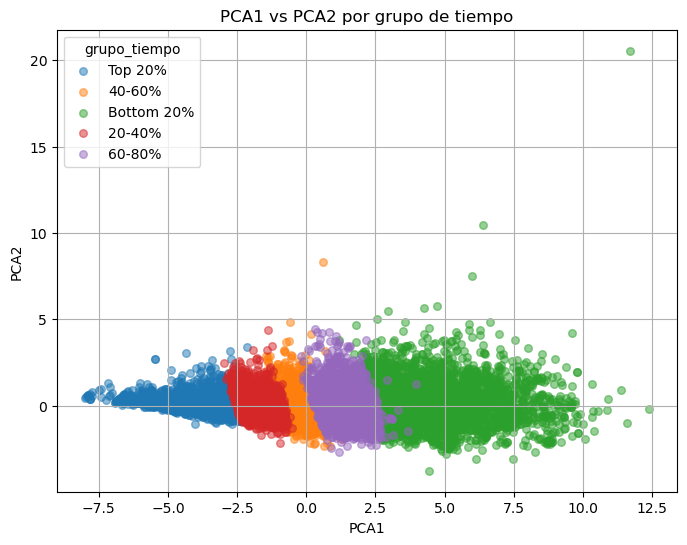

...

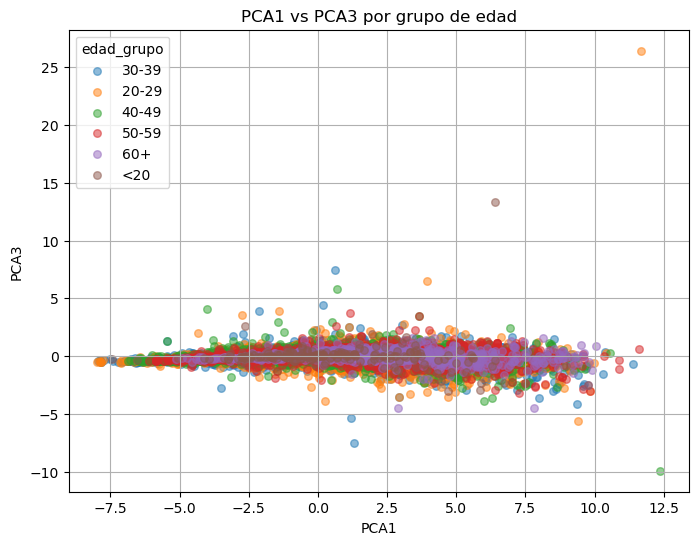

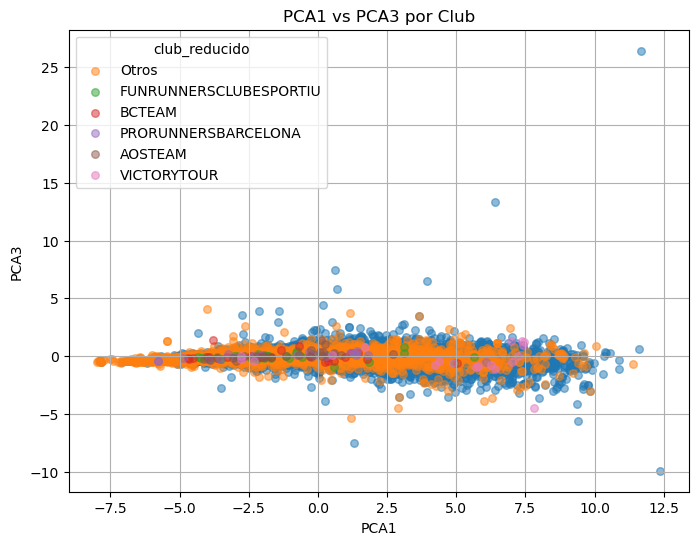

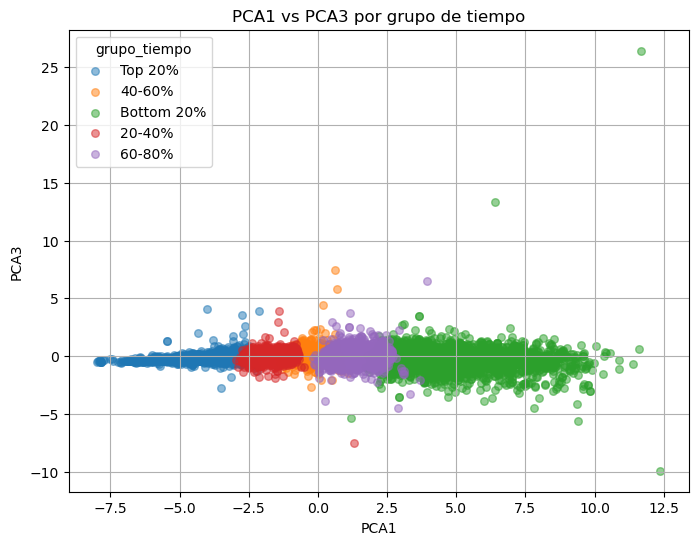

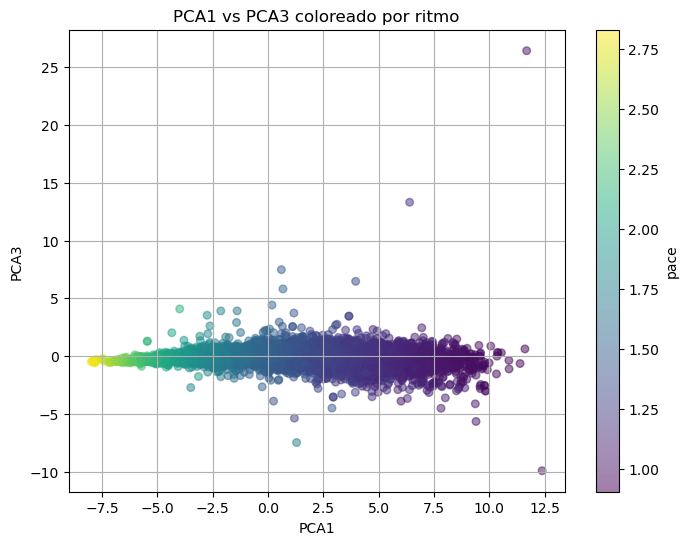

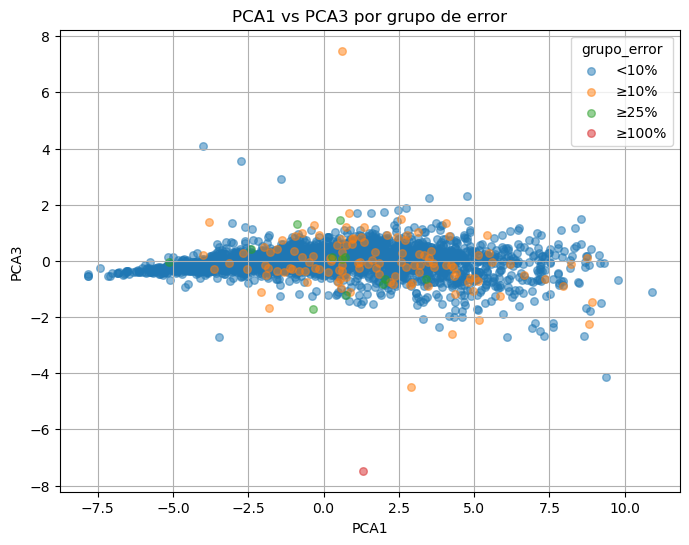

In [235]:
df_plot_mar, X_scaled_mar, X_pca_mar, pca_mar = plot_pca_analysis(
    df_feat_maraton,
    split_cols_maraton,
    comparison_knn_mar
)

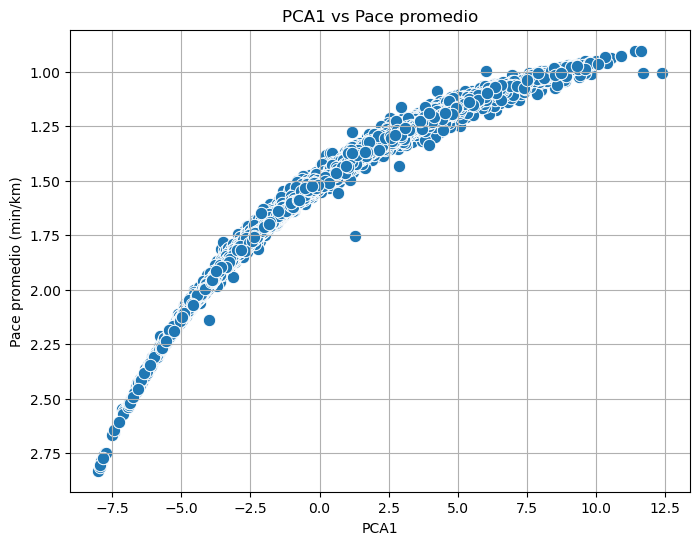

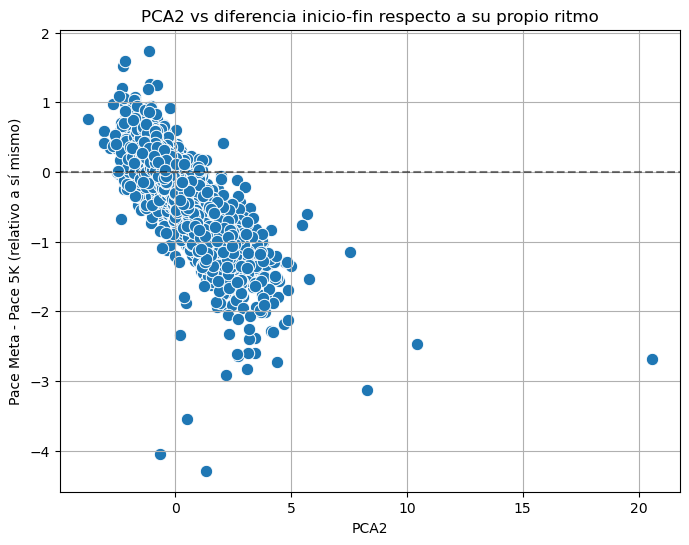

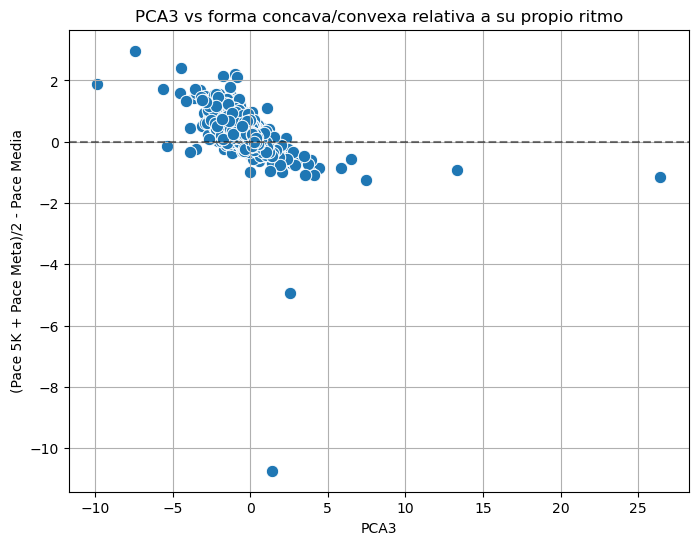

In [ ]:
df_plot_mar['delta_inicio_fin'] = df_plot_mar['pace_Meta'] - df_plot_mar['pace_5K']
df_plot_mar['concavidad'] = (df_plot_mar['pace_5K'] + df_plot_mar['pace_Meta'])/2 - df_plot_mar['pace_Media']

plt.figure(figsize=(8,6))
sns.scatterplot(x='PCA1', y='pace', data=df_plot_mar, s=80)
plt.title('PCA1 vs Pace promedio')
plt.xlabel('PCA1')
plt.ylabel('Pace promedio (min/km)')
plt.gca().invert_yaxis()  
plt.grid(True)
plt.show()


plt.figure(figsize=(8,6))
sns.scatterplot(x='PCA2', y='delta_inicio_fin', data=df_plot_mar, s=80)
plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.title('PCA2 vs diferencia inicio-fin respecto a su propio ritmo')
plt.xlabel('PCA2')
plt.ylabel('Pace Meta - Pace 5K (relativo a sí mismo)')
plt.grid(True)
plt.show()


plt.figure(figsize=(8,6))
sns.scatterplot(x='PCA3', y='concavidad', data=df_plot_mar, s=80)
plt.axhline(0, color='black', linestyle='--', alpha=0.5)
plt.title('PCA3 vs forma concava/convexa relativa a su propio ritmo')
plt.xlabel('PCA3')
plt.ylabel('(Pace 5K + Pace Meta)/2 - Pace Media')
plt.grid(True)
plt.show()


In [ ]:
def analizar_pca_splits(df_wide, split_cols):
    """
    Analiza los splits usando PCA:
    - Visualiza curvas de splits variando PCA2 con PCA1 fijo
    - Visualiza curvas de splits variando PCA3 con PCA1 y PCA2 fijos
    - Mantiene loggings de varianza explicada y reconstrucción
    """

    X = df_wide[split_cols].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X_scaled)
    explained = pca.explained_variance_ratio_
    print(f"Varianza explicada PCA1: {explained[0]*100:.2f}%, PCA2: {explained[1]*100:.2f}%, PCA3: {explained[2]*100:.2f}%")

    
    pca1_fixed = 0
    pca2_vals = np.linspace(-5, 5, 10)
    reconstructed_curves_pca2 = []

    for pca2 in pca2_vals:
        pca_vec = np.array([pca1_fixed, pca2, 0]) 
        x_reconstructed_scaled = pca.inverse_transform(pca_vec)
        x_reconstructed = scaler.inverse_transform(x_reconstructed_scaled.reshape(1, -1)).flatten()
        reconstructed_curves_pca2.append(x_reconstructed)

    plt.figure(figsize=(10,6))
    for i, curve in enumerate(reconstructed_curves_pca2):
        plt.plot(split_cols, curve, marker='o', label=f'PCA2={pca2_vals[i]:.1f}')
    plt.xlabel("Splits")
    plt.ylabel("Tiempo (s)")
    plt.title(f"Curvas de tiempo reconstruidas variando PCA2 (PCA1={pca1_fixed})")
    plt.legend()
    plt.grid(True)
    plt.show()


    pca3_vals = np.linspace(-5, 5, 10)
    reconstructed_curves_pca3 = []

    for pca3 in pca3_vals:
        pca_vec = np.array([pca1_fixed, 0, pca3])  
        x_reconstructed_scaled = pca.inverse_transform(pca_vec)
        x_reconstructed = scaler.inverse_transform(x_reconstructed_scaled.reshape(1, -1)).flatten()
        reconstructed_curves_pca3.append(x_reconstructed)

    plt.figure(figsize=(10,6))
    for i, curve in enumerate(reconstructed_curves_pca3):
        plt.plot(split_cols, curve, marker='o', label=f'PCA3={pca3_vals[i]:.1f}')
    plt.xlabel("Splits")
    plt.ylabel("Tiempo (s)")
    plt.title(f"Curvas de tiempo reconstruidas variando PCA3 (PCA1={pca1_fixed}, PCA2=0)")
    plt.legend()
    plt.grid(True)
    plt.show()

    return X_pca, pca, scaler, reconstructed_curves_pca2, reconstructed_curves_pca3

Varianza explicada PCA1: 85.42%, PCA2: 6.83%, PCA3: 2.62%


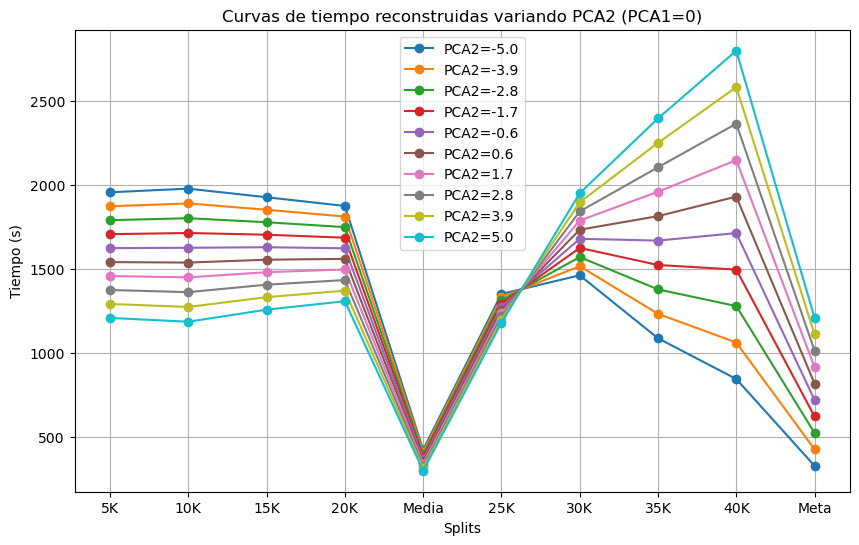

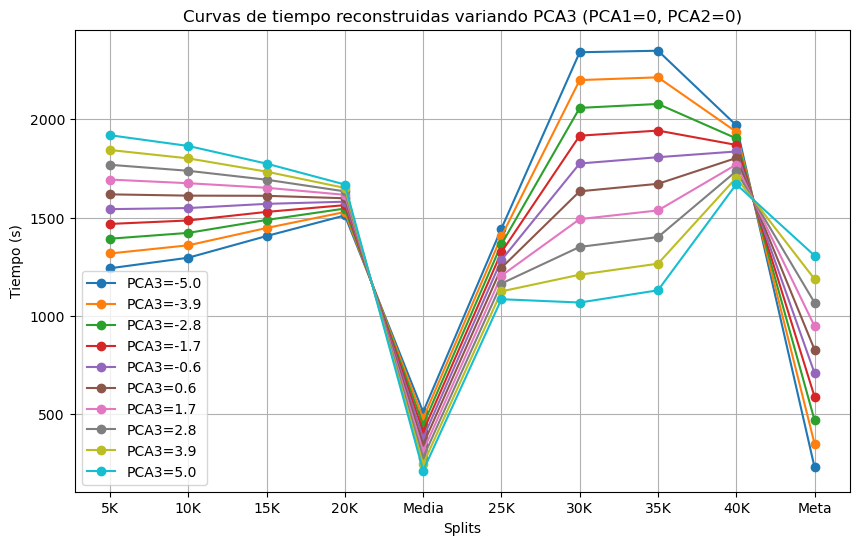

(array([[ 7.89936098,  1.41014913, -1.83293552],
        [-0.32213762,  0.02750434,  0.27953094],
        [ 1.36848949,  2.22562189, -0.64037071],
        ...,
        [ 4.52013963,  0.18747935,  0.38269663],
        [-7.82711132,  0.3856174 , -0.54541765],
        [-0.28561284,  1.02374953,  0.25387872]]),
 PCA(n_components=3),
 StandardScaler(),
 [array([1954.09362217, 1975.80489055, 1924.51665761, 1872.76908002,
          422.31435976, 1349.22579178, 1460.15798156, 1085.55239167,
          843.23083762,  326.47050789]),
  array([1871.04005682, 1887.81900817, 1850.20599756, 1809.79404218,
          408.44319232, 1330.21161656, 1514.43663182, 1230.87325878,
         1060.24557481,  424.36362656]),
  array([1787.98649147, 1799.83312578, 1775.89533751, 1746.81900434,
          394.57202488, 1311.19744134, 1568.71528208, 1376.19412588,
         1277.26031201,  522.25674522]),
  array([1704.93292611, 1711.8472434 , 1701.58467746, 1683.8439665 ,
          380.70085745, 1292.18326613, 1622.

In [ ]:
analizar_pca_splits(df_wide_maraton, split_cols_maraton)

#### TSNE

In [ ]:
def plot_tsne_subplots(df, X_scaled, perplexity, title_prefix="t-SNE"):
    """
    Genera subplots t-SNE 3x2, coloreando por distintas variables y 
    dibujando los grupos más grandes al fondo para evitar superposición.
    """

    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity, max_iter=1000)
    X_tsne = tsne.fit_transform(X_scaled)
    
    df["TSNE1"] = X_tsne[:, 0]
    df["TSNE2"] = X_tsne[:, 1]

    df_tsne_out = detect_outliers_mahalanobis(df, "TSNE1", "TSNE2")
    plot_with_outliers(df_tsne_out, "TSNE1", "TSNE2", title=f"{title_prefix} {perplexity} - Outliers")
    
    fig, axes = plt.subplots(3, 2, figsize=(14, 16))
    axes = axes.flatten()
    
    def scatter_ordered(ax, variable, cmap=None, ordered_labels=None, title=None):
        df_to_plot = df.copy()
        if cmap is None:
            group_sizes = df_to_plot[variable].value_counts()
            if ordered_labels is not None:
                ordered = sorted(ordered_labels, key=lambda x: group_sizes.get(x, 0), reverse=True)
            else:
                ordered = group_sizes.index.tolist()
            for val in ordered:
                subset = df_to_plot[df_to_plot[variable] == val]
                if not subset.empty:
                    ax.scatter(subset["TSNE1"], subset["TSNE2"], s=30, alpha=0.6, label=val)
            ax.legend(title=variable)
        else:
            sc = ax.scatter(df_to_plot["TSNE1"], df_to_plot["TSNE2"], c=df_to_plot[variable], s=30, alpha=0.7, cmap=cmap)
            fig.colorbar(sc, ax=ax, label=variable)
        ax.set_title(title)
        ax.grid(True)
    
    scatter_ordered(axes[0], "gender", title=f"{title_prefix} {perplexity} - Género")
    scatter_ordered(axes[1], "edad_grupo", title=f"{title_prefix} {perplexity} - Edad")
    scatter_ordered(axes[2], "club_reducido", title=f"{title_prefix} {perplexity} - Club")
    scatter_ordered(axes[3], "grupo_tiempo", title=f"{title_prefix} {perplexity} - Grupo tiempo")
    scatter_ordered(axes[4], "pace", cmap="viridis", title=f"{title_prefix} {perplexity} - Ritmo continuo")
    
    if "grupo_error" in df.columns:
        orden_error = ['<10%', '≥10%', '≥25%', '≥50%', '≥100%']
        scatter_ordered(axes[5], "grupo_error", ordered_labels=orden_error, title=f"{title_prefix} {perplexity} - Grupo de error")
    else:
        axes[5].axis("off")
    
    plt.tight_layout()
    plt.show()

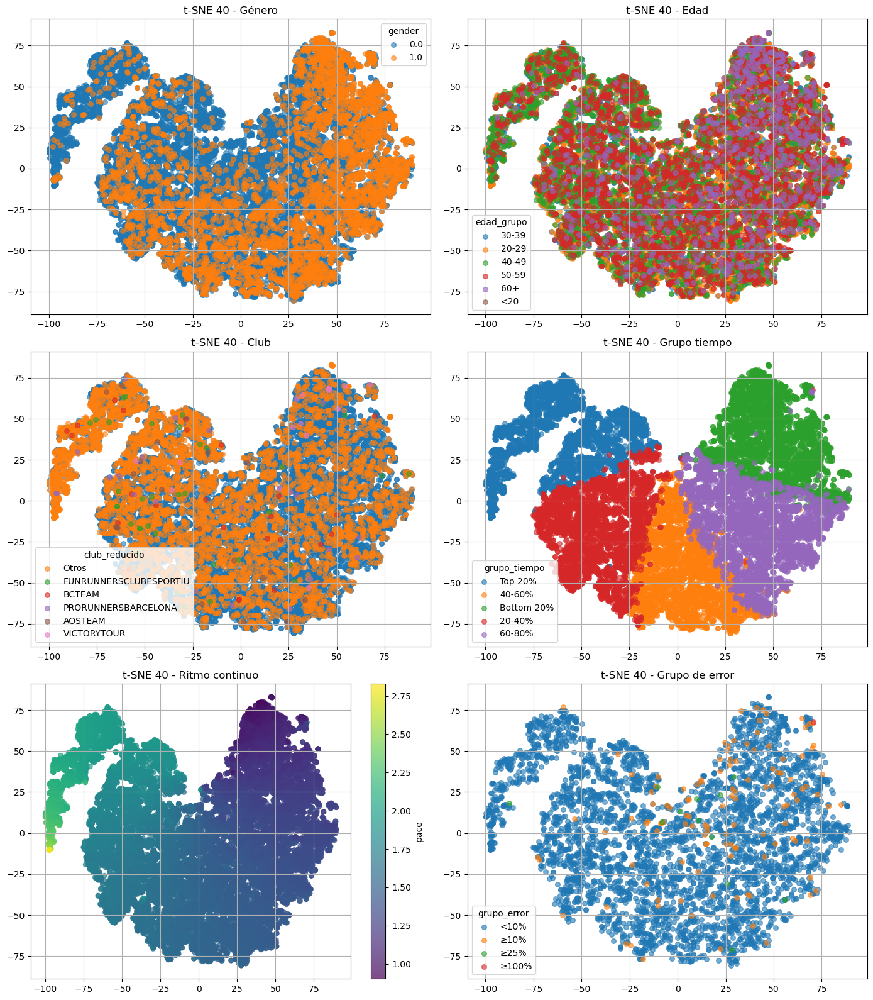

In [ ]:
df_tsne = df_plot_mar.copy()
plot_tsne_subplots(df_tsne, X_scaled_mar, perplexity=40, title_prefix="t-SNE")

#### UMAP

In [ ]:
def umap_analysis(df_wide, split_cols, n_neighbors=30, min_dist=0.1, metric='euclidean'):
    """
    Aplica UMAP sobre los splits y genera subplots coloreando según variables de interés:
    - Género
    - Grupo de edad
    - Club reducido
    - Grupo de tiempo total (cuantiles)
    - Ritmo (variable continua)
    - Grupo de error (si existe)
    
    Los grupos más grandes se dibujan al fondo para evitar superposición.
    
    Retorna:
    - embedding: coordenadas 2D de UMAP
    - df_plot: DataFrame con columnas UMAP1 y UMAP2
    """

    X = df_wide[split_cols].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=42)
    embedding = reducer.fit_transform(X_scaled)
    
    df_plot = df_wide.copy()
    df_plot['UMAP1'] = embedding[:, 0]
    df_plot['UMAP2'] = embedding[:, 1]

    if 'edad_grupo' not in df_plot.columns and 'age' in df_plot.columns:
        bins_edad = [0, 20, 30, 40, 50, 60, 100]
        labels_edad = ["<20", "20-29", "30-39", "40-49", "50-59", "60+"]
        df_plot['edad_grupo'] = pd.cut(df_plot['age'], bins=bins_edad, labels=labels_edad)

    if 'club' in df_plot.columns:
        top_clubs = df_plot['club'].value_counts().head(6).index
        df_plot['club_reducido'] = df_plot['club'].apply(lambda x: x if x in top_clubs else 'Otros')

    df_plot['tiempo_total'] = df_plot[split_cols].sum(axis=1)
    percentiles = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
    bin_values = df_plot['tiempo_total'].quantile(percentiles).values
    bin_labels = ["Top 20%", "20-40%", "40-60%", "60-80%", "Bottom 20%"]
    df_plot['grupo_tiempo'] = pd.cut(df_plot['tiempo_total'], bins=bin_values, labels=bin_labels, include_lowest=True)

    df_plot['pace'] = 21097.5 / df_plot['tiempo_total']

    color_vars = ['gender', 'edad_grupo', 'club_reducido', 'grupo_tiempo', 'pace']
    if 'grupo_error' in df_plot.columns:
        color_vars.append('grupo_error')

    n_vars = len(color_vars)
    ncols = 2
    nrows = (n_vars + 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(14, 5 * nrows))
    axes = axes.flatten()

    for i, var in enumerate(color_vars):
        ax = axes[i]
        if df_plot[var].dtype.name == 'category' or df_plot[var].dtype == object or len(df_plot[var].unique()) < 10:
            group_sizes = df_plot[var].value_counts()
            ordered_groups = group_sizes.index.tolist()
            if var == 'grupo_error':
                ordered_groups = ['<10%', '≥10%', '≥25%', '≥50%', '≥100%']
                ordered_groups = [g for g in ordered_groups if g in df_plot[var].unique()]
            for val in ordered_groups:
                subset = df_plot[df_plot[var] == val]
                if not subset.empty:
                    ax.scatter(subset['UMAP1'], subset['UMAP2'], s=50, alpha=0.6, label=val)
            ax.legend(title=var)
        else:
            sc = ax.scatter(df_plot['UMAP1'], df_plot['UMAP2'], c=df_plot[var], s=50, alpha=0.7, cmap='viridis')
            fig.colorbar(sc, ax=ax, label=var)
        ax.set_xlabel('UMAP1')
        ax.set_ylabel('UMAP2')
        ax.set_title(f'UMAP coloreado por {var}')
        ax.grid(True)

    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    return embedding, df_plot

c:\Users\mario\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


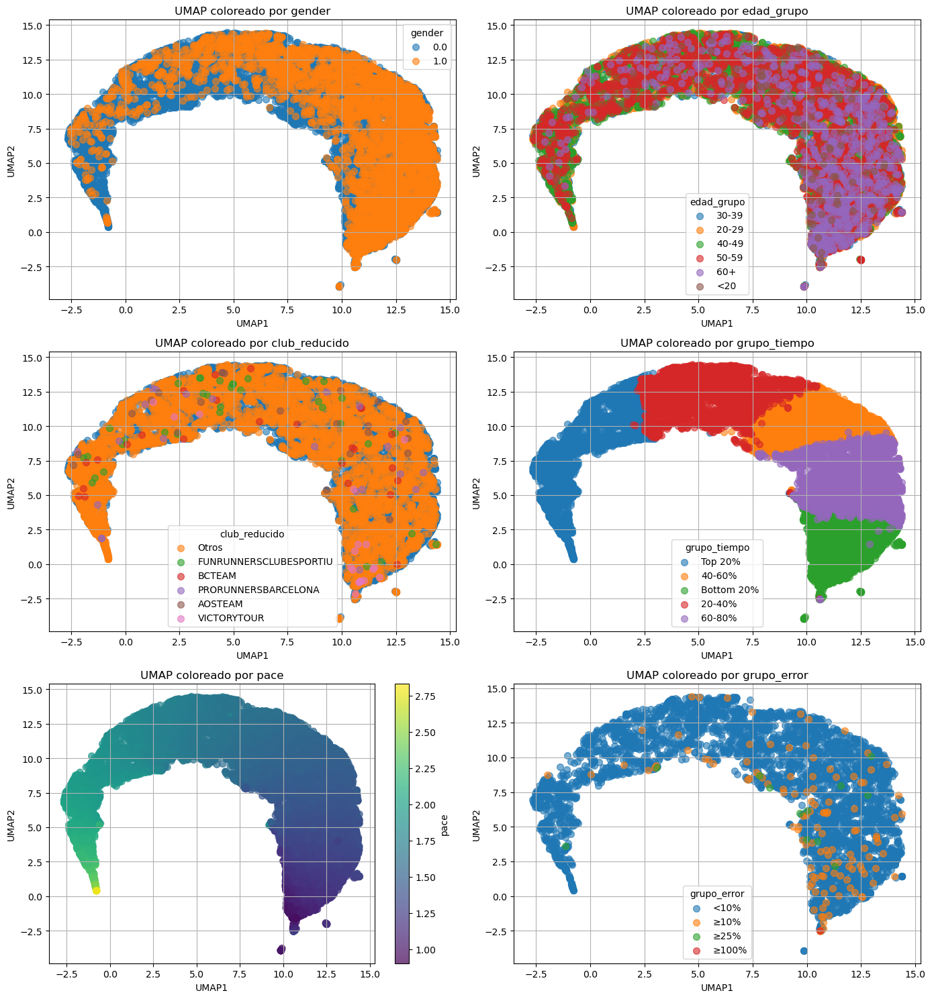

In [ ]:
embedding, df_umap = umap_analysis(df_plot_mar, split_cols_maraton, n_neighbors=30, min_dist=0.1, metric='euclidean')

In [ ]:
'''
def umap_multi_params(df_wide, split_cols, param_list, figsize=(15, 10)):

    """
    Aplica UMAP sobre los splits usando múltiples conjuntos de parámetros
    y genera gráficos de los embeddings en 2D sin colorear por variables.
    
    Parámetros:
    - df_wide: DataFrame con los splits.
    - split_cols: lista de columnas de splits.
    - param_list: lista de diccionarios con parámetros de UMAP, 
                  ejemplo: [{'n_neighbors':15,'min_dist':0.1,'metric':'euclidean'}]
    - figsize: tamaño de la figura (ancho, alto)
    
    Retorna:
    - embeddings_dict: diccionario con clave=parámetros, valor=embedding 2D
    """
    
    X = df_wide[split_cols].values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    embeddings_dict = {}
    n_plots = len(param_list)
    n_cols = 2
    n_rows = (n_plots + 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()
    
    for i, params in enumerate(param_list):
        n_neighbors = params.get('n_neighbors', 30)
        min_dist = params.get('min_dist', 0.1)
        metric = params.get('metric', 'euclidean')
        
        reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist,
                            metric=metric, random_state=42)
        embedding = reducer.fit_transform(X_scaled)
        embeddings_dict[(n_neighbors, min_dist, metric)] = embedding
        
        ax = axes[i]
        ax.scatter(embedding[:, 0], embedding[:, 1], s=20, alpha=0.7)
        ax.set_title(f'n_neighbors={n_neighbors}, min_dist={min_dist}, metric={metric}')
        ax.set_xlabel('UMAP1')
        ax.set_ylabel('UMAP2')
        ax.grid(True)
    
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()
    
    return embeddings_dict
'''


'\ndef umap_multi_params(df_wide, split_cols, param_list, figsize=(15, 10)):\n\n    """\n    Aplica UMAP sobre los splits usando múltiples conjuntos de parámetros\n    y genera gráficos de los embeddings en 2D sin colorear por variables.\n\n    Parámetros:\n    - df_wide: DataFrame con los splits.\n    - split_cols: lista de columnas de splits.\n    - param_list: lista de diccionarios con parámetros de UMAP, \n                  ejemplo: [{\'n_neighbors\':15,\'min_dist\':0.1,\'metric\':\'euclidean\'}]\n    - figsize: tamaño de la figura (ancho, alto)\n\n    Retorna:\n    - embeddings_dict: diccionario con clave=parámetros, valor=embedding 2D\n    """\n\n    X = df_wide[split_cols].values\n    scaler = StandardScaler()\n    X_scaled = scaler.fit_transform(X)\n\n    embeddings_dict = {}\n    n_plots = len(param_list)\n    n_cols = 2\n    n_rows = (n_plots + 1) // n_cols\n\n    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)\n    axes = axes.flatten()\n\n    for i, params in enum

In [ ]:
'''
param_list = [
    {'n_neighbors': 15, 'min_dist': 0.0, 'metric': 'euclidean'},  
    {'n_neighbors': 15, 'min_dist': 0.1, 'metric': 'euclidean'},  
    {'n_neighbors': 30, 'min_dist': 0.1, 'metric': 'euclidean'},  
    {'n_neighbors': 50, 'min_dist': 0.5, 'metric': 'euclidean'},
    {'n_neighbors': 30, 'min_dist': 0.2, 'metric': 'cosine'},    
]

embeddings_dict = umap_multi_params(df_wide, split_cols, param_list)
'''

"\nparam_list = [\n    {'n_neighbors': 15, 'min_dist': 0.0, 'metric': 'euclidean'},  \n    {'n_neighbors': 15, 'min_dist': 0.1, 'metric': 'euclidean'},  \n    {'n_neighbors': 30, 'min_dist': 0.1, 'metric': 'euclidean'},  \n    {'n_neighbors': 50, 'min_dist': 0.5, 'metric': 'euclidean'},\n    {'n_neighbors': 30, 'min_dist': 0.2, 'metric': 'cosine'},    \n]\n\nembeddings_dict = umap_multi_params(df_wide, split_cols, param_list)\n"

### DBSCAN

In [ ]:
def plot_k_distance_curve(df_wide_clean, ordered_splits, k=10, figsize=(8, 5)):
    """
    Calcula y grafica la curva de distancias al k-ésimo vecino
    para ayudar a seleccionar eps en DBSCAN.

    Parámetros
    ----------
    df_wide_clean : DataFrame
        DataFrame con los splits limpios (sin outliers y transformados).
    ordered_splits : list
        Lista ordenada de splits a usar como features.
    k : int, opcional (default=10)
        Número de vecinos para la curva k-distance.
    figsize : tuple, opcional
        Tamaño de la figura del plot.

    Returns
    -------
    distances_sorted : np.array
        Vector con las distancias ordenadas al k-ésimo vecino.
    X_scaled : np.array
        Matriz de features escalada.
    """
    
    X = df_wide_clean[ordered_splits].values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    neighbors = NearestNeighbors(n_neighbors=k)
    neighbors_fit = neighbors.fit(X_scaled)
    distances, indices = neighbors_fit.kneighbors(X_scaled)

    distances_sorted = np.sort(distances[:, k-1])

    plt.figure(figsize=figsize)
    plt.plot(distances_sorted)
    plt.xlabel("Puntos ordenados")
    plt.ylabel(f"Distancia al {k}-ésimo vecino")
    plt.title("Curva k-distancia para elegir eps")
    plt.grid(True)
    plt.show()

    return distances_sorted, X_scaled

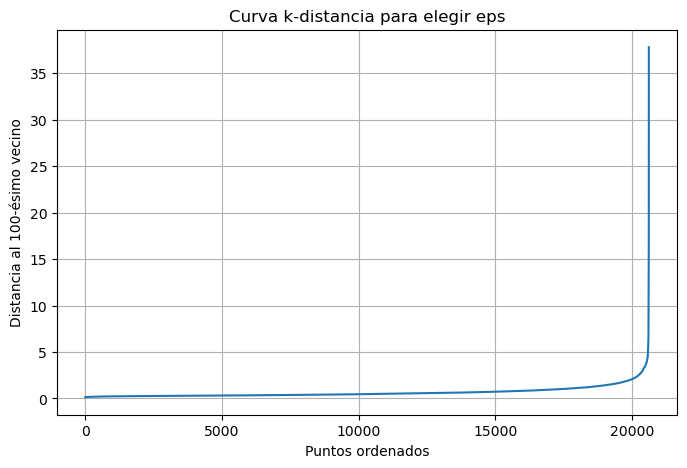

In [ ]:
distances_sorted_mar, X_scaled_mar = plot_k_distance_curve(
    df_wide_maraton, split_cols_maraton, k=100
)

In [ ]:
def dbscan_clustering(df_wide_clean, X_scaled, eps=0.8, min_samples=100, figsize=(8, 6)):
    """
    Ejecuta clustering DBSCAN sobre X_scaled, asigna etiquetas al dataframe
    y grafica el resultado usando PCA (2D).

    Parámetros
    ----------
    df_wide_clean : DataFrame
        DataFrame con los datos limpios donde se añadirá la columna dbscan_label.
    X_scaled : array
        Matriz de características escalada (salida de la función k-distance).
    eps : float, opcional
        Radio máximo para considerar vecinos (parámetro clave de DBSCAN).
    min_samples : int, opcional
        Mínimo de puntos requeridos para formar un cluster.
    figsize : tuple, opcional
        Tamaño de la figura del plot.

    Returns
    -------
    df_out : DataFrame
        DataFrame con cluster asignado en 'dbscan_label'.
    n_clusters : int
        Número de clusters detectados (excluyendo outliers).
    n_outliers : int
        Número de puntos marcados como -1 (outliers).
    pca_components : array
        Coordenadas PCA transformadas (2D).
    """

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan_labels = dbscan.fit_predict(X_scaled)

    df_out = df_wide_clean.copy()
    df_out["dbscan_label"] = dbscan_labels

    n_clusters = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
    n_outliers = list(dbscan_labels).count(-1)

    print(f"Número de clusters detectados: {n_clusters}")
    print(f"Número de outliers: {n_outliers}")

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    plt.figure(figsize=figsize)
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=dbscan_labels, cmap="tab20", s=50)
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.title(f"Clusters detectados por DBSCAN (eps={eps}, min_samples={min_samples})")
    plt.colorbar(label="Etiqueta de cluster (−1 = outlier)")
    plt.grid(True)
    plt.show()

    return df_out, n_clusters, n_outliers, X_pca

Número de clusters detectados: 1
Número de outliers: 52


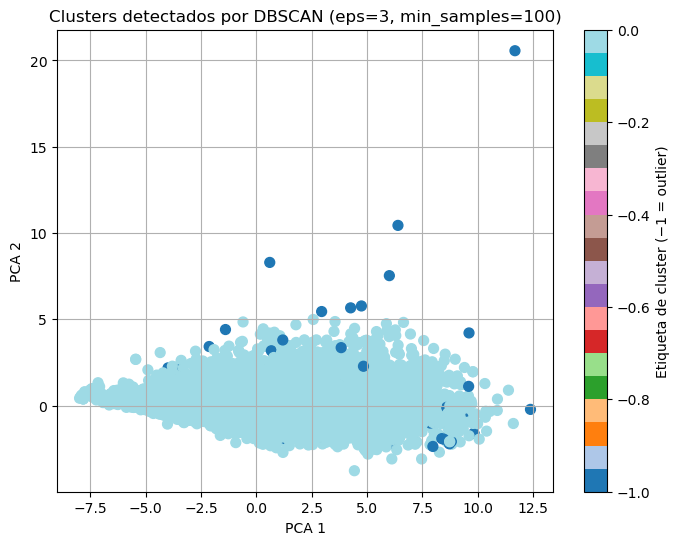

In [ ]:
df_dbscan_mar, n_clusters_mar, n_outliers_mar, X_pca_mar = dbscan_clustering(
    df_wide_maraton,
    X_scaled_mar,
    eps=3,
    min_samples=100
)

In [ ]:
def analizar_outliers_dbscan(df, ordered_splits, label_col='dbscan_label'):
    """
    Separa outliers e inliers según DBSCAN y genera estadísticas + boxplots comparativos.

    Parámetros:
        df : DataFrame con datos limpios y columna dbscan_label
        ordered_splits : lista de columnas de splits en orden
        label_col : nombre de columna donde DBSCAN guardó las etiquetas (default: 'dbscan_label')
    """

    outliers = df[df[label_col] == -1]
    inliers = df[df[label_col] != -1]

    print(f"Número de outliers: {len(outliers)}")
    print(f"Número de puntos en clusters: {len(inliers)}\n")

    print("---- Estadísticas de los puntos en clusters ----")
    print(inliers[ordered_splits].describe())
    print("\n---- Estadísticas de los outliers ----")
    print(outliers[ordered_splits].describe())

    plt.figure(figsize=(10,6))

    plt.boxplot(
        [inliers[split] for split in ordered_splits],
        positions=np.arange(len(ordered_splits))*2 - 0.4,
        widths=0.6
    )

    plt.boxplot(
        [outliers[split] for split in ordered_splits],
        positions=np.arange(len(ordered_splits))*2 + 0.4,
        widths=0.6
    )

    plt.xticks(np.arange(len(ordered_splits))*2, ordered_splits)

    plt.ylabel("Tiempo en split (segundos)")
    plt.title("Comparación entre puntos en clusters (izquierda) y outliers (derecha)")
    plt.grid(True)
    plt.show()

    return inliers, outliers

Número de outliers: 52
Número de puntos en clusters: 20561

---- Estadísticas de los puntos en clusters ----
                 5K           10K           15K           20K         Media  \
count  20561.000000  20561.000000  20561.000000  20561.000000  20561.000000   
mean    1580.148011   1579.231107   1589.303210   1588.804959    359.281425   
std      232.378868    245.799371    244.421641    258.660026     70.920444   
min      710.970000    522.623000    890.850000    879.797000    193.492000   
25%     1421.465000   1412.340000   1422.879000   1412.064000    312.955000   
50%     1584.430000   1574.430000   1587.364000   1579.634000    351.874000   
75%     1729.686000   1725.803000   1734.593000   1734.890000    392.452000   
max     2450.420000   2973.949000   2762.610000   3009.039000    924.831000   

                25K           30K           35K           40K          Meta  
count  20561.000000  20561.000000  20561.000000  20561.000000  20561.000000  
mean    1262.764848   1

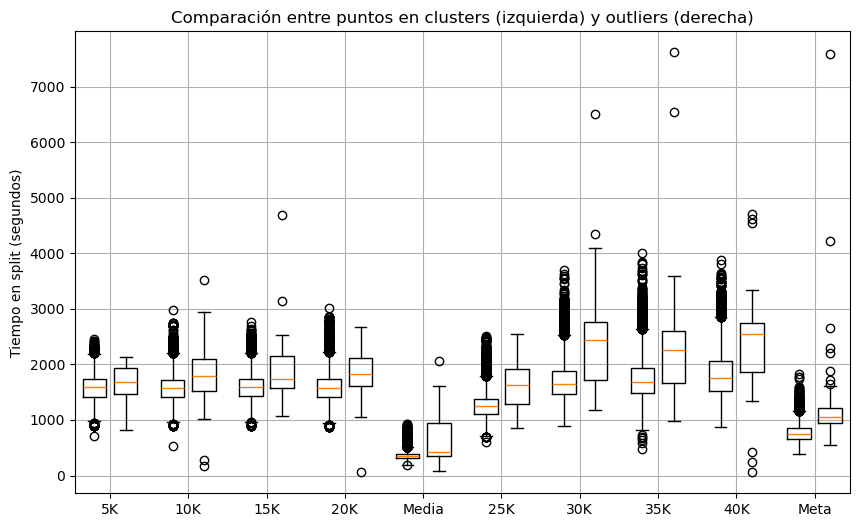

In [ ]:
inliers_mar, outliers_mar = analizar_outliers_dbscan(df_dbscan_mar, split_cols_maraton)

### Mejores atletas

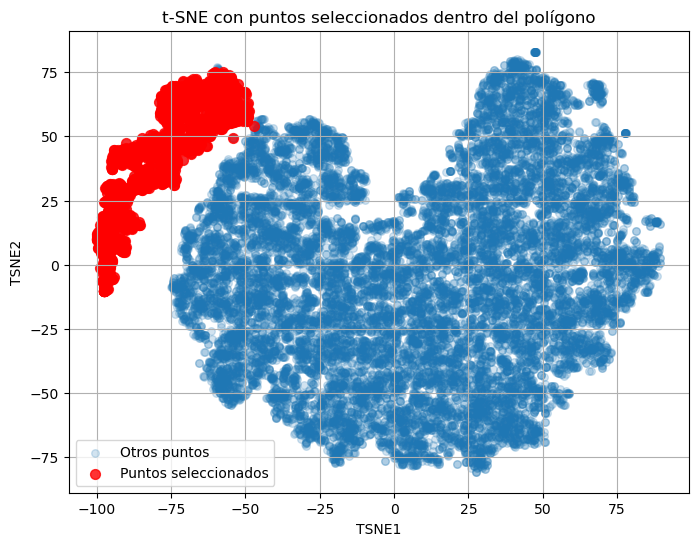

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import pandas as pd
import numpy as np

np.random.seed(42)
df_tsne.head(5)

vertices = [
    (-47,53),
    (-47,75),
    (-100, 75),
    (-100,-25),
    (-56.25, 43.75),
    (-55, 49)
]

path = Path(vertices)

mask = path.contains_points(df_tsne[["TSNE1", "TSNE2"]].values)
df_selected = df_tsne[mask].copy()

plt.figure(figsize=(8,6))
plt.scatter(df_tsne["TSNE1"], df_tsne["TSNE2"], s=30, alpha=0.2, label="Otros puntos")
plt.scatter(df_selected["TSNE1"], df_selected["TSNE2"], s=50, color='red', alpha=0.8, label="Puntos seleccionados")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.title("t-SNE con puntos seleccionados dentro del polígono")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
df_selected.shape

(2046, 127)

In [ ]:
df_no_selected = df_tsne[~df_tsne['athlete_id'].isin(df_selected['athlete_id'])].copy()

In [ ]:
df_top200 = df_selected.nsmallest(200, 'total_time_sec')
df_top200.head()

,athlete_id,race_id,event_id,10K,15K,20K,25K,30K,35K,40K,5K,Media,Meta,gender,age,club,gender_label,total_time_sec,pace_5K,pace_10K,pace_15K,pace_20K,pace_Media,pace_25K,pace_30K,pace_35K,pace_40K,pace_Meta,inc_5K_10K,inc_10K_15K,inc_15K_20K,inc_20K_Media,inc_Media_25K,inc_25K_30K,inc_30K_35K,inc_35K_40K,inc_40K_Meta,delta_pace_5K_pace_10K,delta_pace_10K_pace_15K,delta_pace_15K_pace_20K,delta_pace_20K_pace_Media,delta_pace_Media_pace_25K,delta_pace_25K_pace_30K,delta_pace_30K_pace_35K,delta_pace_35K_pace_40K,delta_pace_40K_pace_Meta,dist_acum_5K,dist_acum_10K,dist_acum_15K,dist_acum_20K,dist_acum_Media,dist_acum_25K,dist_acum_30K,dist_acum_35K,dist_acum_40K,dist_acum_Meta,time_acum_5K,time_acum_10K,time_acum_15K,time_acum_20K,time_acum_Media,time_acum_25K,time_acum_30K,time_acum_35K,time_acum_40K,time_acum_Meta,pace_mean_5K,pace_std_5K,pace_cv_5K,pace_mean_10K,pace_std_10K,pace_cv_10K,pace_mean_15K,pace_std_15K,pace_cv_15K,pace_mean_20K,pace_std_20K,pace_cv_20K,pace_mean_Media,pace_std_Media,pace_cv_Media,pace_mean_25K,pace_std_25K,pace_cv_25K,pace_mean_30K,pace_std_30K,pace_cv_30K,pace_mean_35K,pace_std_35K,pace_cv_35K,pace_mean_40K,pace_std_40K,pace_cv_40K,pace_mean_Meta,pace_std_Meta,pace_cv_Meta,fatigue_5K,fatigue_10K,fatigue_15K,fatigue_20K,fatigue_Media,fatigue_25K,fatigue_30K,fatigue_35K,fatigue_40K,fatigue_Meta,ratio_time_total_5K,ratio_time_total_10K,ratio_time_total_15K,ratio_time_total_20K,ratio_time_total_Media,ratio_time_total_25K,ratio_time_total_30K,ratio_time_total_35K,ratio_time_total_40K,ratio_time_total_Meta,PCA1,PCA2,PCA3,grupo_error,edad_grupo,club_reducido,tiempo_total,grupo_tiempo,pace,TSNE1,TSNE2
609,18a824f4-c99e-5979-9dc7-85b646108465,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,884.469,891.754,879.907,691.579,883.240,873.399,873.252,884.398,195.021,396.919,0.0,27.268994,Anta,Hombre,7453.938,5.653563,5.653109,5.606927,5.682419,5.127653,5.783866,5.660975,5.724760,5.725724,5.530096,0.071,7.285,-11.847,-684.886,496.558,191.661,-9.841,-0.147,-476.333,-0.000454,-0.046182,0.075491,-0.554766,0.656213,-0.122890,0.063785,0.000964,-0.195629,5000.0,10000.0,15000.0,20000.0,21000.0,25000.0,30000.0,35000.0,40000.0,42195.0,884.398,1768.867,2660.621,3540.528,3735.549,4427.128,5310.368,6183.767,7057.019,7453.938,5.653563,0.0,0.0,5.653336,0.000227,0.000040,5.637867,0.021878,0.003881,5.649005,0.027040,0.004787,5.544734,0.209938,0.037863,5.584590,0.211354,0.037846,5.595502,0.197493,0.035295,5.611659,0.189620,0.033790,5.624333,0.182334,0.032419,5.614909,0.175272,0.031215,1.0,0.999960,0.994512,1.005915,0.924779,1.035683,1.011701,1.020155,1.018027,0.984895,0.118648,0.118658,0.119635,0.118046,0.026163,0.092780,0.118493,0.117173,0.117153,0.053250,-7.990882,0.427880,-0.493192,No imputados,20-29,Otros,7453.938,Top 20%,2.830383,-97.484344,-10.297095
2570,2bf81c65-622b-5621-9766-7150cbac7f27,49603c2f-1b2b-457f-b82e-fed8bded1d3d,Marato,883.143,892.949,880.204,691.218,883.537,872.727,904.138,884.722,195.225,407.105,0.0,31.570157,Nike,Hombre,7494.968,5.651493,5.661597,5.599424,5.680501,5.122295,5.786886,5.659073,5.729168,5.530129,5.391729,-1.579,9.806,-12.745,-684.979,495.993,192.319,-10.810,31.411,-497.033,0.010104,-0.062173,0.081077,-0.558207,0.664592,-0.127814,0.070096,-0.199039,-0.138400,5000.0,10000.0,15000.0,20000.0,21000.0,25000.0,30000.0,35000.0,40000.0,42195.0,884.722,1767.865,2660.814,3541.018,3736.243,4427.461,5310.998,6183.725,7087.863,7494.968,5.651493,0.0,0.0,5.656545,0.005052,0.000893,5.637505,0.027241,0.004832,5.648254,0.030053,0.005321,5.543062,0.212094,0.038263,5.583699,0.213877,0.038304,5.594467,0.199761,0.035707,5.611305,0.192096,0.034234,5.602285,0.182898,0.032647,5.581230,0.184652,0.033085,1.0,1.000893,0.993245,1.005709,0.924091,1.036389,1.011548,1.021005,0.987120,0.966047,0.118042,0.117831,0.119140,0.117439,0.026047,0.092224,0.117884,0.116442,0.120633,0.054317,-7.950394,0.494422,-0.460427,No imputados,30-39,Otros,7494.968,Top 20%,2.814889,-97.455727,-10.275759
20596,d05fb3af-635c-5f61-8a45-39c2db1ef711,49603c2f

In [249]:
def comparar_estadisticas_numericas_multi(
    dfs,
    labels,
    df_base=None,
    n_cols=3
):
    """
    Compara estadísticas descriptivas y boxplots de columnas numéricas
    entre múltiples DataFrames (hasta 5 recomendado).

    Args:
        dfs: lista de DataFrames
        labels: lista de etiquetas (mismo orden que dfs)
        df_base: DataFrame para inferir columnas numéricas (por defecto dfs[0])
        n_cols: número de columnas en el grid de plots
    """

    if len(dfs) != len(labels):
        raise ValueError("dfs y labels deben tener la misma longitud")

    if len(dfs) > 5:
        raise ValueError("Máximo recomendado: 5 DataFrames")

    if df_base is None:
        df_base = dfs[0]

    numeric_cols = df_base.select_dtypes(include="number").columns

    print("=== Estadísticas descriptivas numéricas ===")
    for df, label in zip(dfs, labels):
        print(f"\n{label}:")
        display(df[numeric_cols].describe().T)

    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    axes = axes.flatten()

    for i, col in enumerate(numeric_cols):
        data = [df[col].dropna() for df in dfs]
        axes[i].boxplot(data, labels=labels)
        axes[i].set_title(col)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

=== Estadísticas descriptivas numéricas ===

Completo:


,count,mean,std,min,25%,50%,75%,max
10K,18567.0,1622.907068,2.209157e+02,176.979000,1465.127500,1604.644000,1746.965500,3522.350000
15K,18567.0,1633.126684,2.193998e+02,1059.594000,1476.392500,1613.536000,1753.610500,4695.583000
20K,18567.0,1633.406546,2.337829e+02,70.090000,1467.789500,1605.882000,1759.719000,3009.039000
25K,18567.0,1300.039607,2.074034e+02,610.149000,1152.124500,1270.350000,1403.566000,2545.028000
30K,18567.0,1758.656487,3.311831e+02,1090.940000,1517.271000,1690.540000,1921.830000,6497.670000
35K,18567.0,1796.337084,3.560220e+02,477.780000,1537.177500,1711.349000,1975.753500,7616.140000
40K,18567.0,1882.024310,3.828199e+02,58.041000,1594.081000,1798.573000,2099.730500,4704.840000
5K,18567.0,1622.725212,2.034234e+02,710.970000,1470.562500,1613.849000,1751.170500,2450.420000
Media,18567.0,370.618839,7.044350e+01,73.159000,325.594000,359.100000,398.262500,2069.043000
Meta,18567.0,791.483938,1.583531e+02,427.088000,683.863500,766.232000,871.968000,7586.074000



Seleccionado:


,count,mean,std,min,25%,50%,75%,max
10K,2046.0,1189.302150,7.771727e+01,5.226230e+02,1148.265250,1207.382500,1252.787750,1315.688000
15K,2046.0,1199.830580,7.588967e+01,8.908500e+02,1163.833000,1218.073500,1259.690250,1339.666000
20K,2046.0,1189.862978,7.640321e+01,8.797970e+02,1146.745250,1207.765000,1251.133250,1344.107000
25K,2046.0,933.543252,5.974041e+01,6.909990e+02,903.435250,947.712500,977.144250,1520.771000
30K,2046.0,1212.154284,7.746915e+01,8.828720e+02,1172.245000,1230.765000,1269.405000,1716.630000
35K,2046.0,1223.678625,8.234861e+01,8.544680e+02,1175.710000,1244.160000,1277.952500,1590.860000
40K,2046.0,1255.099411,9.677599e+01,8.732520e+02,1199.730250,1268.775000,1309.602250,1952.492000
5K,2046.0,1195.830248,7.784743e+01,8.820910e+02,1153.310250,1218.429500,1254.662000,1359.254000
Media,2046.0,262.569519,1.738443e+01,1.934920e+02,252.783750,265.761500,275.517000,381.144000
Meta,2046.0,544.708286,4.543024e+01,3.879230e+02,517.566250,546.082000,571.743750,929.073000



Top200:


,count,mean,std,min,25%,50%,75%,max
10K,200.0,1030.703480,5.523106e+01,8.831430e+02,1008.943500,1042.808500,1067.893000,1120.708000
15K,200.0,1037.961770,5.613176e+01,8.908500e+02,1005.268250,1051.486000,1082.092500,1127.071000
20K,200.0,1029.724475,5.401877e+01,8.797970e+02,1010.974500,1041.599500,1067.683000,1107.691000
25K,200.0,810.186300,4.304485e+01,6.909990e+02,791.637750,823.639500,840.946750,870.749000
30K,200.0,1049.460000,5.667035e+01,8.828720e+02,1017.698500,1062.160000,1092.177500,1175.860000
35K,200.0,1060.526395,6.296022e+01,8.727270e+02,1028.668250,1071.228500,1098.917500,1246.081000
40K,200.0,1084.444515,7.085053e+01,8.732520e+02,1046.498500,1090.502500,1119.398750,1317.972000
5K,200.0,1031.951070,5.625903e+01,8.820910e+02,1005.012750,1040.146000,1068.606250,1134.165000
Media,200.0,227.580575,1.229503e+01,1.934920e+02,223.045750,230.719000,236.052000,246.016000
Meta,200.0,477.495715,3.782515e+01,3.879230e+02,457.015250,476.480500,493.545750,640.508000


C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since M

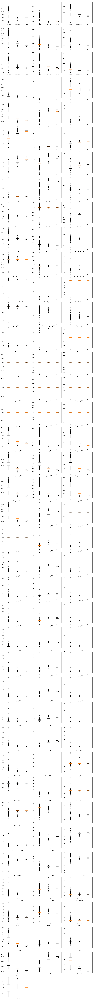

In [250]:
comparar_estadisticas_numericas_multi(
    dfs=[df_no_selected, df_selected, df_top200],
    labels=["Completo", "Seleccionado", "Top200"],
    df_base=df_no_selected
)

### Relación con los mal imputados

In [ ]:
def proporciones_error(df_group, comparison):
    total_atletas = len(df_group)
    
    comp_group = comparison[comparison['athlete_id'].isin(df_group['athlete_id'])]
    
    df_mal, df_bien, _, _, _ = analisis_mal_imputado(df_group, comp_group)
    
    n_imputados = len(comp_group['athlete_id'].unique())
    n_no_imputados = total_atletas - n_imputados
    
    errores_umbral = [10, 25, 50, 100]
    resultados = {}
    for u in errores_umbral:
        col_name_mal = f'error_mayor_{u}%'
        col_name_bien = f'error_menor_igual_{u}%'
        df_mal_u = df_mal if u == 10 else df_mal[df_mal['abs_error'] > (u/100 * df_mal['valor_real'])]
        df_bien_u = df_bien if u == 10 else df_bien[df_bien['abs_error'] <= (u/100 * df_bien['valor_real'])]
        
        n_mal_u = df_mal_u['athlete_id'].nunique()
        n_bien_u = df_bien_u['athlete_id'].nunique()
        
        resultados[f'error_mayor_{u}%'] = n_mal_u
        resultados[f'error_menor_igual_{u}%'] = n_bien_u
        resultados[f'prop_mayor_{u}%'] = n_mal_u / total_atletas * 100
        resultados[f'prop_menor_igual_{u}%'] = n_bien_u / total_atletas * 100
    
    return pd.DataFrame({
        'total_atletas': [total_atletas],
        'n_imputados': [n_imputados],
        'n_no_imputados': [n_no_imputados],
        **resultados
    })

In [ ]:
prop_no_selected = proporciones_error(df_no_selected, comparison_knn_mar)
prop_selected = proporciones_error(df_selected, comparison_knn_mar)
top200 = df_selected.nsmallest(200, 'total_time_sec')
prop_top200 = proporciones_error(top200, comparison_knn_mar)

tabla_comparativa = pd.concat(
    [prop_no_selected, prop_selected, prop_top200],
    keys=['No Selected', 'Selected', 'Top200']
)
display(tabla_comparativa)

C:\Users\mario\AppData\Local\Temp\ipykernel_21032\337520045.py:15: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_splits = df.pivot_table(index='athlete_id', columns='split', values='valor_real')
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\337520045.py:15: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_splits = df.pivot_table(index='athlete_id', columns='split', values='valor_real')
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\337520045.py:15: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
 

,,total_atletas,n_imputados,n_no_imputados,error_mayor_10%,error_menor_igual_10%,prop_mayor_10%,prop_menor_igual_10%,error_mayor_25%,error_menor_igual_25%,prop_mayor_25%,prop_menor_igual_25%,error_mayor_50%,error_menor_igual_50%,prop_mayor_50%,prop_menor_igual_50%,error_mayor_100%,error_menor_igual_100%,prop_mayor_100%,prop_menor_igual_100%
No Selected,0,18567,3717,14850,133,3581,0.716325,19.286907,12,3581,0.064631,19.286907,1,3581,0.005386,19.286907,1,3581,0.005386,19.286907
Selected,0,2046,408,1638,1,407,0.048876,19.892473,1,407,0.048876,19.892473,0,407,0.000000,19.892473,0,407,0.000000,19.892473
Top200,0,200,48,152,0,48,0.000000,24.000000,0,48,0.000000,24.000000,0,48,0.000000,24.000000,0,48,0.000000,24.000000


In [ ]:
prop_no_selected = proporciones_error(df_no_selected, comparison_regr_mar)
prop_selected = proporciones_error(df_selected, comparison_regr_mar)
top200 = df_selected.nsmallest(200, 'total_time_sec')
prop_top200 = proporciones_error(top200, comparison_regr_mar)

tabla_comparativa = pd.concat(
    [prop_no_selected, prop_selected, prop_top200],
    keys=['No Selected', 'Selected', 'Top200']
)
display(tabla_comparativa)

,,total_atletas,n_imputados,n_no_imputados,error_mayor_10%,error_menor_igual_10%,prop_mayor_10%,prop_menor_igual_10%,error_mayor_25%,error_menor_igual_25%,prop_mayor_25%,prop_menor_igual_25%,error_mayor_50%,error_menor_igual_50%,prop_mayor_50%,prop_menor_igual_50%,error_mayor_100%,error_menor_igual_100%,prop_mayor_100%,prop_menor_igual_100%
No Selected,0,18567,3709,14858,807,3709,4.346421,19.976302,108,3709,0.581677,19.976302,15,3709,0.080788,19.976302,3,3709,0.016158,19.976302
Selected,0,2046,414,1632,19,414,0.928641,20.234604,1,414,0.048876,20.234604,0,414,0.000000,20.234604,0,414,0.000000,20.234604
Top200,0,200,37,163,5,37,2.500000,18.500000,0,37,0.000000,18.500000,0,37,0.000000,18.500000,0,37,0.000000,18.500000


In [ ]:
prop_no_selected = proporciones_error(df_no_selected, comparison_mar_lgbm)
prop_selected = proporciones_error(df_selected, comparison_mar_lgbm)
top200 = df_selected.nsmallest(200, 'total_time_sec')
prop_top200 = proporciones_error(top200, comparison_mar_lgbm)

tabla_comparativa = pd.concat(
    [prop_no_selected, prop_selected, prop_top200],
    keys=['No Selected', 'Selected', 'Top200']
)
display(tabla_comparativa)

,,total_atletas,n_imputados,n_no_imputados,error_mayor_10%,error_menor_igual_10%,prop_mayor_10%,prop_menor_igual_10%,error_mayor_25%,error_menor_igual_25%,prop_mayor_25%,prop_menor_igual_25%,error_mayor_50%,error_menor_igual_50%,prop_mayor_50%,prop_menor_igual_50%,error_mayor_100%,error_menor_igual_100%,prop_mayor_100%,prop_menor_igual_100%
No Selected,0,18567,3709,14858,806,3709,4.341035,19.976302,100,3709,0.538590,19.976302,8,3709,0.043087,19.976302,2,3709,0.010772,19.976302
Selected,0,2046,414,1632,31,414,1.515152,20.234604,4,414,0.195503,20.234604,0,414,0.000000,20.234604,0,414,0.000000,20.234604
Top200,0,200,37,163,9,37,4.500000,18.500000,1,37,0.500000,18.500000,0,37,0.000000,18.500000,0,37,0.000000,18.500000


### Outliers

In [257]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
import numpy as np
import pandas as pd

def detect_outliers(df, x_col, y_col,
                    method="mahalanobis",
                    contamination=0.01,
                    random_state=42):
    X = df[[x_col, y_col]].values
    df_out = df.copy()

    if method == "mahalanobis":
        centro = X.mean(axis=0)
        cov = np.cov(X.T)
        cov_inv = np.linalg.inv(cov)
        diff = X - centro
        dist = np.sqrt(np.einsum('ij,jk,ik->i', diff, cov_inv, diff))
        df_out["score"] = dist
        threshold = np.quantile(dist, 1 - contamination)
        df_out["is_outlier"] = dist > threshold

    elif method == "lof":
        lof = LocalOutlierFactor(
            n_neighbors=20,
            contamination=contamination
        )
        labels = lof.fit_predict(X)
        df_out["score"] = -lof.negative_outlier_factor_
        df_out["is_outlier"] = labels == -1

    elif method == "isolation_forest":
        iso = IsolationForest(
            contamination=contamination,
            random_state=random_state
        )
        labels = iso.fit_predict(X)
        df_out["score"] = -iso.score_samples(X)
        df_out["is_outlier"] = labels == -1

    else:
        raise ValueError("Método no soportado")

    df_outliers = df_out[df_out["is_outlier"]].copy()
    df_outliers = df_outliers[df.columns] 

    return df_out, df_outliers

In [258]:
def plot_with_outliers(df, x_col, y_col, title=None):
    """
    Dibuja scatter 2D y resalta outliers detectados.
    """
    plt.figure(figsize=(8,6))
    plt.scatter(df[x_col], df[y_col], s=30, alpha=0.4, label='Puntos')
    outliers = df[df['is_outlier']]
    plt.scatter(outliers[x_col], outliers[y_col],
                s=90, facecolors='none', edgecolors='red', linewidths=2, label='Outliers')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    if title:
        plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

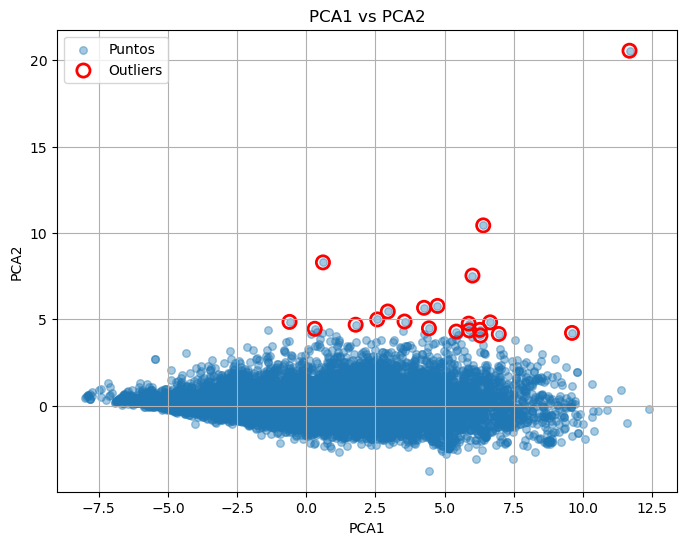

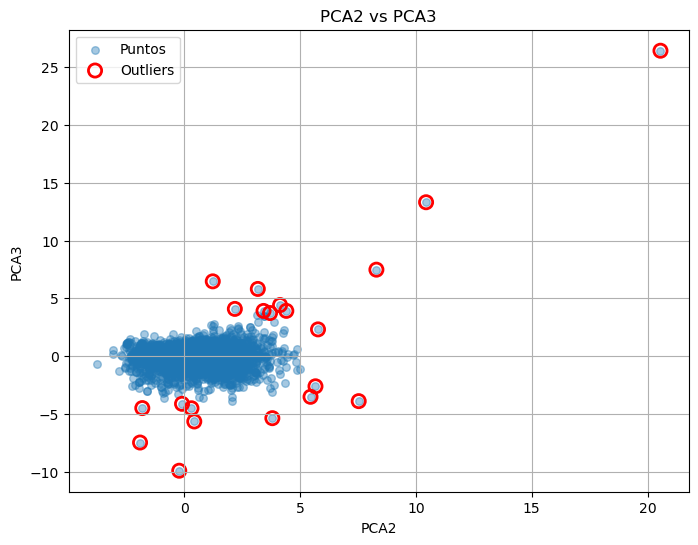

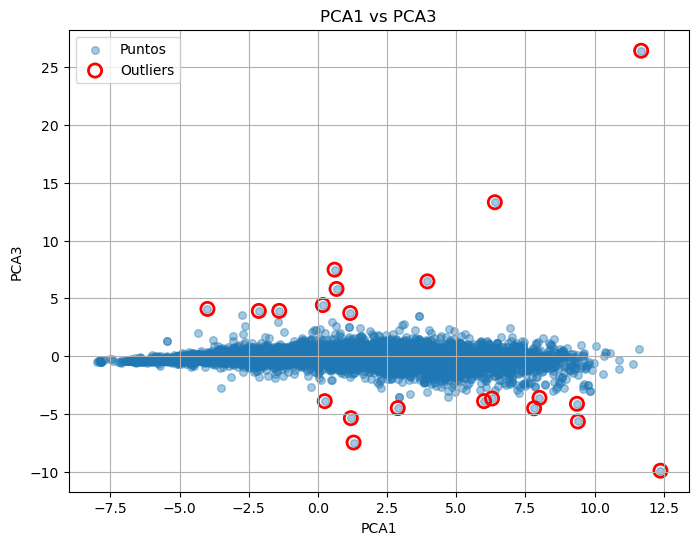

In [259]:
df_pca12, df_pca12_outliers = detect_outliers(df_plot_mar, 'PCA1', 'PCA2', method='mahalanobis', contamination=0.001)
df_pca23, df_pca23_outliers = detect_outliers(df_plot_mar, 'PCA2', 'PCA3', method='mahalanobis', contamination=0.001)
df_pca13, df_pca13_outliers = detect_outliers(df_plot_mar, 'PCA1', 'PCA3', method='mahalanobis', contamination=0.001)

plot_with_outliers(df_pca12, 'PCA1', 'PCA2', title='PCA1 vs PCA2')
plot_with_outliers(df_pca23, 'PCA2', 'PCA3', title='PCA2 vs PCA3')
plot_with_outliers(df_pca13, 'PCA1', 'PCA3', title='PCA1 vs PCA3')

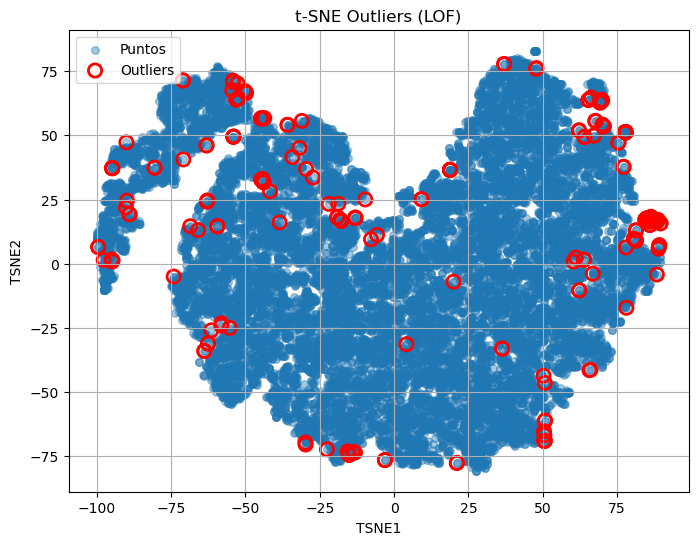

In [260]:
df_tsne_out, df_tsne_outliers = detect_outliers(
    df_tsne,
    "TSNE1",
    "TSNE2",
    method="lof",
    contamination=0.01
)

plot_with_outliers(
    df_tsne_out,
    "TSNE1",
    "TSNE2",
    title="t-SNE Outliers (LOF)"
)

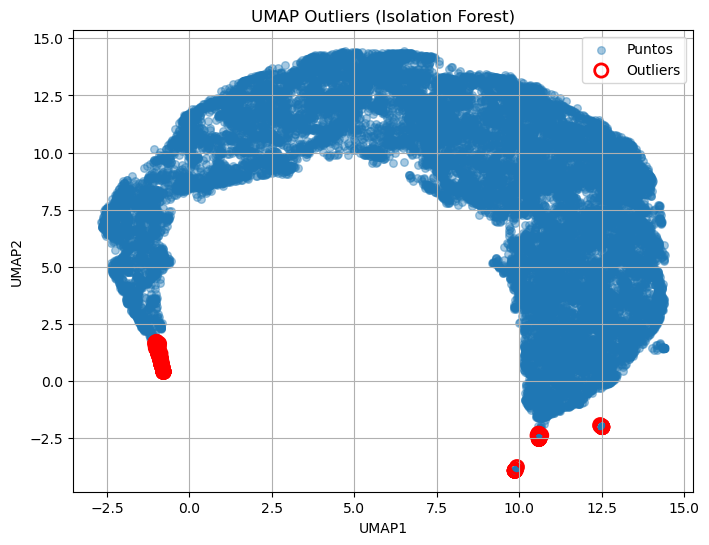

In [261]:
df_umap_out, df_umap_outliers = detect_outliers(
    df_umap,
    "UMAP1",
    "UMAP2",
    method="isolation_forest",
    contamination=0.01
)

plot_with_outliers(
    df_umap_out,
    "UMAP1",
    "UMAP2",
    title="UMAP Outliers (Isolation Forest)"
)

=== Estadísticas descriptivas numéricas ===

Completo:


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib

,count,mean,std,min,25%,50%,75%,max
10K,20653.0,1.579796e+03,2.477729e+02,1.769790e+02,1412.566000,1574.528000,1726.029000,3.522350e+03
15K,20653.0,1.590037e+03,2.464115e+02,8.908500e+02,1423.085000,1587.561000,1734.821000,4.695583e+03
20K,20653.0,1.589286e+03,2.595350e+02,7.009000e+01,1412.461000,1579.965000,1735.616000,3.009039e+03
25K,20653.0,1.263617e+03,2.261330e+02,6.101490e+02,1111.846000,1244.460000,1382.592000,2.545028e+03
30K,20653.0,1.704295e+03,3.550348e+02,8.828720e+02,1464.102000,1655.713000,1887.930000,6.497670e+03
35K,20653.0,1.739307e+03,3.796062e+02,4.777800e+02,1477.820000,1675.740000,1940.050000,7.616140e+03
40K,20653.0,1.819673e+03,4.099693e+02,5.804100e+01,1523.932000,1749.260000,2055.669000,4.704840e+03
5K,20653.0,1.580263e+03,2.327052e+02,7.109700e+02,1421.465000,1584.500000,1729.893000,2.450420e+03
Media,20653.0,3.598719e+02,7.444207e+01,7.315900e+01,312.988000,351.978000,392.585000,2.069043e+03
Meta,20653.0,7.669356e+02,1.679936e+02,3.879230e+02,654.021000,746.983000,858.195000,7.586074e+03



pca12:


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib

,count,mean,std,min,25%,50%,75%,max
10K,21.0,1.598821e+03,2.138823e+02,1.240782e+03,1452.988000,1607.095000,1726.571000,2.070337e+03
15K,21.0,1.620902e+03,2.138212e+02,1.254544e+03,1452.257000,1656.639000,1755.616000,2.114071e+03
20K,21.0,1.650398e+03,2.466206e+02,1.237565e+03,1481.550000,1667.054000,1807.971000,2.302699e+03
25K,21.0,1.412641e+03,2.654176e+02,9.812110e+02,1237.503000,1332.731000,1618.963000,1.969596e+03
30K,21.0,2.200298e+03,5.280763e+02,1.292910e+03,1726.460000,2330.034000,2581.702000,2.994058e+03
35K,21.0,3.214793e+03,1.452969e+03,1.351800e+03,2468.570000,2987.370000,3527.799000,7.616140e+03
40K,21.0,3.173622e+03,7.565807e+02,1.668531e+03,2868.283000,3090.633000,3600.936000,4.704840e+03
5K,21.0,1.569084e+03,1.749075e+02,1.251230e+03,1459.831000,1595.847000,1685.794000,1.830063e+03
Media,21.0,3.929784e+02,9.148379e+01,2.746530e+02,342.269000,377.183000,407.717000,6.735540e+02
Meta,21.0,1.781131e+03,1.519486e+03,8.342890e+02,1135.009000,1382.489000,1451.550000,7.586074e+03



pca23:


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib

,count,mean,std,min,25%,50%,75%,max
10K,21.0,1.548036e+03,2.610145e+02,1.160535e+03,1384.208000,1533.206000,1688.785000,2.047047e+03
15K,21.0,1.552611e+03,2.534140e+02,1.164884e+03,1425.275000,1523.432000,1681.617000,2.051021e+03
20K,21.0,1.533090e+03,4.702632e+02,7.009000e+01,1261.101000,1560.775000,1690.814000,2.476844e+03
25K,21.0,1.313467e+03,3.296435e+02,9.104130e+02,1065.230000,1237.503000,1474.390000,1.915325e+03
30K,21.0,2.109182e+03,1.180902e+03,1.177940e+03,1446.530000,1726.460000,2378.390000,6.497670e+03
35K,21.0,2.467134e+03,1.696897e+03,1.190280e+03,1466.750000,1749.880000,2818.136000,7.616140e+03
40K,21.0,2.136159e+03,1.178340e+03,5.804100e+01,1668.531000,2056.249000,2703.442000,4.704840e+03
5K,21.0,1.520206e+03,2.246082e+02,1.169155e+03,1344.410000,1525.675000,1675.403000,1.943411e+03
Media,21.0,6.026029e+02,5.034838e+02,2.570130e+02,311.478000,351.061000,880.445000,2.069043e+03
Meta,21.0,1.819666e+03,1.563277e+03,6.335260e+02,961.536000,1596.564000,1818.072000,7.586074e+03


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



pca13:


c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib\function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
c:\Users\mario\anaconda3\Lib\site-packages\numpy\lib

,count,mean,std,min,25%,50%,75%,max
10K,21.0,1.559679e+03,2.809373e+02,1.160535e+03,1294.000000,1533.206000,1696.273000,2.047047e+03
15K,21.0,1.566001e+03,2.797326e+02,1.164884e+03,1273.000000,1523.432000,1691.263000,2.051021e+03
20K,21.0,1.568079e+03,4.943121e+02,7.009000e+01,1261.101000,1579.852000,1886.897000,2.476844e+03
25K,21.0,1.362719e+03,3.839836e+02,9.104130e+02,1004.646000,1237.503000,1722.192000,2.089761e+03
30K,21.0,2.263382e+03,1.217486e+03,1.177940e+03,1465.406000,1830.829000,2719.995000,6.497670e+03
35K,21.0,2.246956e+03,1.392960e+03,1.190280e+03,1466.750000,1749.880000,2747.130000,7.616140e+03
40K,21.0,1.927723e+03,8.798376e+02,5.804100e+01,1514.100000,2056.249000,2666.283000,3.188529e+03
5K,21.0,1.532662e+03,2.411659e+02,1.169155e+03,1344.410000,1525.675000,1675.403000,1.943411e+03
Media,21.0,6.546773e+02,5.058300e+02,2.570130e+02,309.769000,360.053000,1009.313000,2.069043e+03
Meta,21.0,1.782165e+03,1.580027e+03,5.579000e+02,961.536000,1200.397000,1818.072000,7.586074e+03


C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since M

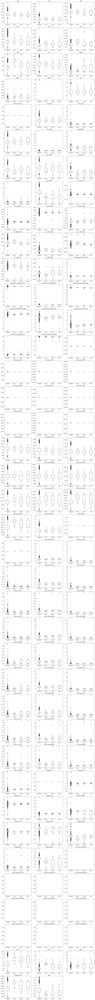

In [262]:
comparar_estadisticas_numericas_multi(
    dfs=[df_plot_mar, df_pca12_outliers, df_pca23_outliers, df_pca13_outliers],
    labels=["Completo", "pca12", "pca23", "pca13"],
    df_base=df_plot_mar
)

=== Estadísticas descriptivas numéricas ===

df_tsne:


,count,mean,std,min,25%,50%,75%,max
10K,20613.0,1.579868e+03,2.477274e+02,176.979000,1412.656000,1574.659000,1726.157000,3522.350000
15K,20613.0,1.590119e+03,2.464059e+02,890.850000,1423.143000,1587.617000,1734.956000,4695.583000
20K,20613.0,1.589381e+03,2.596116e+02,70.090000,1412.392000,1580.131000,1735.763000,3009.039000
25K,20613.0,1.263662e+03,2.260749e+02,610.149000,1111.846000,1244.683000,1382.788000,2545.028000
30K,20613.0,1.704412e+03,3.550971e+02,882.872000,1464.102000,1655.880000,1888.360000,6497.670000
35K,20613.0,1.739496e+03,3.796889e+02,477.780000,1477.859000,1675.950000,1940.636000,7616.140000
40K,20613.0,1.819797e+03,4.099689e+02,58.041000,1524.493000,1749.326000,2055.713000,4704.840000
5K,20613.0,1.580353e+03,2.327419e+02,710.970000,1421.482000,1584.666000,1730.056000,2450.420000
Media,20613.0,3.598941e+02,7.445491e+01,73.159000,312.988000,352.020000,392.613000,2069.043000
Meta,20613.0,7.669895e+02,1.680366e+02,387.923000,654.089000,747.004000,858.234000,7586.074000



df_tsne_outliers:


,count,mean,std,min,25%,50%,75%,max
10K,207.0,1651.091807,4.056885e+02,1023.141000,1283.588500,1637.657000,1891.360500,3522.350000
15K,207.0,1640.790469,3.465523e+02,1039.033000,1298.531500,1656.496000,1951.491000,2469.273000
20K,207.0,1674.152304,4.430315e+02,1028.481000,1293.988000,1643.774000,1909.909000,2856.345000
25K,207.0,1299.554792,2.972786e+02,810.288000,1052.889500,1261.217000,1495.198000,2268.479000
30K,207.0,1754.923396,4.319820e+02,1059.900000,1392.935000,1695.938000,2059.235000,3332.080000
35K,207.0,1693.842556,4.147507e+02,477.780000,1372.515000,1661.202000,1967.335000,2677.953000
40K,207.0,1759.323860,4.395270e+02,1034.232000,1400.840000,1723.995000,1995.497500,3005.923000
5K,207.0,1597.225725,3.283468e+02,821.408000,1275.633000,1655.947000,1867.170500,2308.133000
Media,207.0,380.915295,1.078131e+02,227.797000,296.944500,366.737000,429.088000,753.550000
Meta,207.0,732.409628,1.576192e+02,450.517000,591.439500,717.588000,856.140000,1313.253000


C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[i].boxplot(data, labels=labels)
C:\Users\mario\AppData\Local\Temp\ipykernel_21032\2907570268.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since M

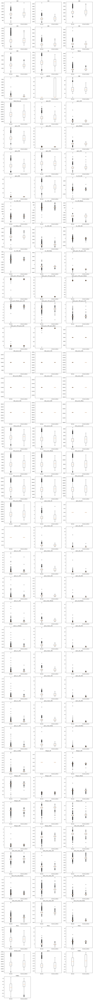

In [263]:
comparar_estadisticas_numericas_multi(
    dfs=[df_tsne, df_tsne_outliers],
    labels=["df_tsne", "df_tsne_outliers"],
    df_base=df_tsne
)

### ISOLATION FOREST

Es un método de detección de outliers **basado en aislamiento**. La idea clave es que los outliers son más fáciles de aislar que los puntos normales. Cada punto se puede aislar dividiendo recursivamente los datos en subgrupos mediante **splits aleatorios** de las features. Cuanto **menos divisiones** se necesitan para aislar un punto, más probable es que sea un outlier.

#### **Funcionamiento**

1. Se construye un conjunto de **árboles aleatorios (Isolation Trees)**:
   - Cada árbol selecciona **una feature al azar**.
   - Se elige un **valor de corte aleatorio** dentro del rango de esa feature.
   - Se divide el conjunto de datos en dos subgrupos.
   - Se repite recursivamente hasta aislar cada punto o alcanzar la profundidad máxima.

2. Para cada punto \(x_i\), se calcula la **profundidad media** a la que queda aislado en todos los árboles del bosque:
$$
h(x_i) = \text{profundidad media de aislamiento de } x_i
$$

3. El **score de outlier** se define como:
$$
s(x_i, n) = 2^{-\frac{h(x_i)}{c(n)}}
$$
donde:
- \(n\) = número de muestras usadas para el árbol  
- \(c(n)\) = media de la profundidad esperada de aislamiento en un árbol binario aleatorio  

Valores cercanos a \(s \approx 1\) indican **outliers**, mientras que valores \(s \ll 0.5\) indican **puntos normales**.

#### **Características principales**
- **No asume distribución**: ideal para tus splits de maratones que no son normales.  
- **Escalable**: funciona bien con decenas de miles de atletas y muchas variables.  
- **Controlable**: el parámetro `contamination` define el porcentaje de outliers esperado.

#### **Contexto**
- Atletas con splits **mucho más rápidos** que la media serán aislados rápidamente → outliers.  
- Atletas con splits consistentes con la mayoría serán aislados después de muchas divisiones → normales.  
- Se pueden incluir variables adicionales como edad, género y club para detectar outliers relativos a grupos específicos.

#### **Parámetros principales**

| Parámetro | Función | Efecto |
|-----------|---------|--------|
| `n_estimators` | Número de árboles | Más árboles → score más estable, más costo |
| `max_samples` | Muestras por árbol | Menos muestras → más rápido, menos exacto |
| `contamination` | Porcentaje de outliers esperado | Define umbral de decisión |
| `random_state` | Semilla aleatoria | Reproducibilidad |


In [ ]:
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(
    n_estimators=400,       # número de árboles
    max_samples="auto",     # 256 filas por árbol (suficiente)
    max_features=0.7,       # 70% de columnas aleatorias por árbol
    contamination=0.01,     # 1% de outliers esperados
    random_state=42,        # reproducibilidad
    bootstrap=False
)

In [ ]:
df_feat.head(5)

NameError: name 'df_feat' is not defined

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

exclude_cols = ['athlete_id', 'race_id', 'event_id', 'gender_label', 'club']
feature_cols = [c for c in df_feat.columns if c not in exclude_cols and df_feat[c].dtype in ['float64', 'int64']]

X = df_feat[feature_cols]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_scaled_df = pd.DataFrame(X_scaled, columns=feature_cols, index=df_feat.index)

iso_forest = IsolationForest(
    n_estimators=400,
    max_samples="auto",
    max_features=0.7,
    contamination=0.005,
    random_state=42,
    bootstrap=False
)
iso_forest.fit(X_scaled)

labels = iso_forest.predict(X_scaled)
scores = iso_forest.decision_function(X_scaled)

df_feat['iforest_label'] = labels
df_feat['is_outlier'] = labels == -1
df_feat['anomaly_score'] = scores

print("Número de outliers detectados:", df_feat['is_outlier'].sum())
print("Proporción:", df_feat['is_outlier'].mean())

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[labels==1,0], X_pca[labels==1,1], label='Inliers', alpha=0.5, s=50, color='blue')
plt.scatter(X_pca[labels==-1,0], X_pca[labels==-1,1], label='Outliers', alpha=0.7, s=50, color='red')
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("Outliers detectados por Isolation Forest")
plt.legend()
plt.grid(True)
plt.show()

mean_normales = X_scaled_df[~df_feat['is_outlier']].mean()
mean_outliers = X_scaled_df[df_feat['is_outlier']].mean()
delta = (mean_outliers - mean_normales).sort_values(ascending=False)

comparacion = pd.DataFrame({
    "media_normales": mean_normales,
    "media_outliers": mean_outliers,
    "diferencia_outlier_minus_normal": delta
}).sort_values("diferencia_outlier_minus_normal", ascending=False)

print("\n=== DIFERENCIAS ENTRE OUTLIERS Y NORMALES ===")
print(comparacion)

print("\nTOP 10 variables que más diferencian outliers de normales:")
print(comparacion.head(10))

KeyboardInterrupt: 

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

exclude_cols = ['athlete_id', 'race_id', 'event_id', 'gender_label', 'club']
feature_cols = [c for c in df_feat.columns if c not in exclude_cols and df_feat[c].dtype in ['float64', 'int64']]

X = df_feat[feature_cols]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=feature_cols, index=df_feat.index)

param_grid = {
    'n_estimators': [200, 400, 600],
    'max_samples': ['auto', 0.5, 1.0],
    'max_features': [0.5, 0.7, 1.0],
    'contamination': [0.005, 0.01, 0.02]
}

results = []

for n_est in param_grid['n_estimators']:
    for max_s in param_grid['max_samples']:
        for max_f in param_grid['max_features']:
            for cont in param_grid['contamination']:
                iso = IsolationForest(
                    n_estimators=n_est,
                    max_samples=max_s,
                    max_features=max_f,
                    contamination=cont,
                    random_state=42,
                    bootstrap=False
                )
                iso.fit(X_scaled)
                labels = iso.predict(X_scaled)
                is_outlier = labels == -1
                n_outliers = is_outlier.sum()
                avg_abs_delta = np.mean(np.abs(X_scaled[is_outlier].mean(axis=0) - X_scaled[~is_outlier].mean(axis=0)))
                results.append({
                    'n_estimators': n_est,
                    'max_samples': max_s,
                    'max_features': max_f,
                    'contamination': cont,
                    'n_outliers': n_outliers,
                    'avg_abs_delta': avg_abs_delta
                })

df_results = pd.DataFrame(results)
best_params = df_results.sort_values('avg_abs_delta').iloc[0]
print("\nMejor combinación de parámetros encontrada:")
print(best_params)

iso_best = IsolationForest(
    n_estimators=int(best_params['n_estimators']),
    max_samples=best_params['max_samples'],
    max_features=best_params['max_features'],
    contamination=best_params['contamination'],
    random_state=42,
    bootstrap=False
)
iso_best.fit(X_scaled)
labels = iso_best.predict(X_scaled)
scores = iso_best.decision_function(X_scaled)

df_feat['iforest_label'] = labels
df_feat['is_outlier'] = labels == -1
df_feat['anomaly_score'] = scores

print("\nNúmero de outliers detectados:", df_feat['is_outlier'].sum())
print("Proporción:", df_feat['is_outlier'].mean())

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[labels==1,0], X_pca[labels==1,1], label='Inliers', alpha=0.5, s=50, color='blue')
plt.scatter(X_pca[labels==-1,0], X_pca[labels==-1,1], label='Outliers', alpha=0.7, s=50, color='red')
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("Outliers detectados por Isolation Forest (mejor combinación de parámetros)")
plt.legend()
plt.grid(True)
plt.show()

mean_normales = X_scaled_df[~df_feat['is_outlier']].mean()
mean_outliers = X_scaled_df[df_feat['is_outlier']].mean()
delta = (mean_outliers - mean_normales).sort_values(ascending=False)

comparacion = pd.DataFrame({
    "media_normales": mean_normales,
    "media_outliers": mean_outliers,
    "diferencia_outlier_minus_normal": delta
}).sort_values("diferencia_outlier_minus_normal", ascending=False)

print("\n=== DIFERENCIAS ENTRE OUTLIERS Y NORMALES ===")
print(comparacion)
print("\nTOP 10 variables que más diferencian outliers de normales:")
print(comparacion.head(10))


C:\Users\mario\AppData\Local\Temp\ipykernel_8320\3965251317.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("coolwarm")


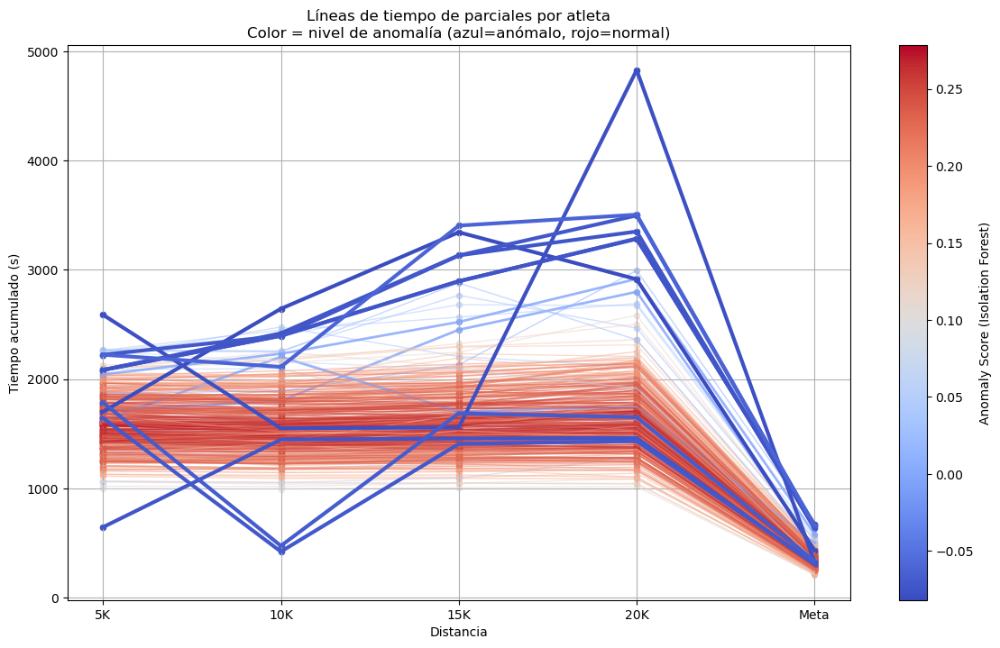

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import matplotlib as mpl
import pandas as pd

sample_df = df_feat.sample(n=290, random_state=42)
top10_outliers = df_feat[df_feat['is_outlier']].sort_values('anomaly_score').head(10)
plot_df = pd.concat([sample_df, top10_outliers]).drop_duplicates()

scores = plot_df['anomaly_score'].values
norm_scores = (scores - scores.min()) / (scores.max() - scores.min())

cmap = get_cmap("coolwarm")
fig, ax = plt.subplots(figsize=(14,8))

for i, (_, row) in enumerate(plot_df.iterrows()):
    color = cmap(norm_scores[i])
    
    lw = 3 if row['athlete_id'] in top10_outliers['athlete_id'].values else (2 if row['is_outlier'] else 1)
    alpha = 1.0 if row['athlete_id'] in top10_outliers['athlete_id'].values else (0.8 if row['is_outlier'] else 0.5)
    
    ax.plot(split_cols, row[split_cols], color=color, alpha=alpha, linewidth=lw)
    ax.scatter(split_cols, row[split_cols], color=color, s=20, alpha=alpha)

ax.set_xlabel("Distancia")
ax.set_ylabel("Tiempo acumulado (s)")
ax.set_title("Líneas de tiempo de parciales por atleta\nColor = nivel de anomalía (azul=anómalo, rojo=normal)")
ax.grid(True)

norm = mpl.colors.Normalize(vmin=scores.min(), vmax=scores.max())
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Anomaly Score (Isolation Forest)')

plt.show()

In [ ]:
def analizar_outliers_isolation(df, ordered_splits, label_col='iso_label'):
    """
    Separa outliers e inliers según Isolation Forest y genera estadísticas + boxplots comparativos.

    Parámetros:
        df : DataFrame con datos limpios y columna iso_label
        ordered_splits : lista de columnas de splits en orden
        label_col : nombre de columna donde Isolation Forest guardó las etiquetas (default: 'iso_label')
    
    Retorna:
        inliers : DataFrame con atletas normales
        outliers : DataFrame con atletas detectados como outliers
    """
    outliers = df[df[label_col] == -1]
    inliers = df[df[label_col] != -1]

    print(f"Número de outliers: {len(outliers)}")
    print(f"Número de puntos normales: {len(inliers)}\n")

    print("---- Estadísticas de los puntos normales ----")
    print(inliers[ordered_splits].describe())
    print("\n---- Estadísticas de los outliers ----")
    print(outliers[ordered_splits].describe())

    plt.figure(figsize=(10,6))

    plt.boxplot(
        [inliers[split] for split in ordered_splits],
        positions=np.arange(len(ordered_splits))*2 - 0.4,
        widths=0.6
    )

    plt.boxplot(
        [outliers[split] for split in ordered_splits],
        positions=np.arange(len(ordered_splits))*2 + 0.4,
        widths=0.6
    )

    plt.xticks(np.arange(len(ordered_splits))*2, ordered_splits)
    plt.ylabel("Tiempo en split (segundos)")
    plt.title("Comparación entre atletas normales (izquierda) y outliers (derecha)")
    plt.grid(True)
    plt.show()

    return inliers, outliers

Número de outliers: 263
Número de puntos normales: 25939

---- Estadísticas de los puntos normales ----
                 5K           10K           15K           20K          Meta
count  25939.000000  25939.000000  25939.000000  25939.000000  25939.000000
mean    1586.821763   1578.597158   1618.660632   1659.097797    337.655163
std      253.201739    261.382683    285.952140    323.319879     68.990720
min      833.634000    830.393000    837.001000    848.996000    172.494000
25%     1414.508000   1402.806000   1424.137000   1435.546000    291.683500
50%     1594.637000   1575.716000   1605.112000   1627.264000    331.577000
75%     1752.949000   1740.461000   1787.678500   1849.376500    376.266500
max     2737.931000   2794.139000   2916.531000   3137.006000   3228.229000

---- Estadísticas de los outliers ----
                5K          10K          15K          20K        Meta
count   263.000000   263.000000   263.000000   263.000000  263.000000
mean   1751.718681  1902.830920 

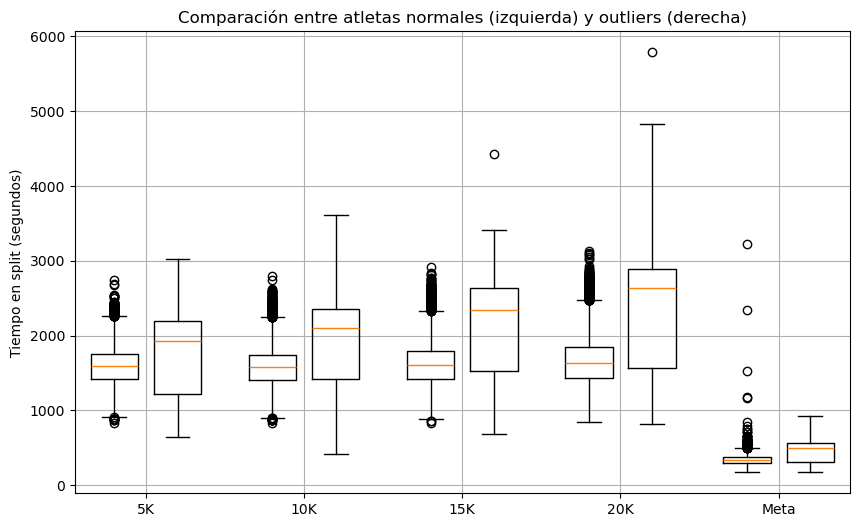

In [ ]:
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(n_estimators=100, contamination=0.01, random_state=42)
iso_forest.fit(X_scaled)
df_feat['iso_label'] = iso_forest.predict(X_scaled)

ordered_splits = ['5K','10K','15K','20K','Meta']
inliers, outliers = analizar_outliers_isolation(df_feat, ordered_splits)

In [ ]:
stats_inliers = inliers[ordered_splits].describe().T  
stats_outliers = outliers[ordered_splits].describe().T

comparison = stats_inliers.join(stats_outliers, lsuffix='_inliers', rsuffix='_outliers')
print(comparison)

      count_inliers  mean_inliers  std_inliers  min_inliers  25%_inliers  \
5K          25939.0   1586.821763   253.201739      833.634    1414.5080   
10K         25939.0   1578.597158   261.382683      830.393    1402.8060   
15K         25939.0   1618.660632   285.952140      837.001    1424.1370   
20K         25939.0   1659.097797   323.319879      848.996    1435.5460   
Meta        25939.0    337.655163    68.990720      172.494     291.6835   

      50%_inliers  75%_inliers  max_inliers  count_outliers  mean_outliers  \
5K       1594.637    1752.9490     2737.931           263.0    1751.718681   
10K      1575.716    1740.4610     2794.139           263.0    1902.830920   
15K      1605.112    1787.6785     2916.531           263.0    2093.130909   
20K      1627.264    1849.3765     3137.006           263.0    2318.386179   
Meta      331.577     376.2665     3228.229           263.0     447.103817   

      std_outliers  min_outliers  25%_outliers  50%_outliers  75%_outliers

In [ ]:
desc_vars = ['gender']

for var in desc_vars:
    print(f"\n--- Variable: {var} ---")
    
    print("Inliers:")
    print(inliers[var].value_counts())
    print("\nOutliers:")
    print(outliers[var].value_counts())
    
    print("\nProporciones inliers:")
    print(inliers[var].value_counts(normalize=True))
    print("\nProporciones outliers:")
    print(outliers[var].value_counts(normalize=True))


--- Variable: gender ---
Inliers:
gender
0.0    15805
1.0    10134
Name: count, dtype: int64

Outliers:
gender
0.0    141
1.0    122
Name: count, dtype: int64

Proporciones inliers:
gender
0.0    0.609314
1.0    0.390686
Name: proportion, dtype: float64

Proporciones outliers:
gender
0.0    0.536122
1.0    0.463878
Name: proportion, dtype: float64


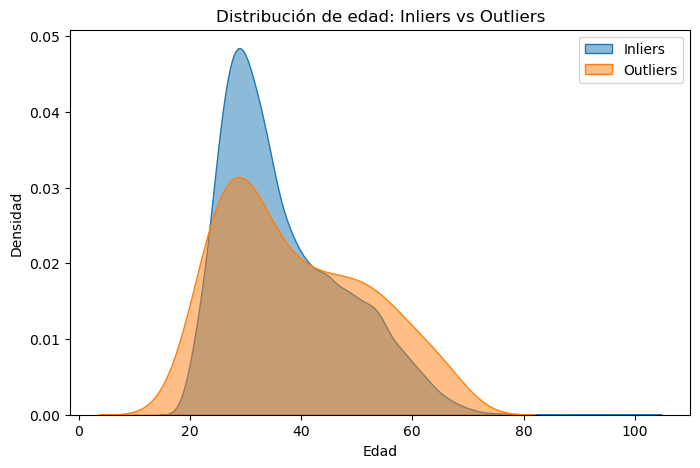

Edad inliers:
 count    25939.000000
mean        36.918251
std         11.012150
min         18.828200
25%         28.377823
50%         33.921971
75%         44.343600
max        100.596851
Name: age, dtype: float64

Edad outliers:
 count    263.000000
mean      39.046697
std       13.124370
min       16.446270
25%       27.593429
50%       36.364134
75%       49.330595
max       69.297741
Name: age, dtype: float64


In [ ]:
plt.figure(figsize=(8,5))
sns.kdeplot(inliers['age'], label='Inliers', fill=True, alpha=0.5)
sns.kdeplot(outliers['age'], label='Outliers', fill=True, alpha=0.5)
plt.title("Distribución de edad: Inliers vs Outliers")
plt.xlabel("Edad")
plt.ylabel("Densidad")
plt.legend()
plt.show()

print("Edad inliers:\n", inliers['age'].describe())
print("\nEdad outliers:\n", outliers['age'].describe())

In [ ]:
prop_inliers = (inliers['club'] == 'Independiente').mean()
print(f"Proporción de inliers con club 'Independiente': {prop_inliers:.4f} ({prop_inliers*100:.2f}%)")

prop_outliers = (outliers['club'] == 'Independiente').mean()
print(f"Proporción de outliers con club 'Independiente': {prop_outliers:.4f} ({prop_outliers*100:.2f}%)")

Proporción de inliers con club 'Independiente': 0.7159 (71.59%)
Proporción de outliers con club 'Independiente': 0.6844 (68.44%)


In [ ]:
prop_inliers = (inliers['club'] == '').mean()
print(f"Proporción de inliers con club 'Independiente': {prop_inliers:.4f} ({prop_inliers*100:.2f}%)")

prop_outliers = (outliers['club'] == '').mean()
print(f"Proporción de outliers con club 'Independiente': {prop_outliers:.4f} ({prop_outliers*100:.2f}%)")

Proporción de inliers con club 'Independiente': 0.0396 (3.96%)
Proporción de outliers con club 'Independiente': 0.0684 (6.84%)


### HDBSCAN

c:\Users\mario\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\mario\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Número de outliers detectados por HDBSCAN: 5383
Número de clusters detectados: 2


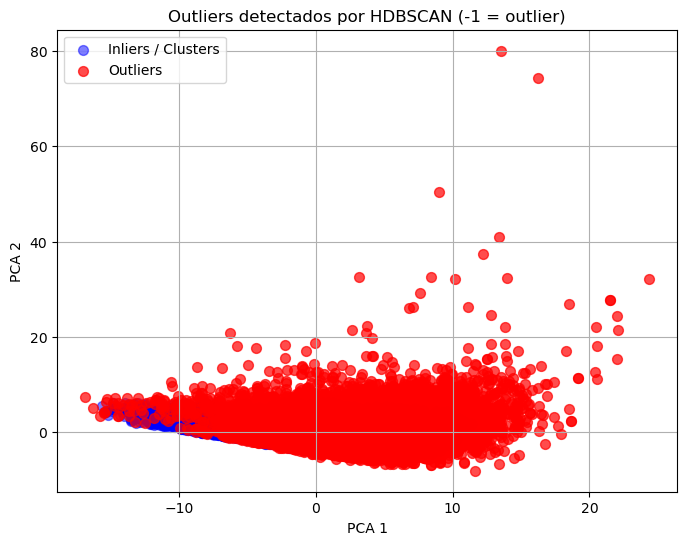

In [ ]:
import hdbscan

clusterer = hdbscan.HDBSCAN(min_cluster_size=500, min_samples=10, cluster_selection_epsilon=0.0)
cluster_labels = clusterer.fit_predict(X_scaled)  

df_out = df_feat.copy()
df_out['hdbscan_label'] = cluster_labels

n_outliers = (cluster_labels == -1).sum()
print(f"Número de outliers detectados por HDBSCAN: {n_outliers}")
print(f"Número de clusters detectados: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[cluster_labels != -1, 0], X_pca[cluster_labels != -1, 1], 
            label='Inliers / Clusters', alpha=0.5, s=50, color='blue')
plt.scatter(X_pca[cluster_labels == -1, 0], X_pca[cluster_labels == -1, 1], 
            label='Outliers', alpha=0.7, s=50, color='red')

plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("Outliers detectados por HDBSCAN (-1 = outlier)")
plt.legend()
plt.grid(True)
plt.show()


### LOF

Es un método de detección de outliers **basado en densidad local**. La idea clave es que los outliers se encuentran en regiones de baja densidad comparadas con sus vecinos. Cada punto se compara con sus vecinos más cercanos para determinar cuán diferente es su densidad local.  

#### **Funcionamiento**

1. Para cada punto $x_i$, se selecciona un conjunto de $k$ vecinos más cercanos ($N_k(x_i)$) usando una métrica de distancia (por ejemplo, Euclídea).

2. Se calcula la **distancia de alcance** para cada vecino $x_j \in N_k(x_i)$:
$$
\text{reach-dist}_k(x_i, x_j) = \max\{d(x_i, x_j), d_k(x_j)\}
$$
donde $d_k(x_j)$ es la distancia del vecino $x_j$ a su k-ésimo vecino más cercano.

3. Se calcula la **densidad local** de $x_i$ como la inversa del promedio de distancias de alcance a sus vecinos:
$$
\text{lrd}_k(x_i) = \left( \frac{ \sum_{x_j \in N_k(x_i)} \text{reach-dist}_k(x_i, x_j) }{|N_k(x_i)|} \right)^{-1}
$$

4. El **score LOF** se define comparando la densidad local de $x_i$ con la densidad local de sus vecinos:
$$
\text{LOF}_k(x_i) = \frac{ \sum_{x_j \in N_k(x_i)} \text{lrd}_k(x_j) / \text{lrd}_k(x_i) }{|N_k(x_i)|}
$$

Valores $\text{LOF}_k(x_i) \approx 1$ indican puntos **normales**, mientras que valores significativamente mayores que 1 indican **outliers**.

#### **Características principales**
- **Captura anomalías locales**: detecta atletas cuyos splits son inconsistentes respecto a sus vecinos, incluso si su tiempo total es competitivo.  
- **No requiere distribución global**: útil para tiempos de parciales que no siguen una distribución normal.  
- **Flexible**: el parámetro $k$ controla la escala de comparación, permitiendo enfocar en vecinos cercanos o más amplios.

#### **Contexto aplicado a los datos**
- Atletas con splits **muy variables** respecto a sus vecinos serán detectados como outliers, aunque estén entre los primeros en tiempo total.  
- Atletas consistentes con su grupo local serán considerados normales, incluso si son rápidos o lentos comparados con toda la población.  
- Permite diferenciar **outliers reales** de simplemente atletas rápidos o lentos.

#### **Parámetros principales**

| Parámetro | Función | Efecto |
|-----------|---------|--------|
| `n_neighbors` | Número de vecinos $k$ | Más vecinos → detección más global, menos sensible a puntos aislados |
| `contamination` | Proporción de outliers esperados | Define umbral de decisión para etiquetar outliers |
| `metric` | Métrica de distancia | Controla cómo se miden diferencias entre splits (ej. Euclídea) |

#### **Ventajas frente a Isolation Forest**
- Detecta **outliers locales**: ideal para distinguir atletas rápidos pero consistentes de atletas con splits inusuales.  
- Complementa Isolation Forest: IF detecta outliers globales, LOF detecta anomalías relativas al grupo de vecinos.


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import PCA

def lof_finetune_plot(df, feature_filter=None, n_neighbors_list=[15,20,30], contamination_list=[0.005,0.01,0.02]):
    """
    Fine-tuning de LOF y visualización de outliers en PCA.
    
    Parámetros:
        df : pd.DataFrame
            DataFrame con los parciales y métricas.
        feature_filter : list
            Columnas sobre las que aplicar LOF (si None, usa todas numéricas excepto excluidas).
        n_neighbors_list : list
            Lista de n_neighbors a probar.
        contamination_list : list
            Lista de contamination a probar.
    """
    if feature_filter is None:
        exclude_cols = ['athlete_id', 'race_id', 'event_id', 'gender_label', 'club']
        feature_filter = [c for c in df.columns if c not in exclude_cols and df[c].dtype in ['float64','int64']]
    
    X = df[feature_filter]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=feature_filter, index=df.index)
    
    results = []
    for n_neighbors in n_neighbors_list:
        for contamination in contamination_list:
            lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination, novelty=False)
            labels = lof.fit_predict(X_scaled)
            scores = -lof.negative_outlier_factor_
            
            is_outlier = labels==-1
            n_outliers = is_outlier.sum()
            perc_outliers = 100*is_outlier.mean()
            avg_abs_delta = np.mean(np.abs(X_scaled_df[is_outlier].mean() - X_scaled_df[~is_outlier].mean()))
            
            results.append({
                'n_neighbors': n_neighbors,
                'contamination': contamination,
                'n_outliers': n_outliers,
                'perc_outliers': perc_outliers,
                'avg_abs_delta': avg_abs_delta
            })
    
    df_results = pd.DataFrame(results)
    print("=== Resumen Fine-Tuning LOF ===")
    print(df_results.sort_values('avg_abs_delta'))
    
    best_row = df_results.loc[df_results['avg_abs_delta'].idxmin()]
    n_neighbors_best = int(best_row['n_neighbors'])
    contamination_best = float(best_row['contamination'])
    print(f"\nMejor combinación seleccionada: n_neighbors={n_neighbors_best}, contamination={contamination_best}")
    
    lof_best = LocalOutlierFactor(n_neighbors=n_neighbors_best, contamination=contamination_best, novelty=False)
    labels_best = lof_best.fit_predict(X_scaled)
    scores_best = -lof_best.negative_outlier_factor_
    
    df['lof_label'] = labels_best
    df['is_outlier_lof'] = labels_best==-1
    df['lof_score'] = scores_best
    
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)
    
    plt.figure(figsize=(8,6))
    plt.scatter(X_pca[labels_best==1,0], X_pca[labels_best==1,1], label='Inliers', alpha=0.5, s=50, color='blue')
    plt.scatter(X_pca[labels_best==-1,0], X_pca[labels_best==-1,1], label='Outliers', alpha=0.7, s=50, color='red')
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.title(f"Outliers detectados por LOF (n_neighbors={n_neighbors_best}, contamination={contamination_best})")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    mean_normales = X_scaled_df[~df['is_outlier_lof']].mean()
    mean_outliers = X_scaled_df[df['is_outlier_lof']].mean()
    delta = (mean_outliers - mean_normales).sort_values(ascending=False)
    
    comparacion = pd.DataFrame({
        "media_normales": mean_normales,
        "media_outliers": mean_outliers,
        "diferencia_outlier_minus_normal": delta
    }).sort_values("diferencia_outlier_minus_normal", ascending=False)
    
    print("\n=== TOP 10 variables que más diferencian outliers de normales (LOF) ===")
    print(comparacion.head(10))
    
    return df, df_results, comparacion


=== Resumen Fine-Tuning LOF ===
   n_neighbors  contamination  n_outliers  perc_outliers  avg_abs_delta
2           15          0.020         525       2.003664       0.509875
5           20          0.020         525       2.003664       0.535013
8           30          0.020         525       2.003664       0.578759
1           15          0.010         263       1.003740       0.744230
4           20          0.010         263       1.003740       0.795929
7           30          0.010         263       1.003740       0.810925
0           15          0.005         132       0.503778       1.068452
3           20          0.005         132       0.503778       1.230290
6           30          0.005         132       0.503778       1.276206

Mejor combinación seleccionada: n_neighbors=15, contamination=0.02


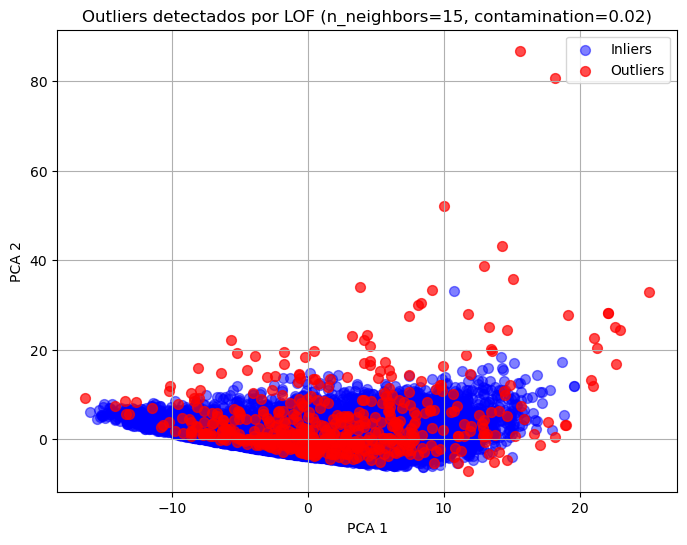


=== TOP 10 variables que más diferencian outliers de normales (LOF) ===
                       media_normales  media_outliers  \
lof_score                   -0.081251        3.973889   
pace_std_Meta               -0.042995        2.102818   
pace_cv_Meta                -0.039775        1.945321   
pace_std_15K                -0.036954        1.807388   
pace_std_20K                -0.036714        1.795621   
pace_cv_15K                 -0.035368        1.729801   
pace_cv_10K                 -0.033377        1.632404   
pace_cv_20K                 -0.033060        1.616935   
pace_std_10K                -0.031691        1.549959   
ratio_time_total_Meta       -0.013534        0.661953   

                       diferencia_outlier_minus_normal  
lof_score                                     4.055140  
pace_std_Meta                                 2.145813  
pace_cv_Meta                                  1.985096  
pace_std_15K                                  1.844343  
pace_std_20K  

In [ ]:
results = lof_finetune_plot(df_feat, n_neighbors_list=[15,20,30], contamination_list=[0.005,0.01,0.02])

### Muestreo de atletas de altas capacidades

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

def plot_comparison_times_iforest_highlight(df, n=50, m=500, n_estimators=400, contamination=0.01, random_state=42):
    """
    Compara líneas de tiempo de parciales entre:
    - n atletas aleatorios de los m mejores (menor time_acum_Meta)
    - n atletas aleatorios del resto
    
    Además, dibuja los outliers detectados en el grupo de mejores en rojo.
    
    Parámetros:
        df : pd.DataFrame
            DataFrame que contiene los parciales y 'time_acum_Meta'.
        n : int
            Número de atletas a muestrear de cada grupo.
        m : int
            Número total de atletas considerados “mejores”.
        n_estimators : int
            Número de árboles del Isolation Forest.
        contamination : float
            Proporción de outliers esperados en Isolation Forest.
        random_state : int
            Semilla para reproducibilidad.
    """
    dist_cols = ['5K', '10K', '15K', '20K', 'Meta']
    
   
    df_sorted = df.sort_values('time_acum_Meta')
    best_m = df_sorted.head(m).copy()
    rest = df_sorted.iloc[m:]
    
    best_sample = best_m.sample(n=min(n, len(best_m)), random_state=random_state)
    rest_sample = rest.sample(n=min(n, len(rest)), random_state=random_state)
    
    exclude_cols = ['athlete_id', 'race_id', 'event_id', 'gender_label', 'club']
    feature_cols = [c for c in best_m.columns if c not in exclude_cols and best_m[c].dtype in ['float64','int64']]
    
    X = best_m[feature_cols]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    iso_forest = IsolationForest(
        n_estimators=n_estimators,
        max_samples='auto',
        max_features=0.7,
        contamination=contamination,
        random_state=random_state
    )
    iso_forest.fit(X_scaled)
    
    labels = iso_forest.predict(X_scaled)  
    best_m['is_outlier'] = labels == -1
    
    perc_outliers = best_m['is_outlier'].mean() * 100
    print(f"Porcentaje de los {m} mejores atletas considerados outliers: {perc_outliers:.2f}%")
    
    plt.figure(figsize=(14,8))
    
    for _, row in best_sample[~best_sample['is_outlier']].iterrows():
        plt.plot(dist_cols, row[dist_cols], color='green', alpha=0.6, linewidth=1.5)
    
    for _, row in best_sample[best_sample['is_outlier']].iterrows():
        plt.plot(dist_cols, row[dist_cols], color='red', alpha=0.8, linewidth=2)
    
    for _, row in rest_sample.iterrows():
        plt.plot(dist_cols, row[dist_cols], color='orange', alpha=0.5, linewidth=1)
    
    plt.xlabel("Distancia")
    plt.ylabel("Tiempo acumulado (s)")
    plt.title(f"Líneas de tiempo de parciales\nVerde = mejores sin outlier | Rojo = outliers dentro de los mejores | Naranja = resto")
    plt.grid(True)
    plt.show()

Porcentaje de los 50 mejores atletas considerados outliers: 6.00%


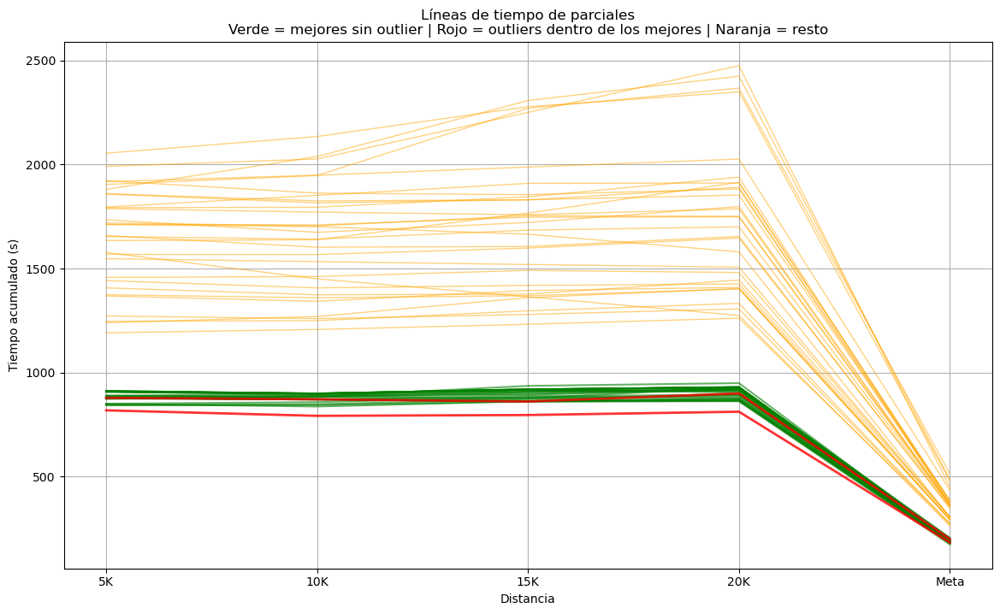

In [ ]:
plot_comparison_times_iforest_highlight(df_feat, n=30, m=50, n_estimators=400, contamination=0.05)

### pruebas

C:\Users\mario\AppData\Local\Temp\ipykernel_16712\512197020.py:41: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_wide_ac.groupby('grupo_tiempo')
C:\Users\mario\AppData\Local\Temp\ipykernel_16712\512197020.py:42: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min(tamaño_muestra, len(x))))


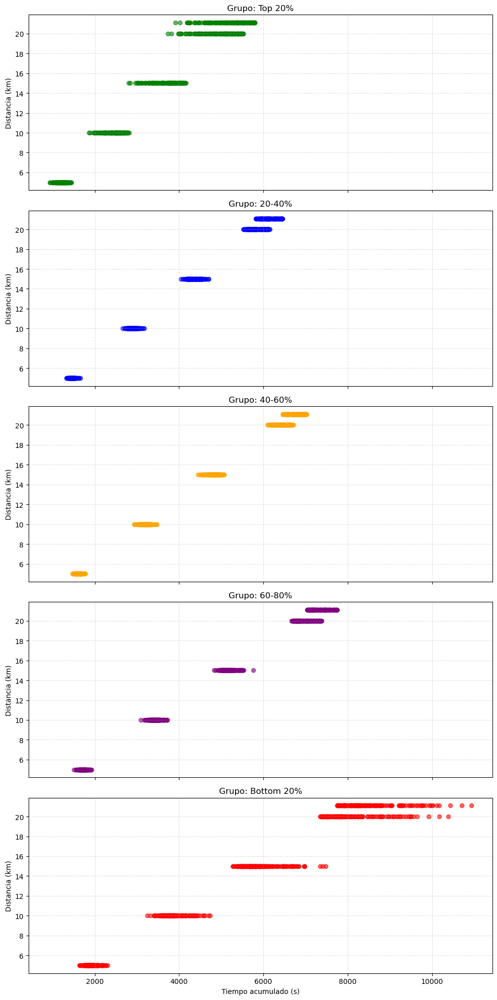

In [ ]:
splits = ['5K', '10K', '15K', '20K', 'Meta']
distancias = [5, 10, 15, 20, 21.097]

df_wide_ac = df_wide.copy()
df_wide_ac[splits] = df_wide[splits].cumsum(axis=1)

df_wide_ac['tiempo_total'] = df_wide_ac['Meta']

percentiles = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
bins = df_wide_ac['tiempo_total'].quantile(percentiles).values
labels = ['Top 20%', '20-40%', '40-60%', '60-80%', 'Bottom 20%']

df_wide_ac['grupo_tiempo'] = pd.cut(
    df_wide_ac['tiempo_total'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

tamaño_muestra = 150

muestras = (
    df_wide_ac.groupby('grupo_tiempo')
    .apply(lambda x: x.sample(min(tamaño_muestra, len(x))))
    .reset_index(drop=True)
)

splits_ac = splits  

colores_grupo = {
    'Top 20%': 'green',
    '20-40%': 'blue',
    '40-60%': 'orange',
    '60-80%': 'purple',
    'Bottom 20%': 'red'
}

grupos = muestras['grupo_tiempo'].unique()

fig, axes = plt.subplots(len(grupos), 1, figsize=(10, 4 * len(grupos)), sharex=True)

for ax, grupo in zip(axes, grupos):

    df_grupo = muestras[muestras['grupo_tiempo'] == grupo]

    for idx, row in df_grupo.iterrows():
        tiempos_acumulados = [row[s] for s in splits_ac]  

        ax.scatter(
            tiempos_acumulados,
            distancias,
            s=35,
            color=colores_grupo[grupo],
            alpha=0.6
        )

    ax.set_title(f'Grupo: {grupo}', fontsize=12)
    ax.set_ylabel('Distancia (km)')
    ax.grid(True, linestyle='--', alpha=0.4)

axes[-1].set_xlabel('Tiempo acumulado (s)')
plt.tight_layout()
plt.show()

### pruebas

k=2, BIC=27927.33
k=3, BIC=10259.87
k=4, BIC=3884.53
k=5, BIC=1713.98
k=6, BIC=1829.56
k=7, BIC=1156.16
k=8, BIC=1137.90
k=9, BIC=698.47
k=10, BIC=248.29
k=12, BIC=689.12
k=15, BIC=358.21

Mejor k según BIC: 10


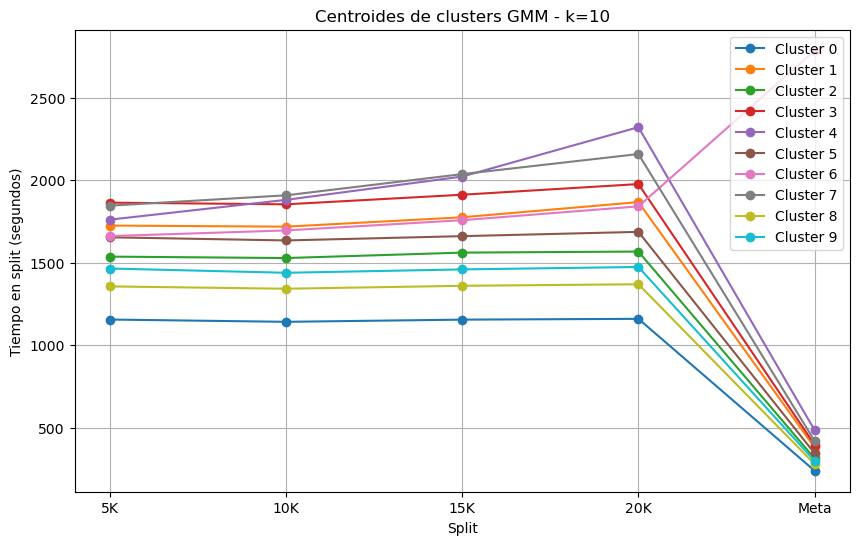

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

k_values = [2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15]
lowest_bic = np.inf
best_gmm = None
bic_scores = []

for k in k_values:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X_scaled)
    bic = gmm.bic(X_scaled)
    bic_scores.append(bic)
    print(f"k={k}, BIC={bic:.2f}")
    
    if bic < lowest_bic:
        lowest_bic = bic
        best_gmm = gmm

print(f"\nMejor k según BIC: {best_gmm.n_components}")

labels_gmm = best_gmm.predict(X_scaled)
df_wide['cluster_gmm'] = labels_gmm

probs_gmm = best_gmm.predict_proba(X_scaled)
centroids_gmm = scaler.inverse_transform(best_gmm.means_)

import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
for i, centroid in enumerate(centroids_gmm):
    plt.plot(split_cols, centroid, marker='o', label=f'Cluster {i}')
plt.xlabel("Split")
plt.ylabel("Tiempo en split (segundos)")
plt.title(f"Centroides de clusters GMM - k={best_gmm.n_components}")
plt.legend()
plt.grid(True)
plt.show()

Bandwidth estimado: 1.1979
Número de clusters encontrados: 49


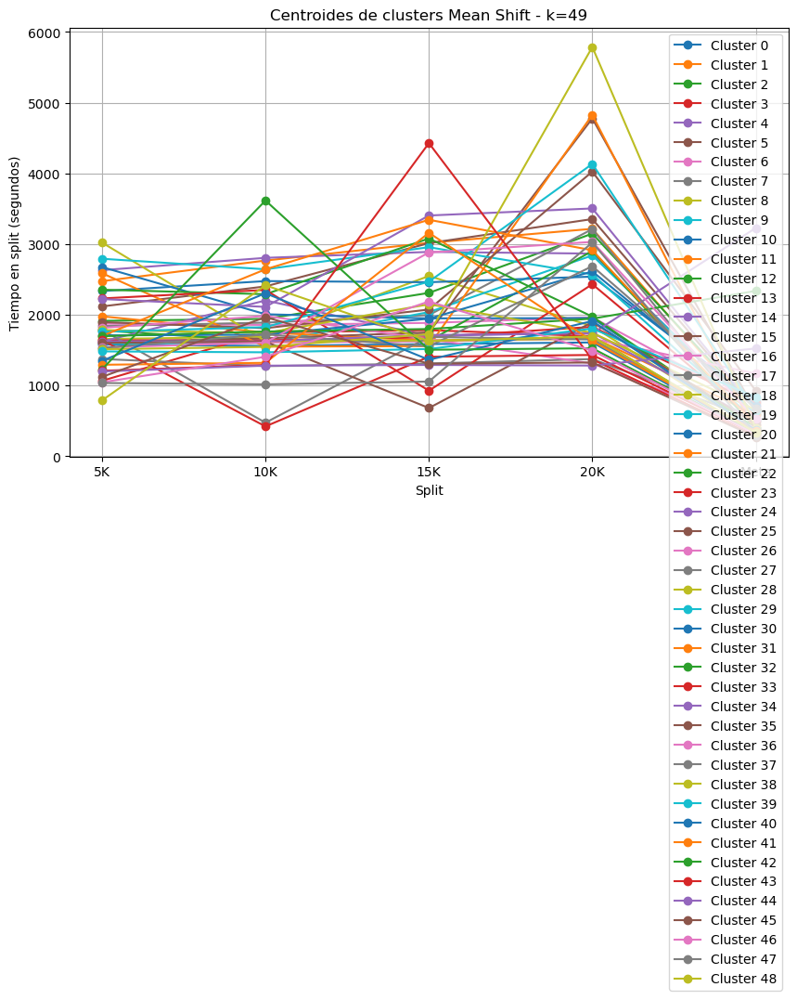

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth
import matplotlib.pyplot as plt

bandwidth = estimate_bandwidth(X_scaled, quantile=0.2, n_samples=5000)
print(f"Bandwidth estimado: {bandwidth:.4f}")

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X_scaled)

labels_ms = ms.labels_
cluster_centers = ms.cluster_centers_
n_clusters_ = len(np.unique(labels_ms))
print(f"Número de clusters encontrados: {n_clusters_}")

df_wide['cluster_meanshift'] = labels_ms

centroids_ms = scaler.inverse_transform(cluster_centers)

plt.figure(figsize=(10,6))
for i, centroid in enumerate(centroids_ms):
    plt.plot(split_cols, centroid, marker='o', label=f'Cluster {i}')
plt.xlabel("Split")
plt.ylabel("Tiempo en split (segundos)")
plt.title(f"Centroides de clusters Mean Shift - k={n_clusters_}")
plt.legend()
plt.grid(True)
plt.show()